## Importing libraries

In [1]:
import pandas as pd
import numpy as np
import time
from tqdm import tqdm_notebook

In [2]:
import glob

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pylab import rcParams

In [10]:
import seaborn as sns

In [4]:
from fbprophet import Prophet

from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score

In [414]:
import pickle

In [6]:
pd.plotting.register_matplotlib_converters()

In [7]:
from fbprophet.diagnostics import cross_validation, performance_metrics

In [8]:
from dask.distributed import Client, progress, LocalCluster
import dask

In [9]:
import dask.dataframe as dd

In [11]:
from sklearn.model_selection import TimeSeriesSplit

## Grouping neighborhoods to boroughs

Getting lookup table

In [44]:
url_lookup = 'https://s3.amazonaws.com/nyc-tlc/misc/taxi+_zone_lookup.csv'

zone_lookup = pd.read_csv(url_lookup, index_col = 'LocationID')

In [74]:
zone_lookup.Borough.unique()

array(['EWR', 'Queens', 'Bronx', 'Manhattan', 'Staten Island', 'Brooklyn',
       'Unknown'], dtype=object)

In [158]:
zone_lookup.Borough.value_counts()

Manhattan        69
Queens           69
Brooklyn         61
Bronx            43
Staten Island    20
Unknown           2
EWR               1
Name: Borough, dtype: int64

In [53]:
zone_lookup.loc[249]

Borough            Manhattan
Zone            West Village
service_zone     Yellow Zone
Name: 249, dtype: object

Importing hourly pickup demand for neighborhoods

In [14]:
demand = pd.read_csv("nyc_neighborhoods_yellow_neigh_demand_hourly.csv", parse_dates = ['ds'])

In [16]:
demand.head()

,ds,1,2,3,4,5,6,7,8,9,...,261,262,263,264,265,59,172,110,104,99
0,2018-01-01 00:00:00,NaN,NaN,1.0,87.0,NaN,NaN,41.0,NaN,NaN,...,33.0,181.0,462.0,394.0,14.0,NaN,NaN,NaN,NaN,NaN
1,2018-01-01 01:00:00,NaN,NaN,1.0,154.0,NaN,NaN,100.0,NaN,1.0,...,70.0,156.0,596.0,475.0,11.0,NaN,NaN,NaN,NaN,NaN
2,2018-01-01 02:00:00,NaN,NaN,NaN,153.0,1.0,NaN,133.0,NaN,NaN,...,81.0,94.0,442.0,362.0,20.0,NaN,NaN,NaN,NaN,NaN
3,2018-01-01 03:00:00,1.0,NaN,NaN,101.0,NaN,NaN,107.0,NaN,NaN,...,27.0,53.0,333.0,275.0,25.0,NaN,NaN,NaN,NaN,NaN
4,2018-01-01 04:00:00,3.0,NaN,NaN,77.0,NaN,NaN,106.0,NaN,NaN,...,18.0,24.0,225.0,219.0,23.0,NaN,NaN,NaN,NaN,NaN


In [17]:
demand.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Columns: 265 entries, ds to 99
dtypes: datetime64[ns](1), float64(264)
memory usage: 17.7 MB


In [26]:
demand = demand.set_index('ds')

In [51]:
lst = [zone_lookup.loc[(int(demand.columns[i]))]['Zone'] for i,col in enumerate(demand.columns)]

In [99]:
lst_brooklyn = []
lst_queens = []
lst_manhattan = []
lst_staten = []
lst_bronx = []
for i, col in enumerate(demand.columns):
    bor = zone_lookup.loc[(int(demand.columns[i]))]['Borough']
    if bor == 'Queens':
        lst_queens.append(col)
    elif bor == 'Bronx':
        lst_bronx.append(col)
    elif bor == 'Manhattan':
        lst_manhattan.append(col)
    elif bor == 'Staten Island':
        lst_staten.append(col)
    elif bor == 'Brooklyn':
        lst_brooklyn.append(col)

In [100]:
manhattan_demand = demand[lst_manhattan].sum(axis = 1)
brooklyn_demand = demand[lst_brooklyn].sum(axis = 1)
bronx_demand = demand[lst_bronx].sum(axis = 1)
queens_demand = demand[lst_queens].sum(axis = 1)
staten_demand = demand[lst_staten].sum(axis = 1)

In [159]:
staten_demand

ds
2018-01-01 00:00:00    0.0
2018-01-01 01:00:00    0.0
2018-01-01 02:00:00    1.0
2018-01-01 03:00:00    0.0
2018-01-01 04:00:00    1.0
2018-01-01 05:00:00    0.0
2018-01-01 06:00:00    0.0
2018-01-01 07:00:00    0.0
2018-01-01 08:00:00    0.0
2018-01-01 09:00:00    0.0
2018-01-01 10:00:00    0.0
2018-01-01 11:00:00    0.0
2018-01-01 12:00:00    0.0
2018-01-01 13:00:00    0.0
2018-01-01 14:00:00    0.0
2018-01-01 15:00:00    0.0
2018-01-01 16:00:00    0.0
2018-01-01 17:00:00    1.0
2018-01-01 18:00:00    0.0
2018-01-01 19:00:00    0.0
2018-01-01 20:00:00    0.0
2018-01-01 21:00:00    0.0
2018-01-01 22:00:00    0.0
2018-01-01 23:00:00    0.0
2018-01-02 00:00:00    0.0
2018-01-02 01:00:00    0.0
2018-01-02 02:00:00    0.0
2018-01-02 03:00:00    2.0
2018-01-02 04:00:00    1.0
2018-01-02 05:00:00    0.0
                      ... 
2018-12-30 18:00:00    0.0
2018-12-30 19:00:00    1.0
2018-12-30 20:00:00    0.0
2018-12-30 21:00:00    1.0
2018-12-30 22:00:00    0.0
2018-12-30 23:00:00    0.

Based on that there was very little taxi pickups I will not make predictions for Staten Island

# Time series forecasting

In [144]:
def plot_forecast(test, forecast, train, train_pred, num_pounts_to_pred):
    forecast = forecast[-num_pounts_to_pred:]
    score = mae(test.y, forecast.yhat)
    score_rmse = np.sqrt(mse(test.y, forecast.yhat))
    err = score_rmse/np.mean(test.y)
    accu = r2_score(test.y, forecast.yhat)
    accu_train = r2_score(train.y, train_pred.yhat)
    plt.figure(figsize = (15,5))
    plt.title('Forecast last {} points.\nmae ={}\nrmse ={}\nR2 ={}\nR2_train ={}\nErr ={}\nProphet'.format(num_pounts_to_pred, round(score,2), round(score_rmse,2), round(accu,2), round(accu_train,2), round(err,2)))
    plt.plot(test.ds, forecast.yhat, 'x-', label = 'forecast')
    plt.plot(test.ds, test.y, 'o-', label = 'truth')
    plt.legend()

In [110]:
def ts_cv(df, nfolds, periods = 168, freq='h', include_holidays = True, add_regressors = False):
    tscv = TimeSeriesSplit(n_splits=nfolds)
    results = []
    df = df.reset_index()
    for train_index, test_index in tqdm_notebook(tscv.split(df)):
        train, test = df.loc[train_index], df.loc[test_index]
        
        if include_holidays:
            model = Prophet(holidays=hol,yearly_seasonality=False, weekly_seasonality= True, daily_seasonality=True )
        else:
            model = Prophet(yearly_seasonality=False, weekly_seasonality= True, daily_seasonality=True)

        num_pounts_to_pred = freq

        if add_regressors!= False:
            for reg in add_regressors:
                model.add_regressor(reg)

        model.fit(train)
        future = model.make_future_dataframe(periods=periods, freq=freq, include_history=False)

        if add_regressors!= False:
            for reg in add_regressors:
                future[reg] = test.reset_index()[reg]
                future = future.fillna(method = 'ffill')

        forecast = model.predict(future)
        train_pred = model.predict(train)
        
        scoreR2 = r2_score(test[:periods].y, forecast.yhat)
        scoreR2_train = r2_score(train.y, train_pred.yhat)
        scoreRMSE = np.sqrt(mse(test[:periods].y, forecast.yhat))
        
        results.append((train, test[:periods], forecast, train_pred, model, scoreR2_train, scoreR2, scoreRMSE))
    return results

In [148]:
def run_model_for_borough(boro,date1 = '2018-11-23', date2 = '2018-11-30'):
    df = boro.reset_index()
    df.columns = ['ds', 'y']
    num_pounts_to_pred = int((pd.to_datetime(date2)-pd.to_datetime(date1))/np.timedelta64(1, 'h'))
    train = df[df.ds < date1]
    test = df[(df.ds >= date1) & (df.ds < date2)]
    m=Prophet()
    m.fit(train)
    future = m.make_future_dataframe(periods=num_pounts_to_pred, freq='h', include_history=False)
    forecast = m.predict(future)
    train_pred = m.predict(pd.DataFrame(train.ds))
    plot_forecast(test, forecast, train, train_pred, num_pounts_to_pred)
    return train, test

In [242]:
def run_model_for_borough_cv(boro, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1):
    df = boro.reset_index()
    df.columns = ['ds', 'y']
    df_exog = df.join(exog)
    
    res = ts_cv(df_exog, nfolds = nfolds, periods = periods, freq=freq, include_holidays = include_holidays, add_regressors = add_regressors)
    print(np.mean([x[-3] for x in res]), np.mean([x[-2] for x in res]), np.mean([x[-1] for x in res]))
    
    res[show][4].plot_components(res[show][2])
    
    res[show][4].plot(res[show][2])
    plt.plot(res[show][0].ds, res[show][0].y, label = 'train', c = 'black')
    plt.plot(res[show][1].ds, res[show][1].y, label = 'true', c='orange')
    plt.xlim('2018-10-27','2018-11-10')
    plt.legend()
    plot_forecast(res[show][1], res[show][2], res[show][0], res[show][3], periods)
    
    return res

## Demand forecasting for boroughs

### Taxi Pick-up demand baseline models for boroughs

Try with one borough for one week in November

In [112]:
manhattan_demand_fb = manhattan_demand.reset_index()
manhattan_demand_fb.columns = ['ds', 'y']

In [113]:
num_pounts_to_pred = 24 * 7

train = manhattan_demand_fb[manhattan_demand_fb.ds < '2018-11-23']
test = manhattan_demand_fb[(manhattan_demand_fb.ds >= '2018-11-23') & (manhattan_demand_fb.ds < '2018-11-30')]

In [115]:
m=Prophet()

In [116]:
m.fit(train)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


In [118]:
future = m.make_future_dataframe(periods=num_pounts_to_pred, freq='h', include_history=False)
future.head()

,ds
0,2018-11-23 00:00:00
1,2018-11-23 01:00:00
2,2018-11-23 02:00:00
3,2018-11-23 03:00:00
4,2018-11-23 04:00:00


In [119]:
%time forecast = m.predict(future)

CPU times: user 1.73 s, sys: 22.8 ms, total: 1.75 s
Wall time: 1.77 s


In [121]:
r2_score(test.y, forecast.yhat)

0.6819999365773864

In [123]:
%time train_pred = m.predict(pd.DataFrame(train.ds))

CPU times: user 19.1 s, sys: 294 ms, total: 19.4 s
Wall time: 16.4 s


In [130]:
r2_score(train.y, train_pred.yhat)

0.7722180211433336

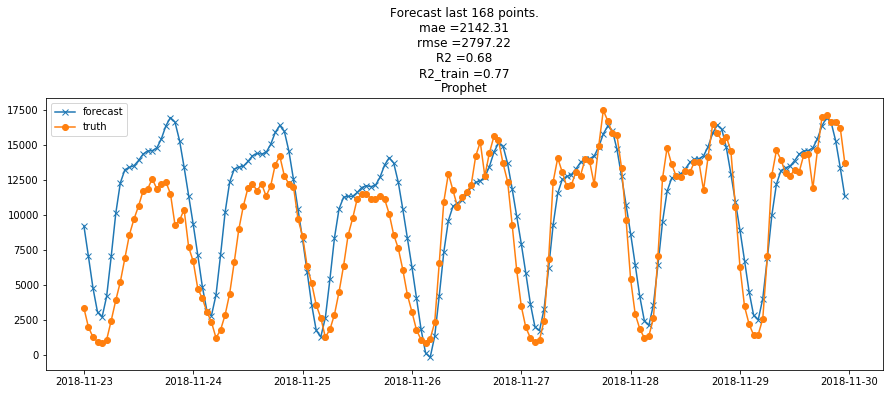

In [125]:
plot_forecast(test, forecast, train, train_pred, num_pounts_to_pred)

Running cross validation on Manhattan demand forecasting


0.7702511669601796 0.6523752513729596 2717.6419546108964


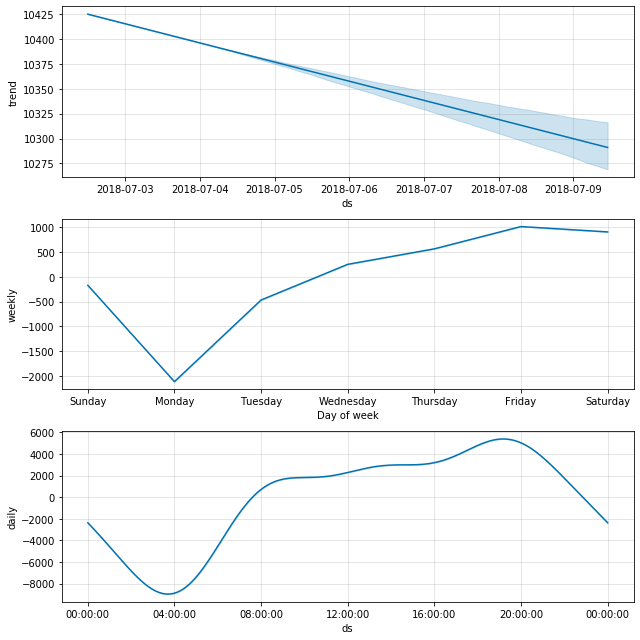

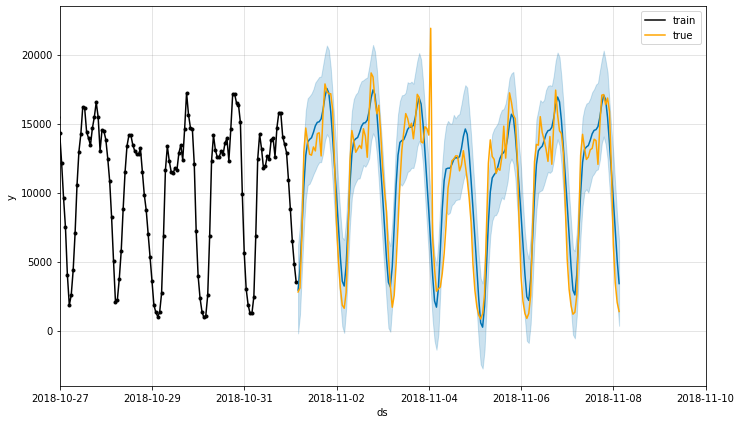

In [170]:
run_model_for_borough_cv(manhattan_demand);

#### Baseline model for Manhattan demand - R2_train = 0.77, R2_test = 0.652, RMSE = 2718

Running cross validation for other boroughs


0.2699692858206614 0.242600681261482 6.494450429114319


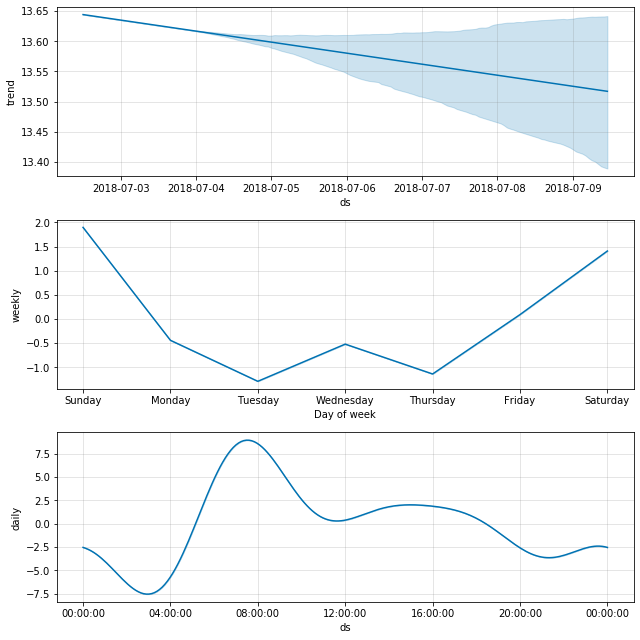

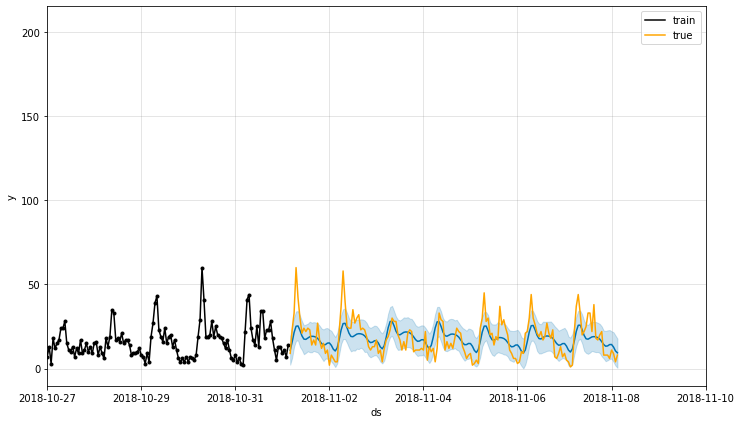

In [171]:
run_model_for_borough_cv(bronx_demand);

#### Baseline model for Bronx demand - R2_train = 0.27, R2_test = 0.243, RMSE = 6


0.42251392728589077 0.177897450985588 68.40580236895637


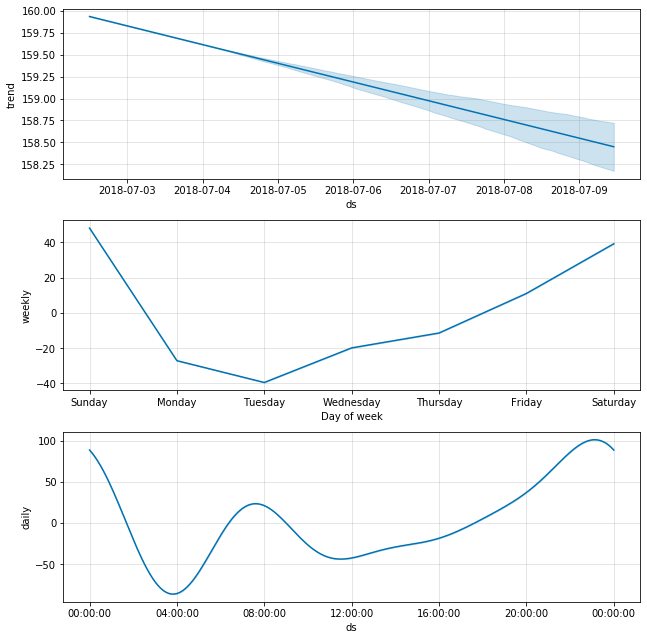

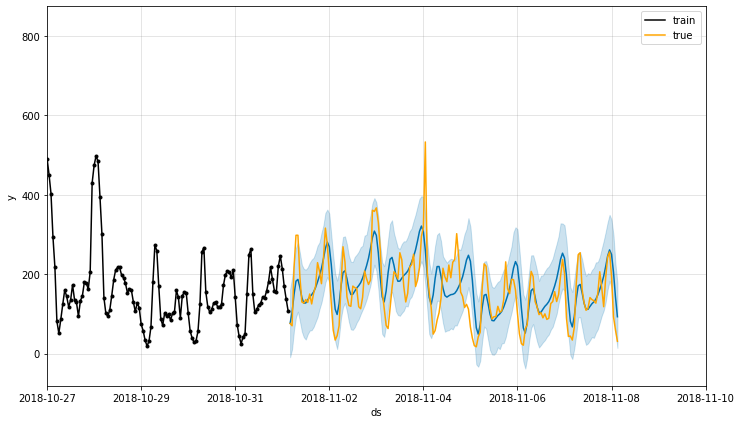

In [172]:
run_model_for_borough_cv(brooklyn_demand);

#### Baseline model for Brooklyn demand - R2_train = 0.42, R2_test = 0.18, RMSE = 68


0.830002563288734 0.7335164114704943 183.8286131448236


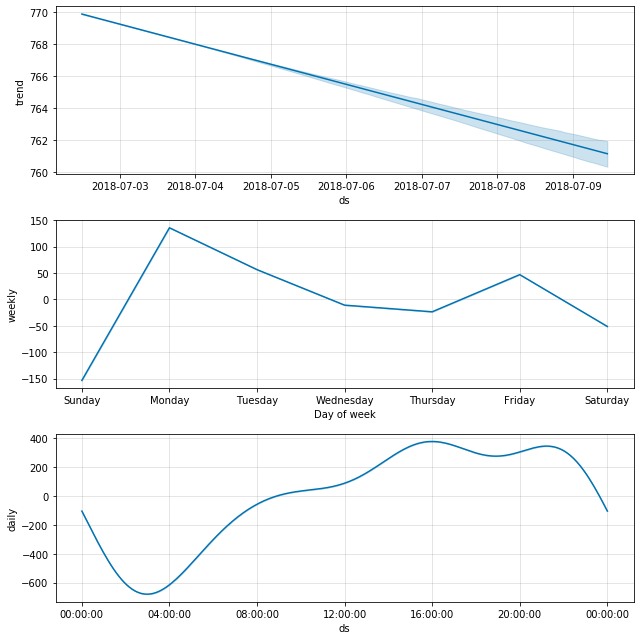

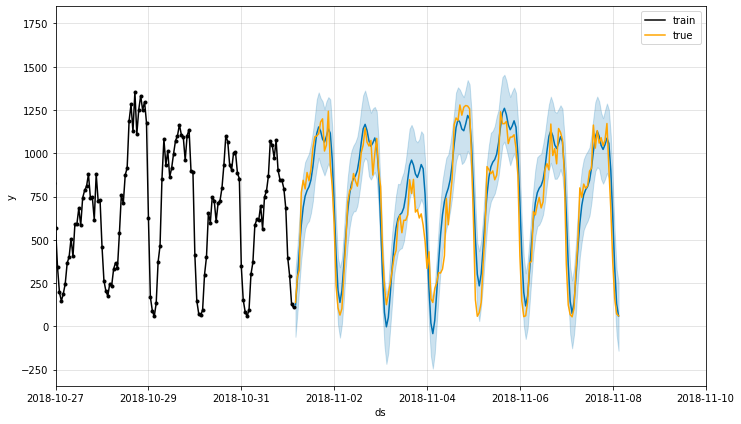

In [173]:
run_model_for_borough_cv(queens_demand);

#### Baseline model for Queens demand - R2_train = 0.83, R2_test = 0.73, RMSE = 184

### Creating holidays dataframe

Importing US holidays for 2018

In [135]:
cal = calendar()
holidays = cal.holidays(start='2018-01-01', end='2018-12-31')

In [136]:
demand_fb['date'] = demand_fb.ds.apply(lambda x: x.date())

In [137]:
demand_fb['holiday'] = np.where(pd.to_datetime(demand_fb.date).isin(holidays), 1, 0)

Creating dataframe with holidays

In [138]:
hol = demand_fb.drop(['y', 'date'], axis = 1).copy()

In [139]:
hol = hol[hol.holiday != 0]

In [140]:
hol.holiday = hol.holiday.astype('str')

In [141]:
hol.holiday = 'holiday'

In [212]:
hol.to_csv('holidays-2018.csv', index = False)

### Demand forecast per borough - adding holidays


0.7709025954121079 0.6654033483739162 2688.0106343691546


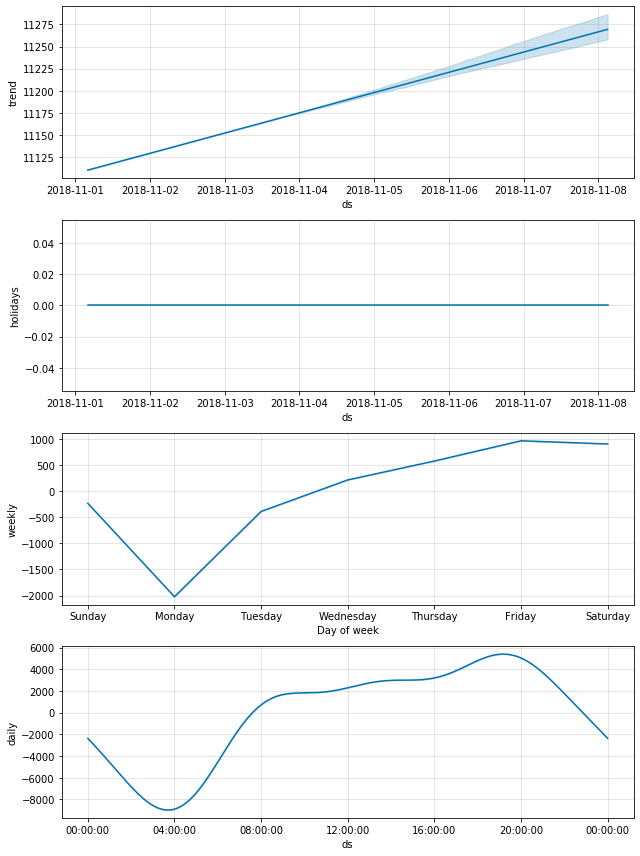

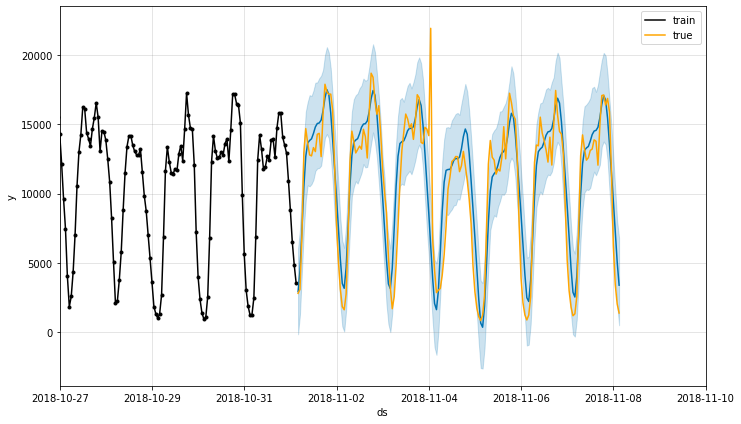

In [218]:
run_model_for_borough_cv(manhattan_demand, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Manhattan holiday model - R2_train = 0.77, R2_test = 0.67, RMSE = 2688


0.4255517171842843 0.17145429590254735 68.42200629951917


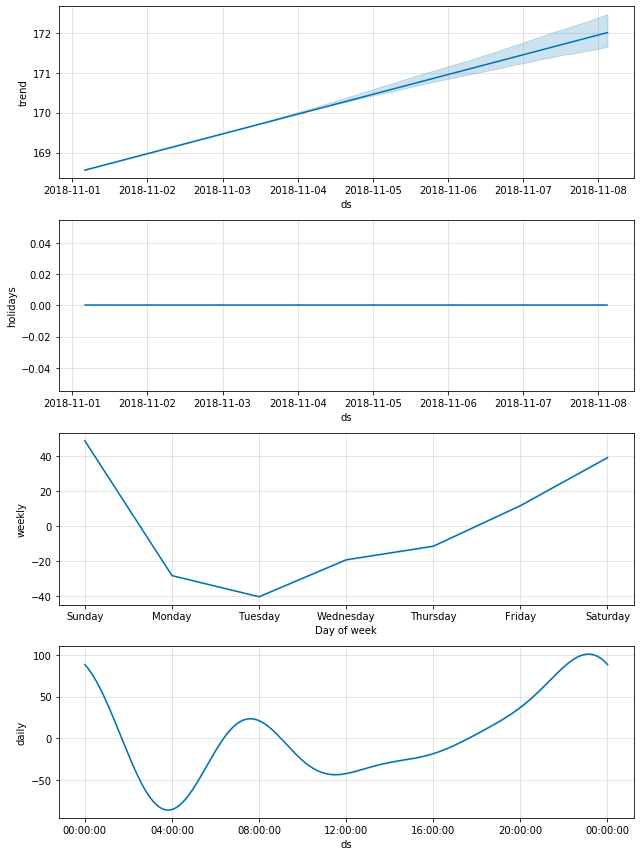

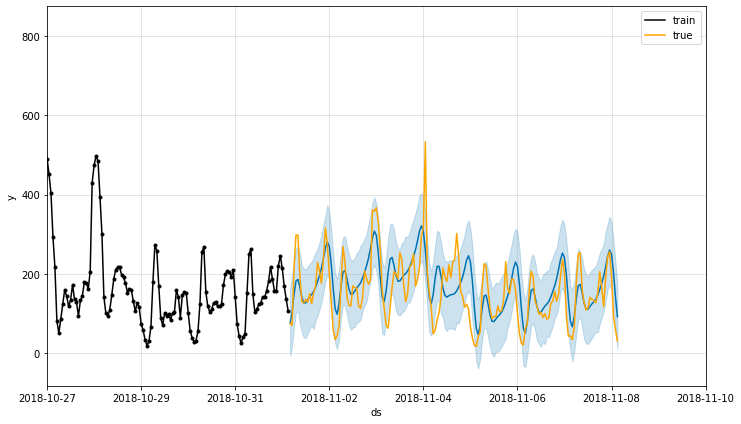

In [219]:
run_model_for_borough_cv(brooklyn_demand, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Brooklyn holiday model - R2_train = 0.43, R2_test = 0.17, RMSE = 68


0.2706757157474665 0.24046557287961576 6.501846825855975


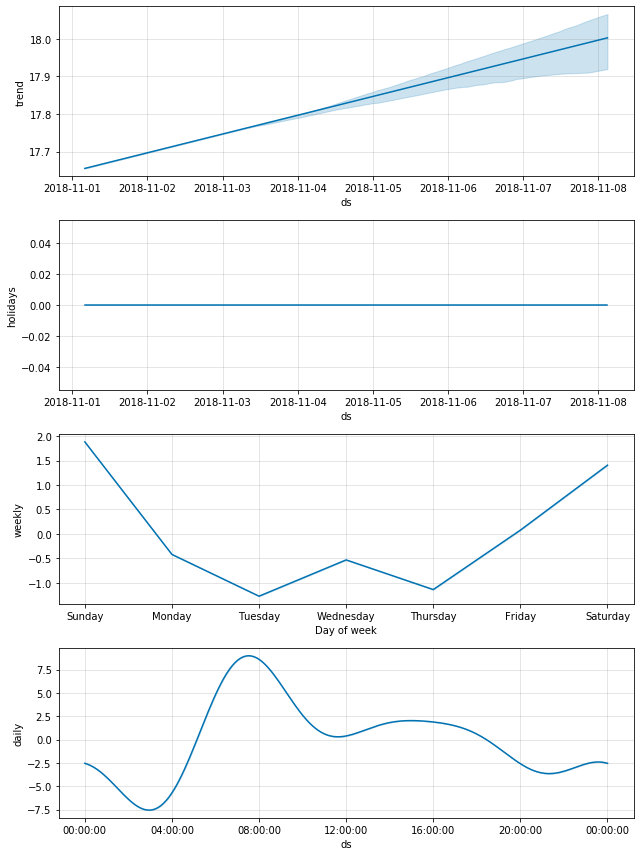

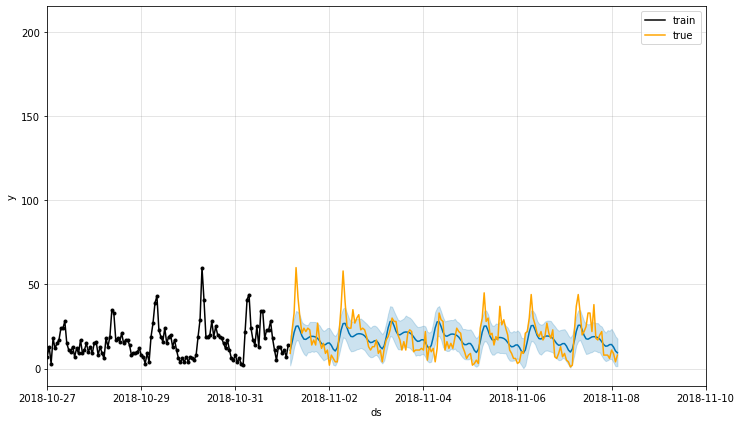

In [220]:
run_model_for_borough_cv(bronx_demand, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Bronx holiday model - R2_train = 0.27, R2_test = 0.24, RMSE = 7


0.8301300499977629 0.7340983592114579 184.02816970862835


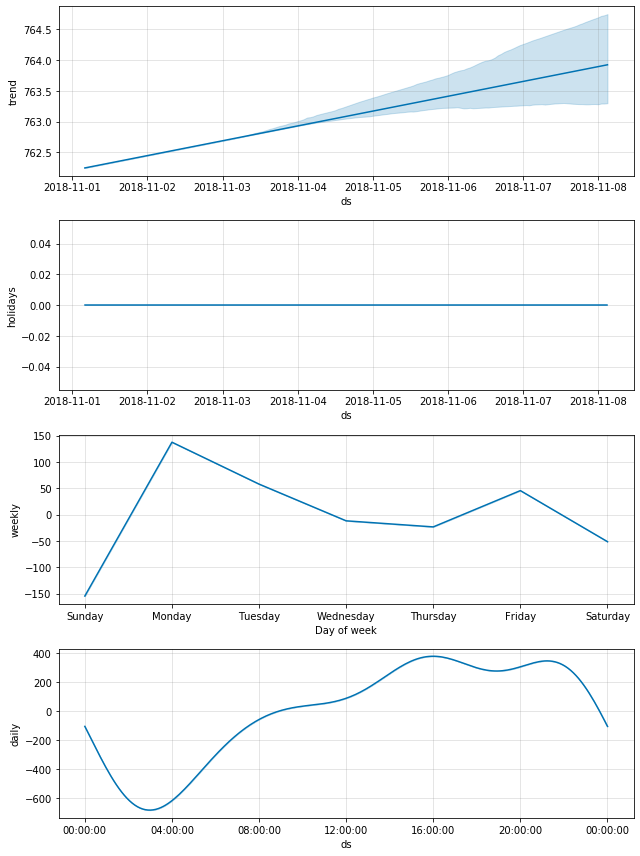

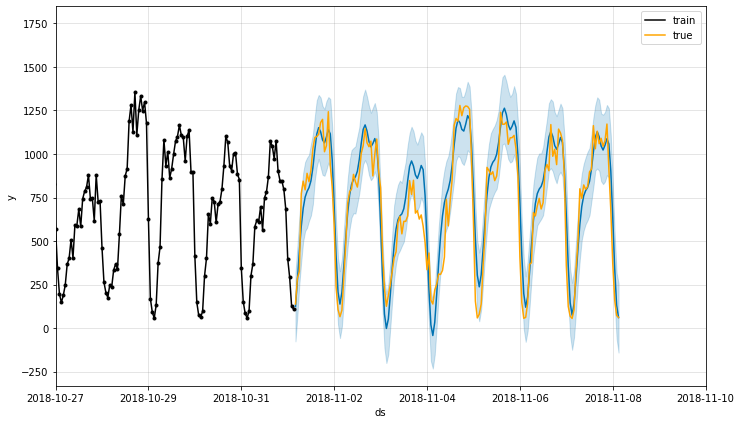

In [221]:
run_model_for_borough_cv(queens_demand, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Queens holiday model - R2_train = 0.83, R2_test = 0.73, RMSE = 184

### Demand forecast - adding exogenous variables

In [223]:
exog = pd.read_csv('date_weather_bike_hr_features_2018.csv')

In [227]:
exog = pd.get_dummies(exog.drop(['DATE'], axis=1))

#### Manhattan

In [234]:
manhattan_demand_exog = pd.DataFrame(manhattan_demand.copy()).reset_index()
manhattan_demand_exog.columns = ['ds', 'y']
manhattan_demand_exog = manhattan_demand_exog.join(exog)

Correlation for Manhattan demand

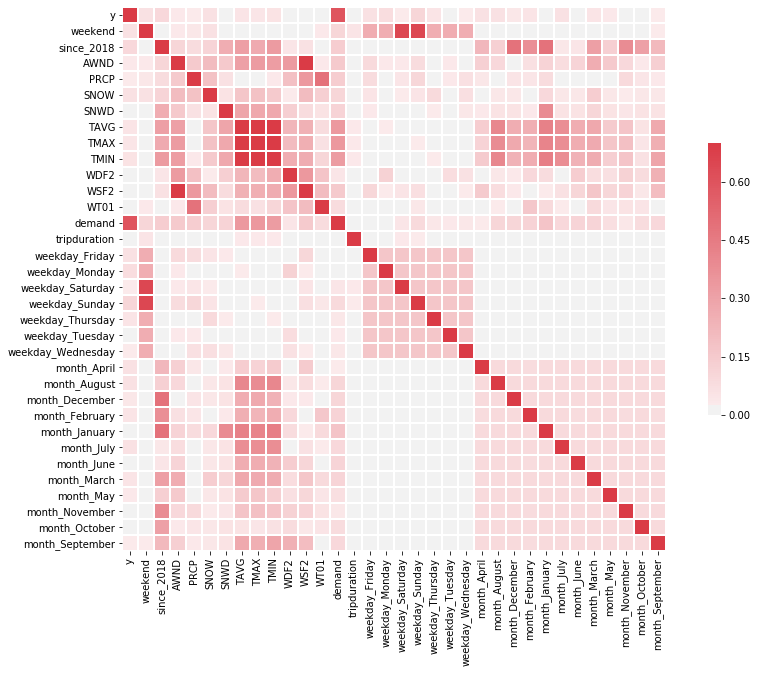

In [250]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(manhattan_demand_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [237]:
manhattan_demand_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,15308.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,17111.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,14744.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,11160.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,7425.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


#### Bronx

In [346]:
bronx_demand_exog = pd.DataFrame(bronx_demand.copy()).reset_index()
bronx_demand_exog.columns = ['ds', 'y']
bronx_demand_exog = bronx_demand_exog.join(exog)

Correlation for Bronx demand

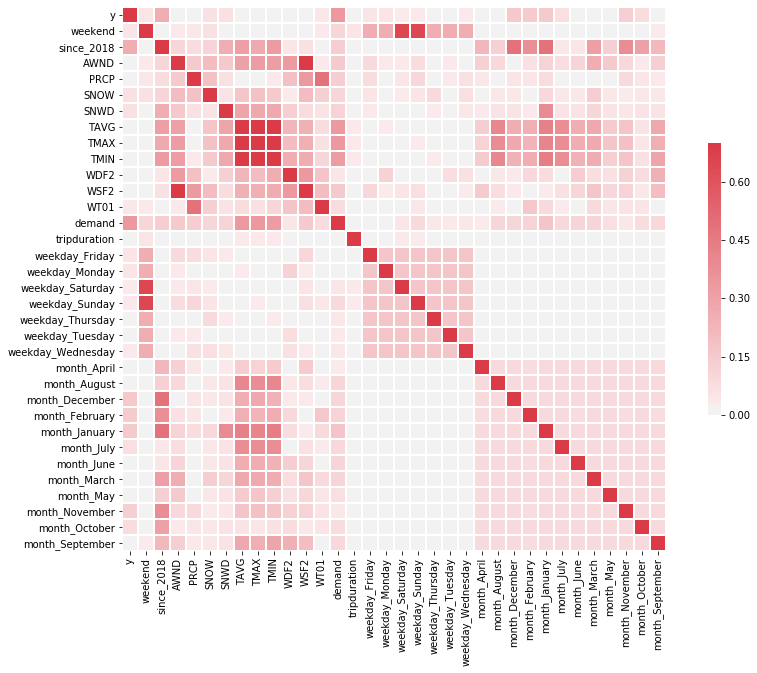

In [347]:
Correlation for Manhattan demandplt.figure(figsize = (15,10))
sns.heatmap(abs(bronx_demand_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [348]:
bronx_demand_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,39.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,58.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,58.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,71.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,52.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


#### Brooklyn

In [349]:
brooklyn_demand_exog = pd.DataFrame(brooklyn_demand.copy()).reset_index()
brooklyn_demand_exog.columns = ['ds', 'y']
brooklyn_demand_exog = brooklyn_demand_exog.join(exog)

Correlation for Brooklyn demand

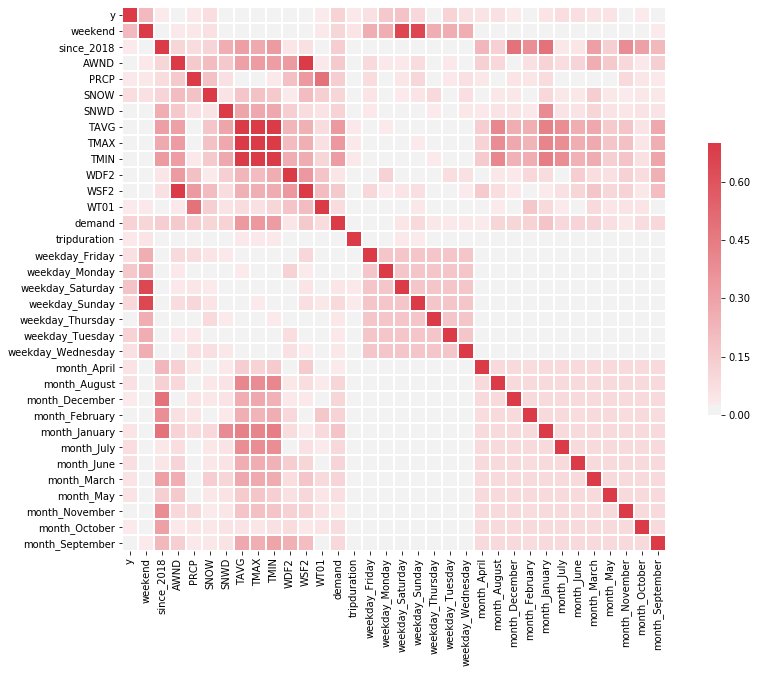

In [350]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(brooklyn_demand_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [351]:
brooklyn_demand_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,285.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,791.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,831.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,635.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,488.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


#### Queens

In [352]:
queens_demand_exog = pd.DataFrame(queens_demand.copy()).reset_index()
queens_demand_exog.columns = ['ds', 'y']
queens_demand_exog = queens_demand_exog.join(exog)

Correlation for Queens demand

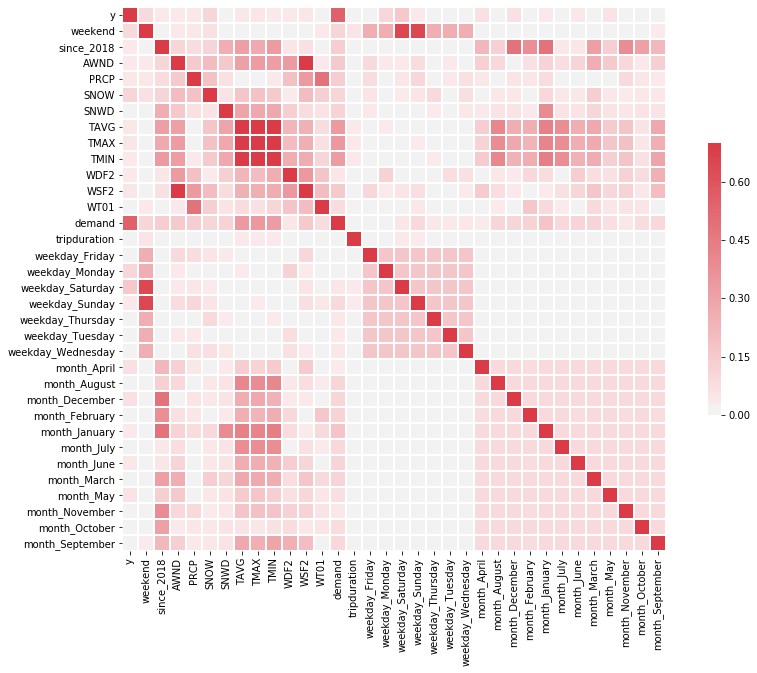

In [353]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(queens_demand_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [355]:
queens_demand_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,418.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,539.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,545.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,444.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,515.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


### Using same regressors which performed best for whole NYC: weekend, since_2018, CityBike demand, weather

0.8146357388036829 0.7148173626049878 2448.820465056537


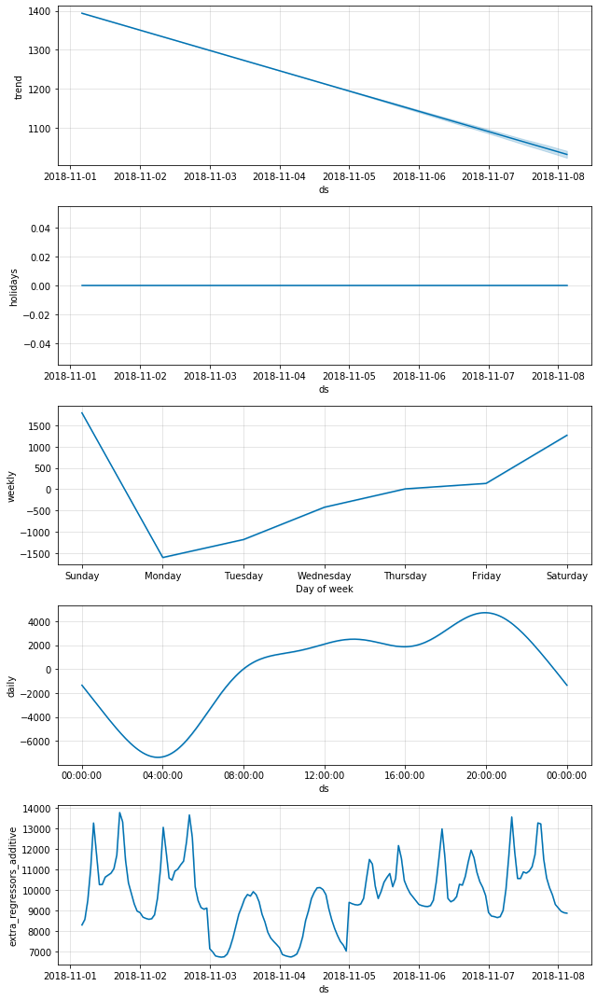

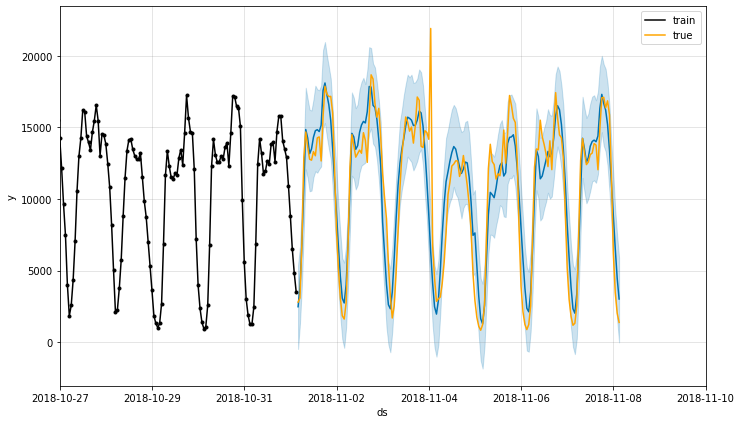

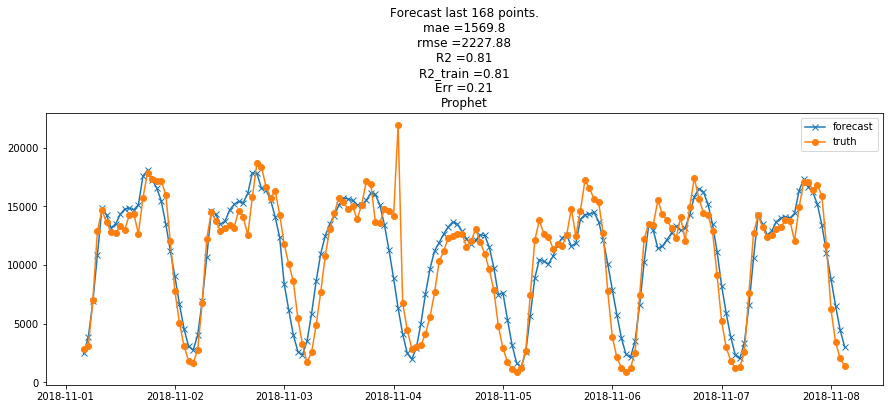

In [251]:
manhattan_demand_forecast = run_model_for_borough_cv(manhattan_demand, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = ['weekend', 'since_2018', 'demand','SNOW', 'WT01', 'TAVG'])

#### Manhattan model - R2_train = 0.81, R2_test = 0.71, RMSE = 2448

0.29662528561473367 0.3036247880001417 6.2632519315324755


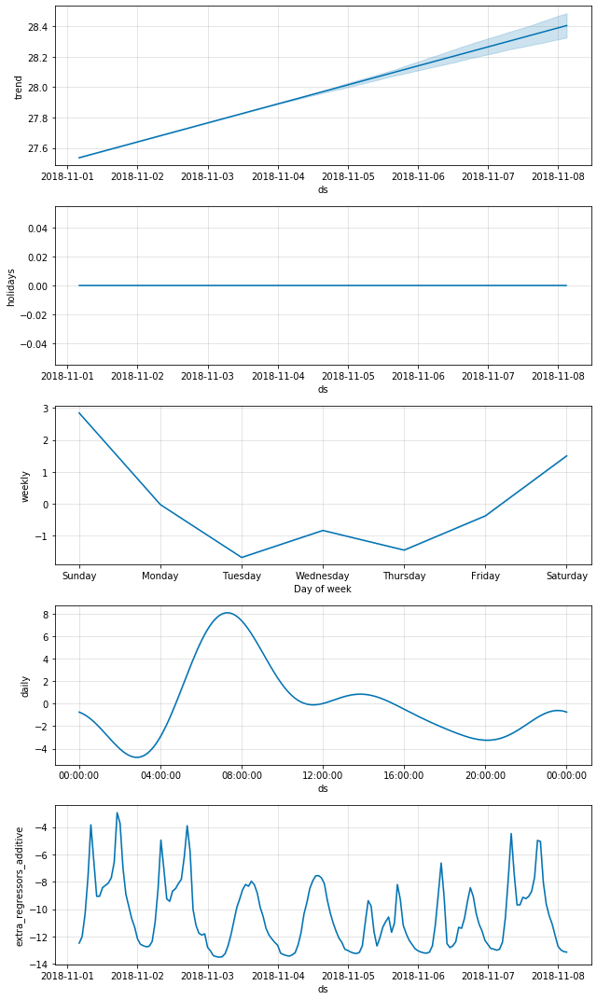

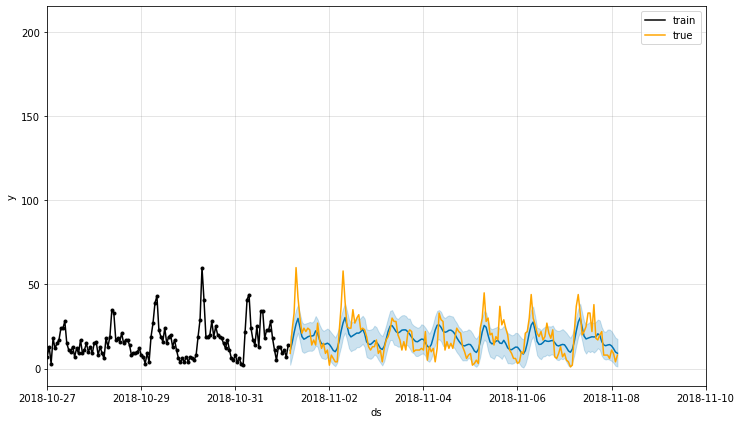

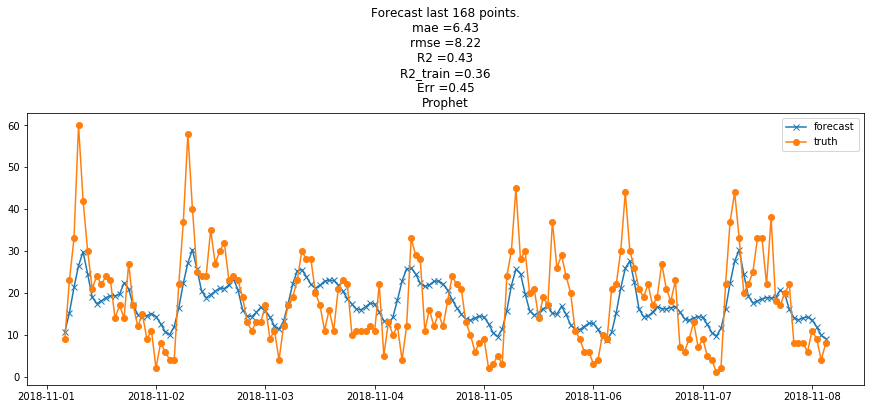

In [252]:
bronx_demand_forecast = run_model_for_borough_cv(bronx_demand, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = ['weekend', 'since_2018', 'demand','SNOW', 'WT01', 'TAVG'])

#### Bronx model - R2_train = 0.297, R2_test = 0.303, RMSE = 6

0.4759352303958437 0.2886767349103643 63.60942495365371


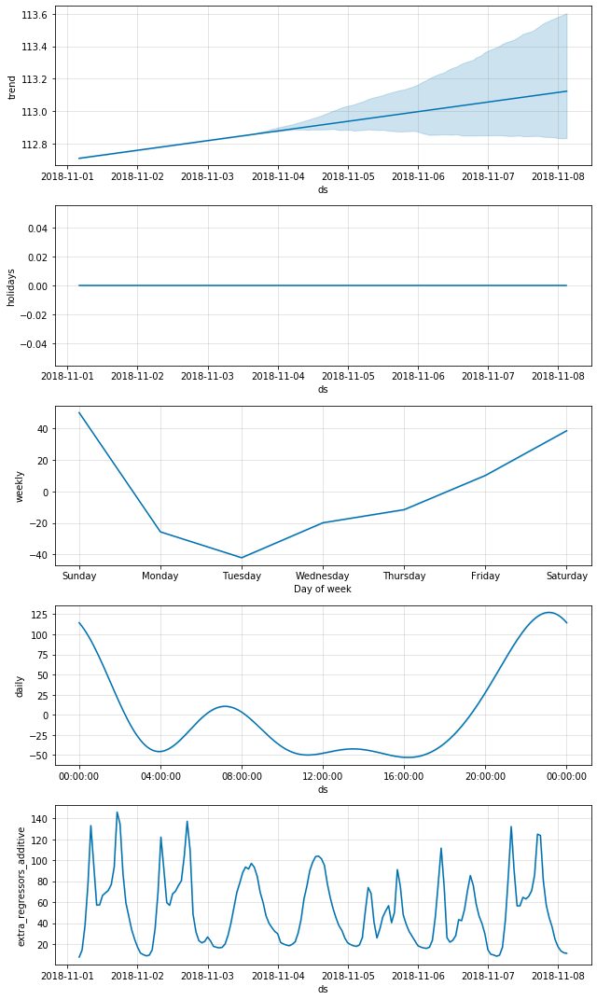

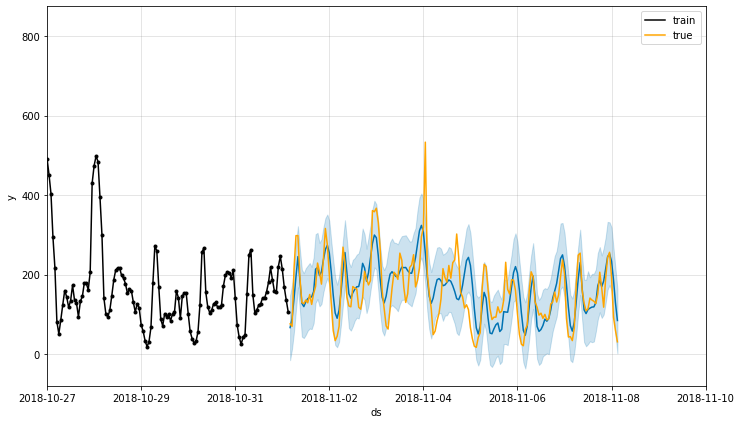

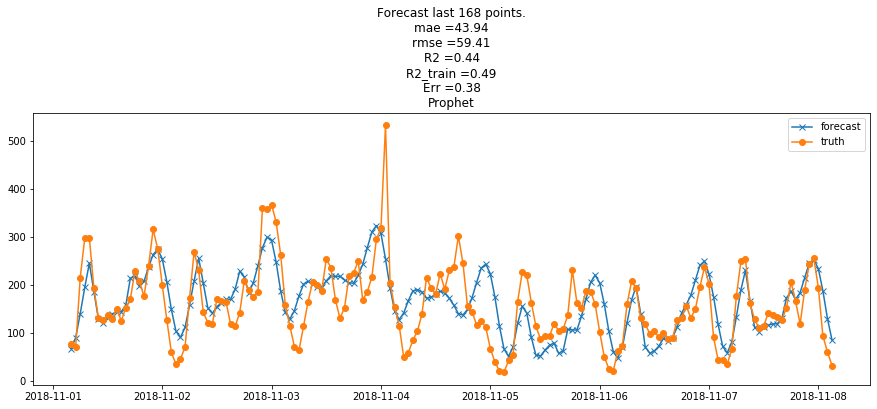

In [253]:
brooklyn_demand_forecast = run_model_for_borough_cv(brooklyn_demand, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = ['weekend', 'since_2018', 'demand','SNOW', 'WT01', 'TAVG']);

#### Brooklyn demand - R2_train = 0.476, R2_test = 0.289, RMSE = 64

0.8665378190062831 0.786038092867893 165.12914459864538


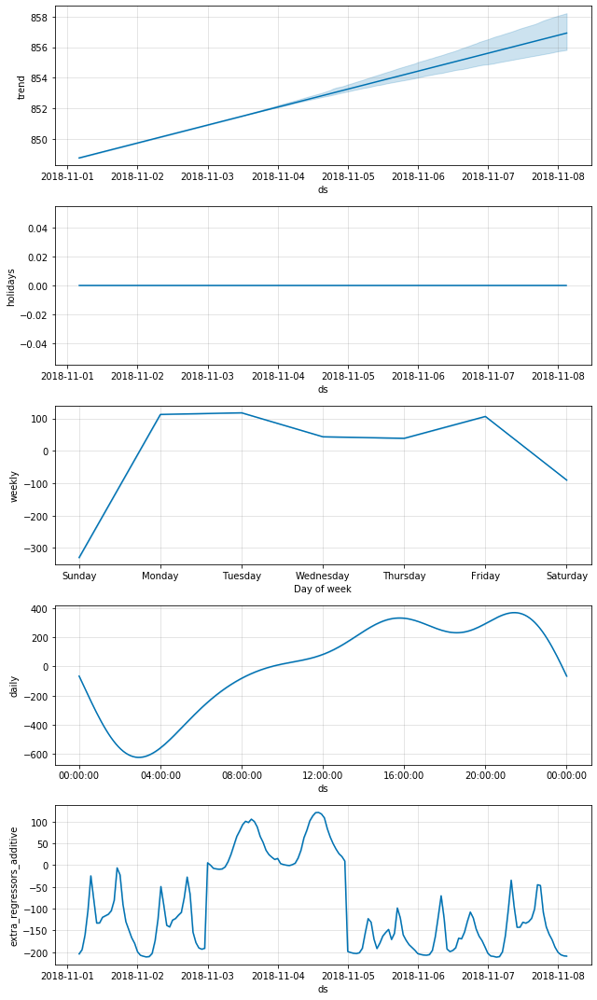

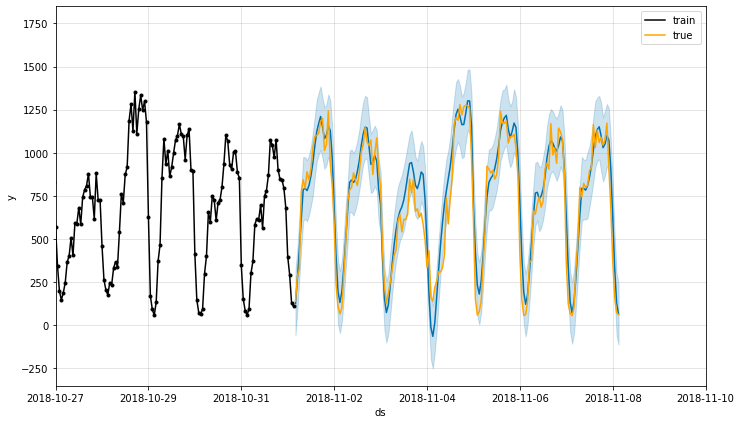

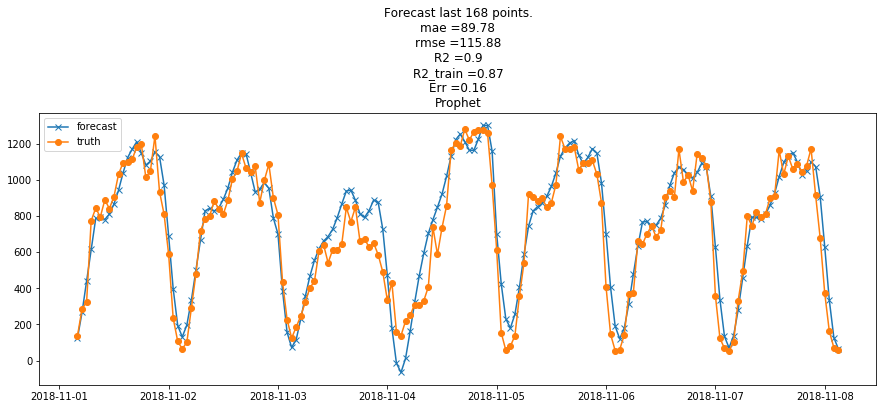

In [254]:
queens_demand_forecast = run_model_for_borough_cv(queens_demand, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = ['weekend', 'since_2018', 'demand','SNOW', 'WT01', 'TAVG']);

#### Queens model - R2_train = 0.867, R2_test = 0.786, RMSE = 165

### Create helper function to run prediction using pre-trained model

In [640]:
def make_prediction_for_borough(boro, model,date1='2018-12-01', date2 = '2018-12-08',  show_components = False):
    num_pounts_to_pred = int((pd.to_datetime(date2)-pd.to_datetime(date1))/np.timedelta64(1, 'h'))
        
    sub_df = boro[(boro.ds < date2) & (boro.ds > date1)]
    
    forecast = model.predict(sub_df)
    forecast = forecast[-num_pounts_to_pred:]
    
    if show_components:
        model.plot_components(forecast)
    
    model.plot(forecast)
    plt.plot(forecast.ds, forecast.yhat, 'x-', label = 'forecast')
    plt.plot(sub_df.ds, sub_df.y, '-', label = 'truth')
    
    plt.xlim(date1,date2)
    plt.ylim(bottom=0, top = max(sub_df.y)*1.1)
    plt.title('Forecast ')
    plt.xlabel('Time range')
    plt.ylabel('Taxi pickup demand')
    plt.legend()
    return plt.show()

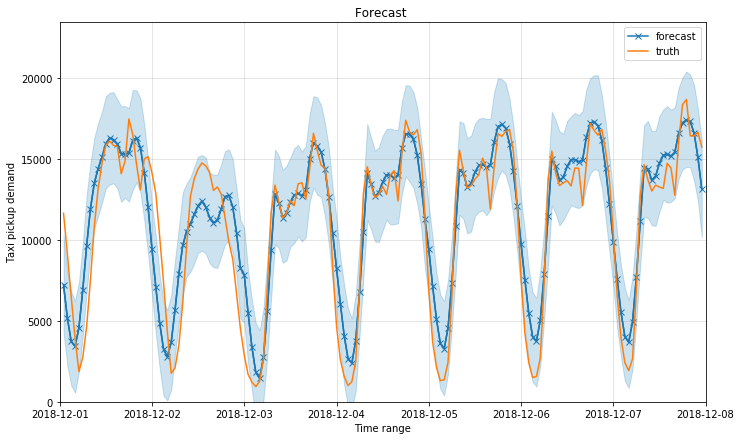

In [412]:
make_prediction_for_borough(manhattan_demand_exog, manhattan_demand_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

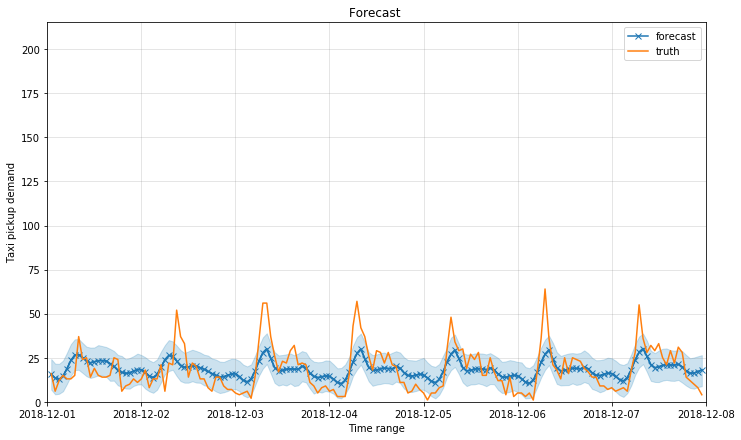

In [411]:
make_prediction_for_borough(bronx_demand_exog, bronx_demand_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

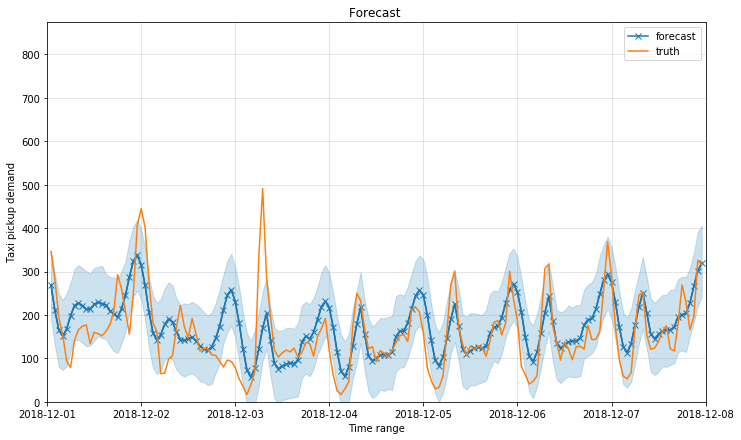

In [410]:
make_prediction_for_borough(brooklyn_demand_exog, brooklyn_demand_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

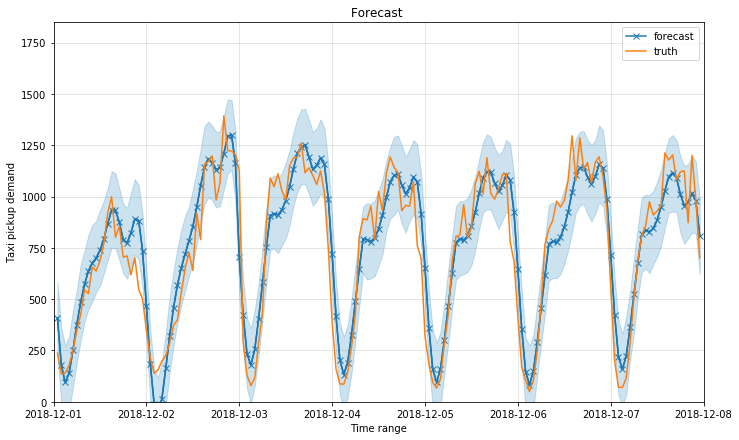

In [409]:
make_prediction_for_borough(queens_demand_exog, queens_demand_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

Save models to pickle file

In [418]:
pkl_path = "./models/manhattan.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the manhattan 'Prophet' model
    pickle.dump(manhattan_demand_forecast[-1][4], f)

In [423]:
pkl_path = "./models/bronx.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the bronx 'Prophet' model
    pickle.dump(bronx_demand_forecast[-1][4], f)

In [424]:
pkl_path = "./models/brooklyn.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the brooklyn 'Prophet' model
    pickle.dump(brooklyn_demand_forecast[-1][4], f)

In [994]:
pkl_path = "./models/queens.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the queens 'Prophet' model
    pickle.dump(queens_demand_forecast[-1][4], f)

Save dataframes to files

In [430]:
manhattan_demand_exog.to_csv("./models/manhattan_demand_exog.csv", index = False)
bronx_demand_exog.to_csv("./models/bronx_demand_exog.csv", index = False)
brooklyn_demand_exog.to_csv("./models/brooklyn_demand_exog.csv", index = False)
queens_demand_exog.to_csv("./models/queens_demand_exog.csv", index = False)

## Tips ratio forecasting for boroughs

In [531]:
tips = pd.read_csv("nyc_neighborhoods_yellow_neigh_tips_hourly.csv", parse_dates = ['ds'])

In [533]:
tips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8187 entries, 0 to 8186
Columns: 265 entries, ds to 99
dtypes: datetime64[ns](1), float64(264)
memory usage: 16.6 MB


In [534]:
tips = tips.set_index('ds')

In [556]:
manhattan_tips = tips[lst_manhattan].mean(axis = 1).fillna(0)
brooklyn_tips = tips[lst_brooklyn].mean(axis = 1).fillna(0)
bronx_tips = tips[lst_bronx].mean(axis = 1).fillna(0)
queens_tips = tips[lst_queens].mean(axis = 1).fillna(0)
staten_tips = tips[lst_staten].mean(axis = 1).fillna(0)

In [562]:
(manhattan_tips>0).sum(), (brooklyn_tips>0).sum(), (bronx_tips>0).sum(), (queens_tips>0).sum()

(8146, 8018, 6840, 8027)

In [561]:
(staten_tips>0).sum()

473

Go on without staten island

### Tip ratio baseline models for boroughs

Running time series cross validation for baseline model

0.16499972209200442 0.4732326837251649 0.00620621460131898


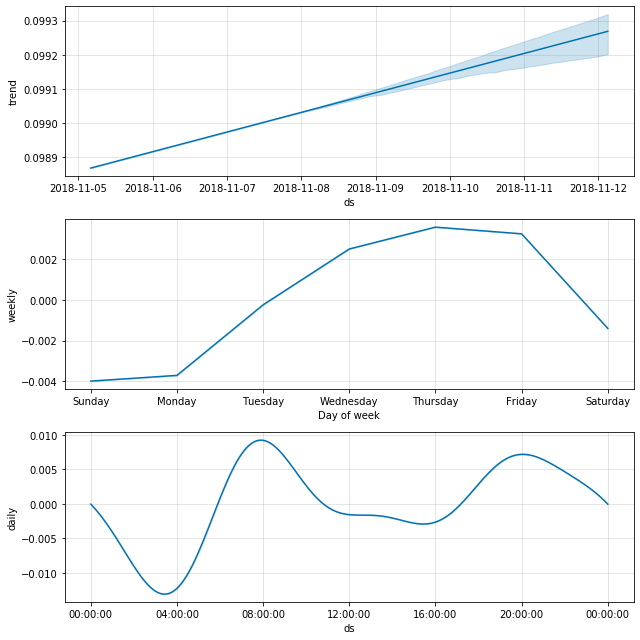

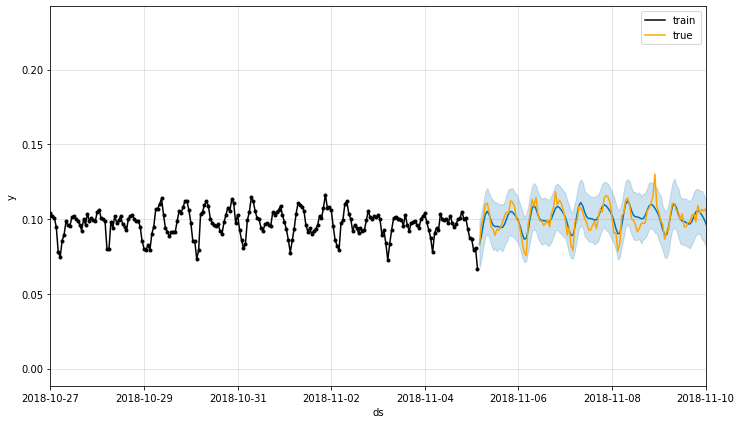

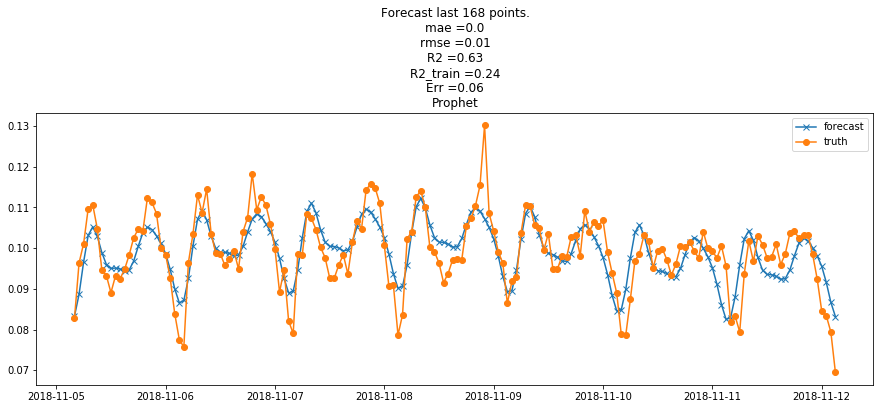

In [568]:
run_model_for_borough_cv(manhattan_tips, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Baseline model for Manhattan tips - R2_train = 0.165, R2_test = 0.473, RMSE = 0.006

0.07488083801450825 -0.004965684105447199 0.025770908348379605


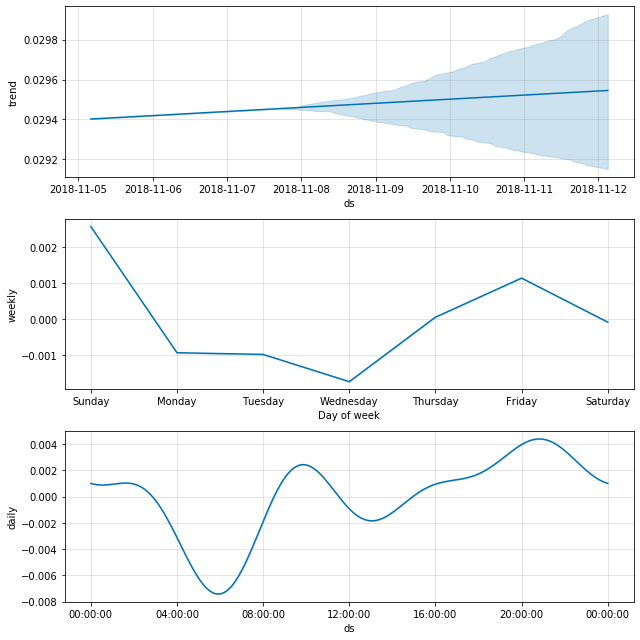

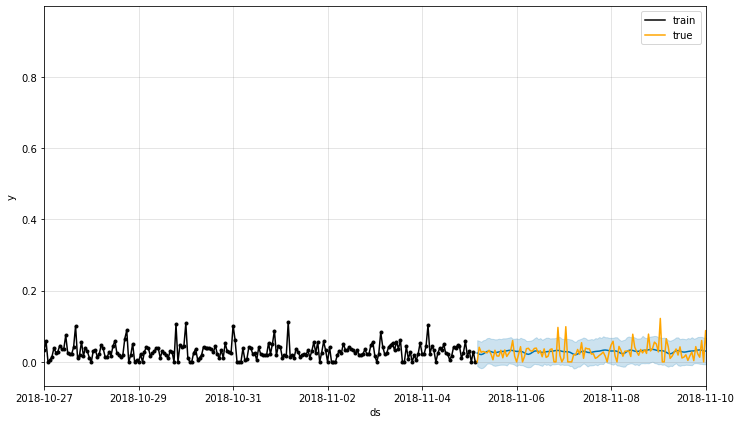

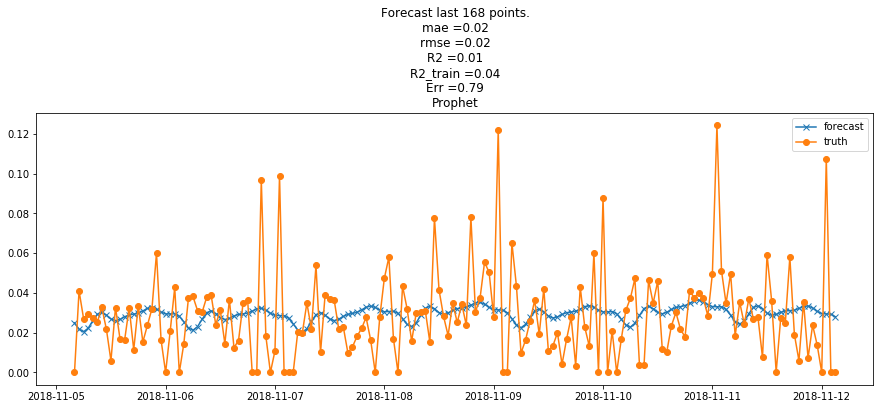

In [569]:
run_model_for_borough_cv(bronx_tips, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Baseline model for Bronx tips - R2_train = 0.075, R2_test = -.005, RMSE = 0.026

0.5422145055774904 0.35854648417911894 0.013177355142411981


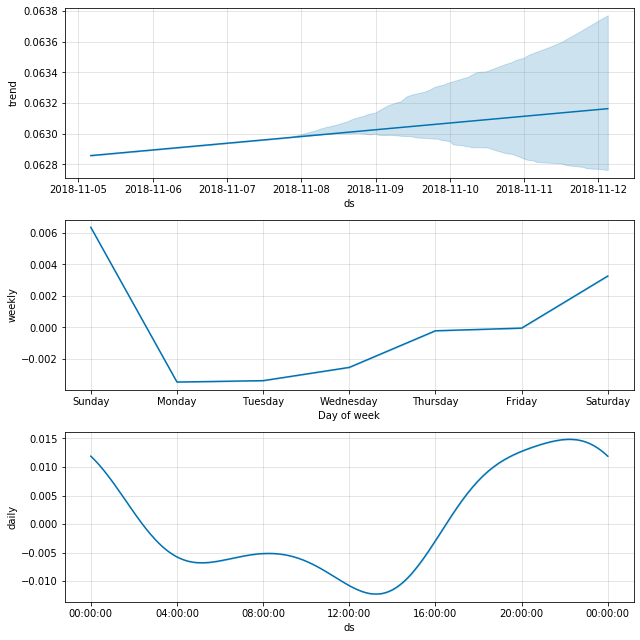

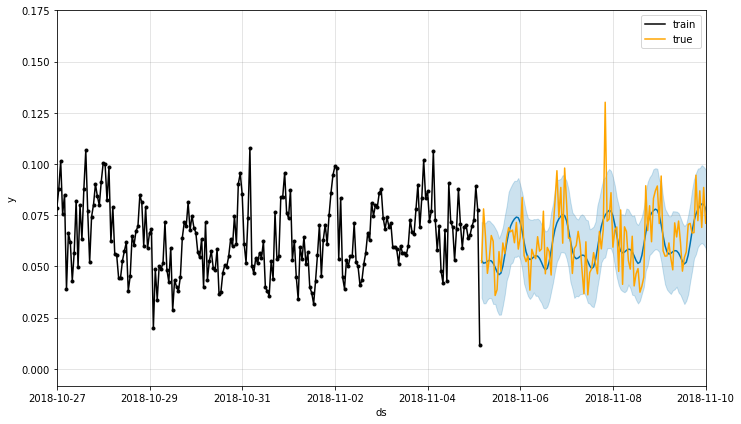

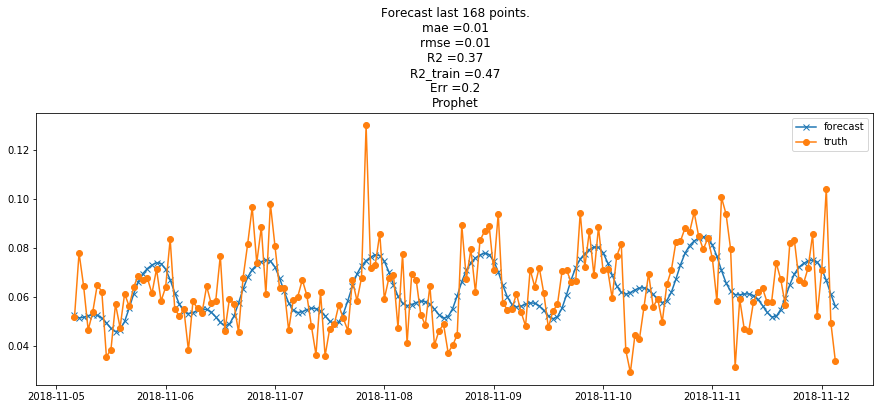

In [570]:
run_model_for_borough_cv(brooklyn_tips, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Baseline model for Brooklyn tips - R2_train = 0.542, R2_test = 0.359, RMSE = 0.013

0.4077298085562604 0.3166374437206044 0.013160032805304329


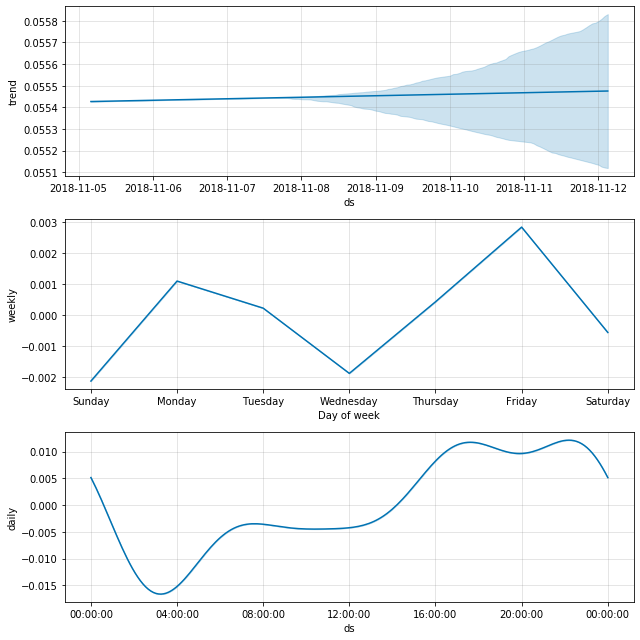

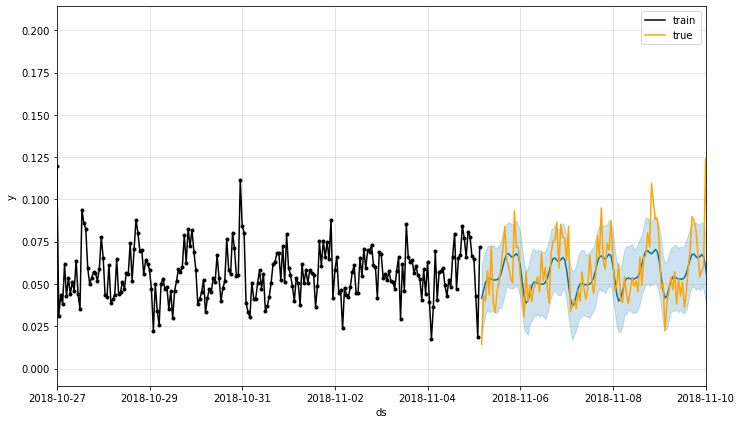

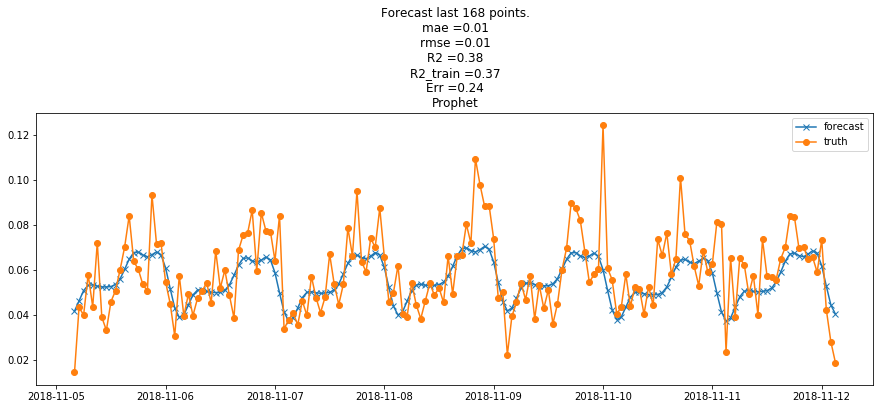

In [571]:
run_model_for_borough_cv(queens_tips, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Baseline model for Queens tips - R2_train = 0.408, R2_test = 0.317, RMSE = 0.013

### Tip ratio forecast per borough - adding holidays

0.16488274988754664 0.48461990673899785 0.006137081196662122


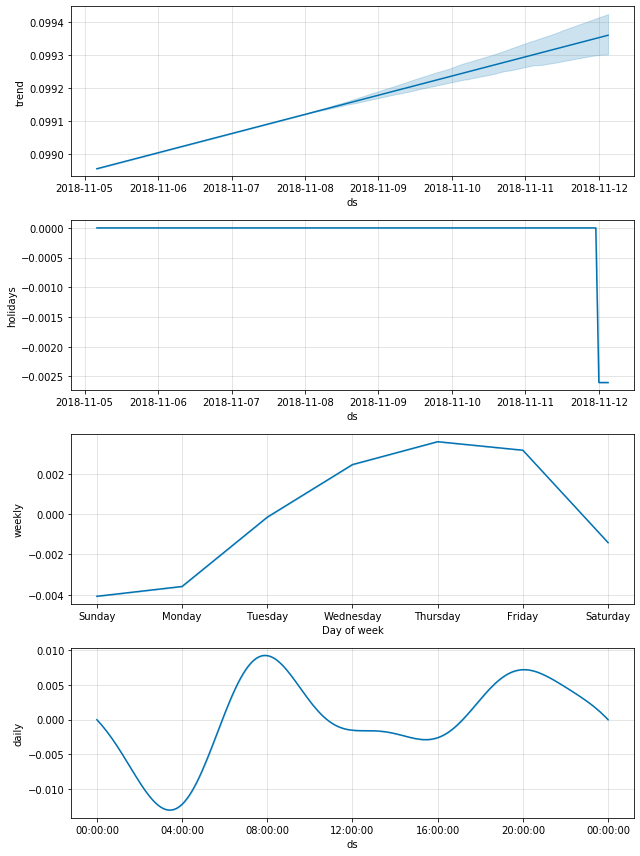

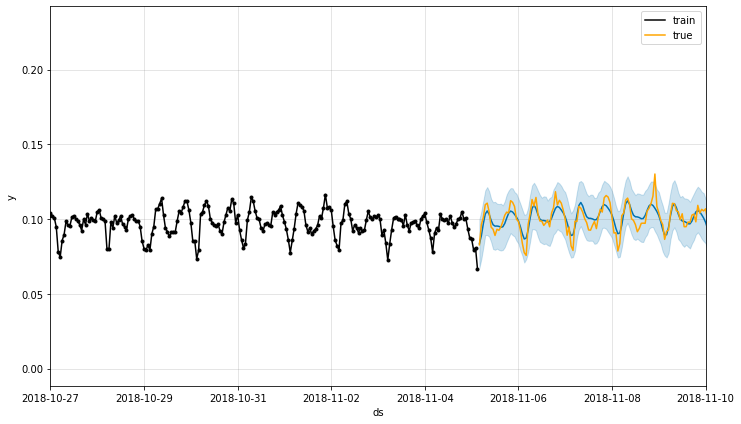

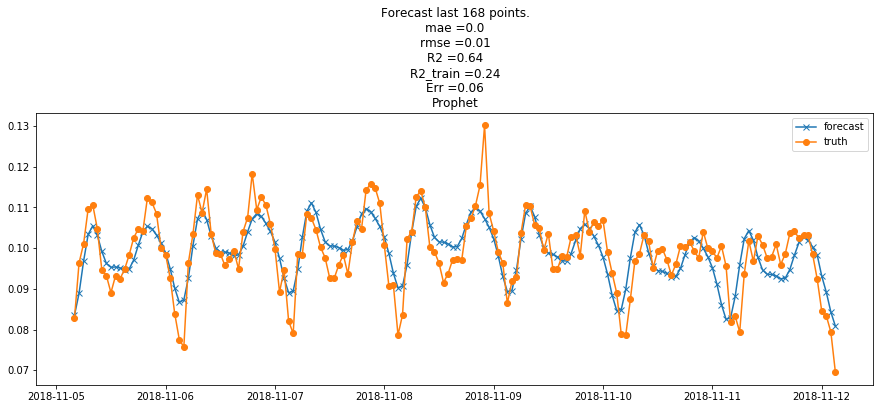

In [572]:
run_model_for_borough_cv(manhattan_tips, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Holiday model for Manhattan tips - R2_train = 0.165, R2_test = 0.485, RMSE = 0.006

0.07573912811584449 -0.005988285734047261 0.025786443019909688


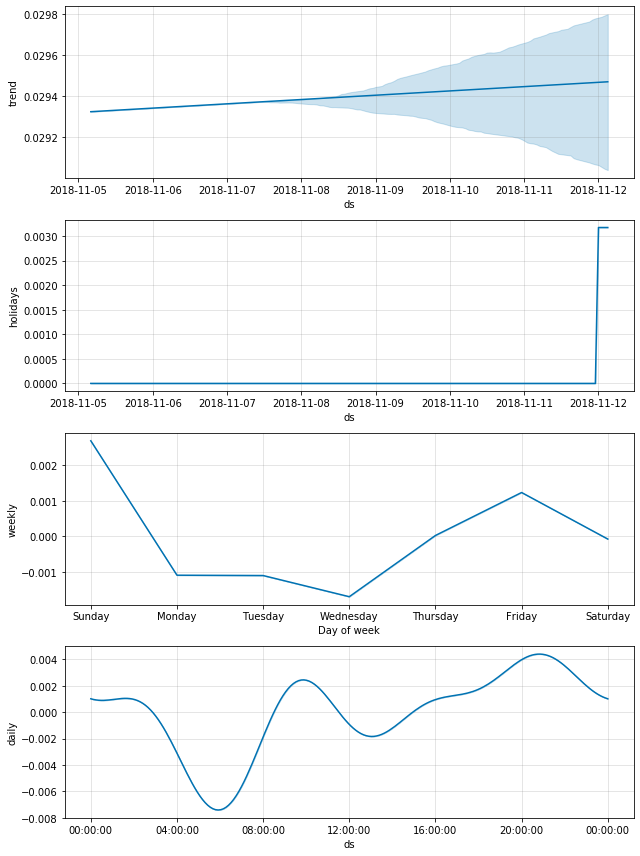

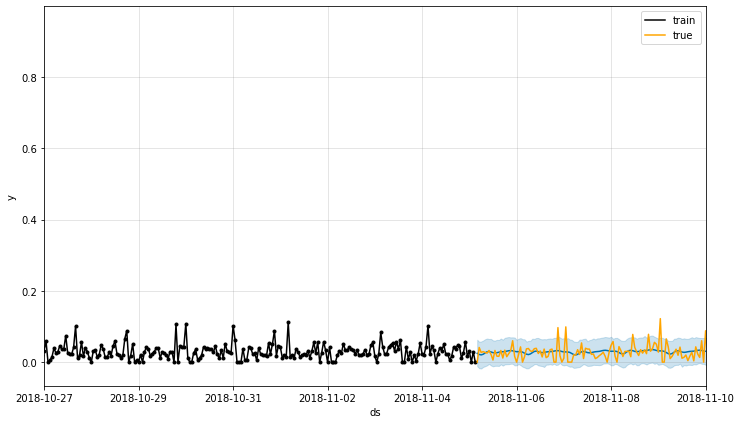

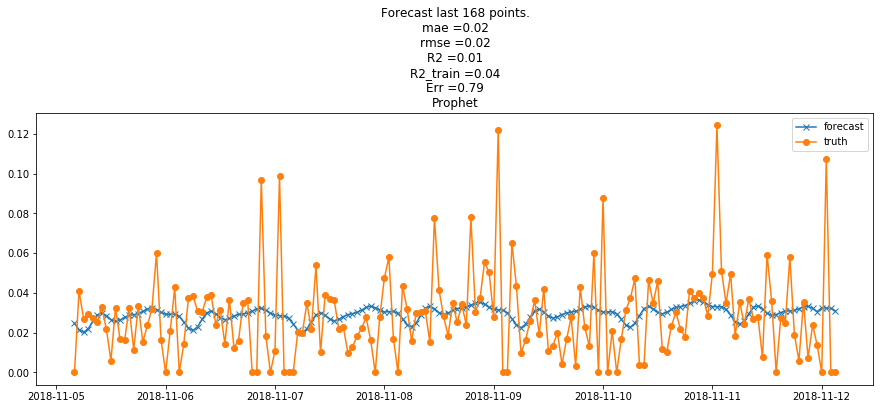

In [573]:
run_model_for_borough_cv(bronx_tips, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Holiday model for Bronx tips - R2_train = 0.076, R2_test = -.006, RMSE = 0.026

0.5459867594047588 0.3544540548081695 0.013217004747529418


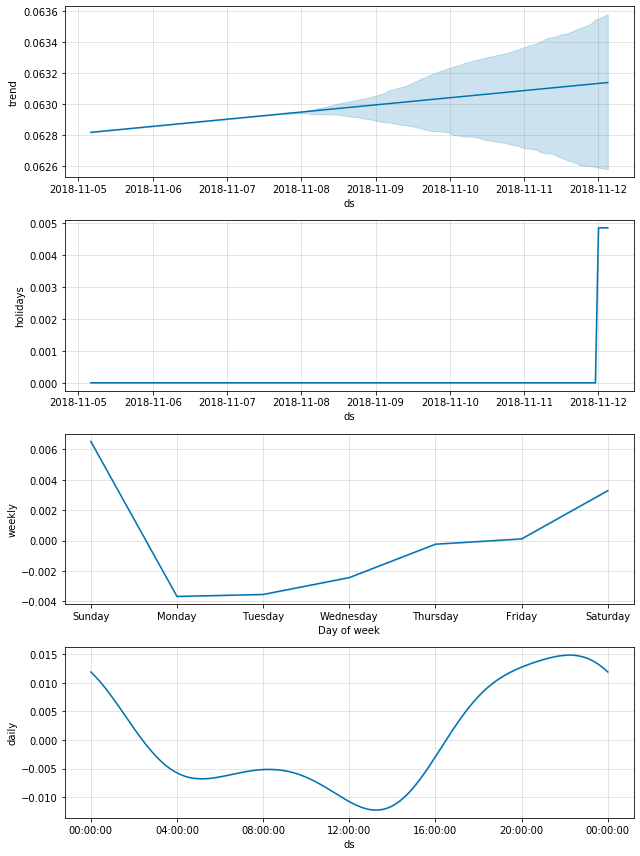

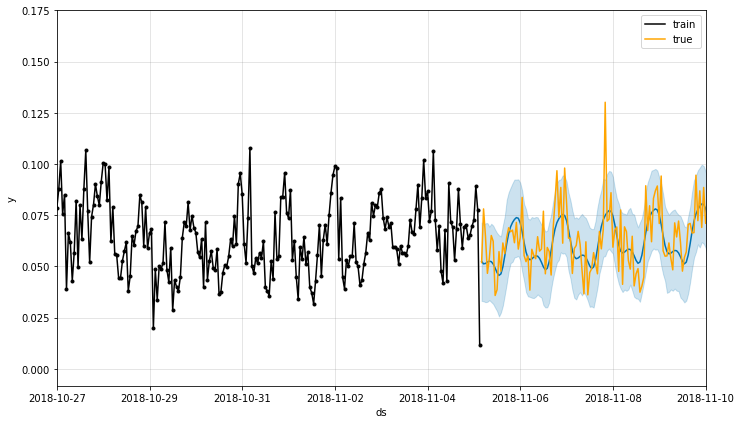

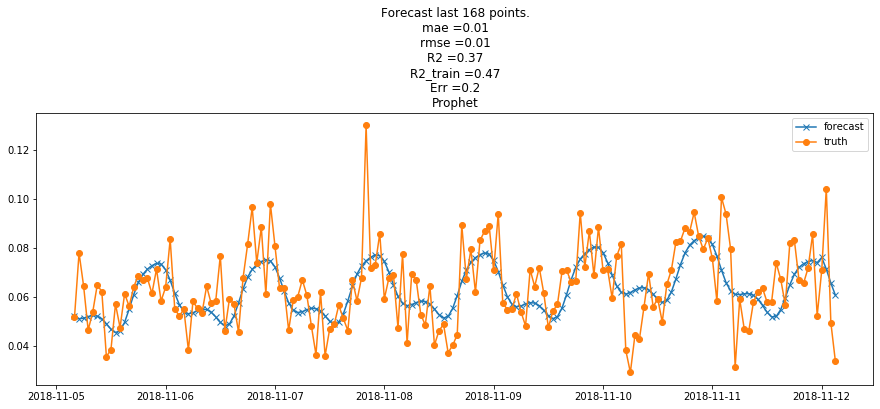

In [646]:
brooklyn_tips_forecast_hol = run_model_for_borough_cv(brooklyn_tips, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1)

#### Holiday model for Brooklyn tips - R2_train = 0.546, R2_test = 0.354, RMSE = 0.013

0.4103225362522826 0.31650976592849356 0.013161658241216807


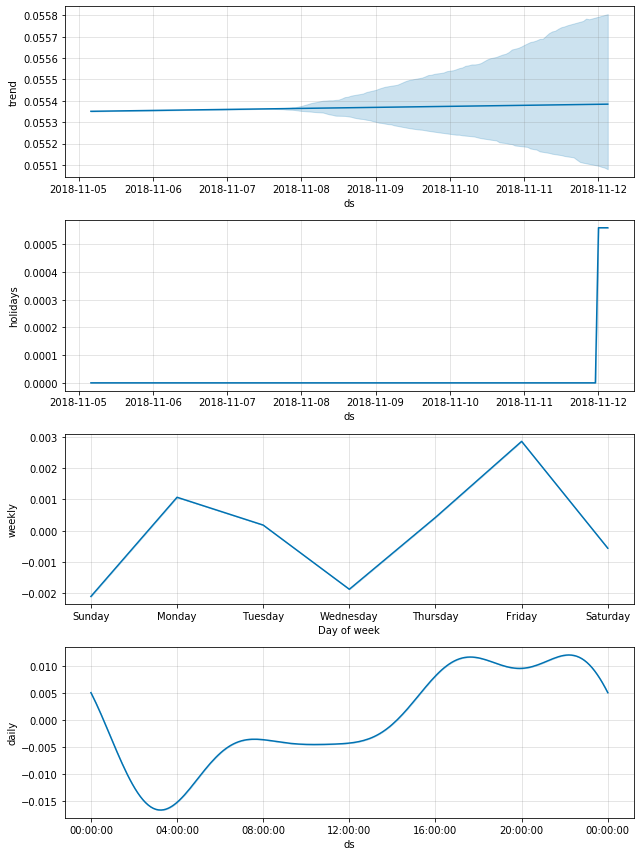

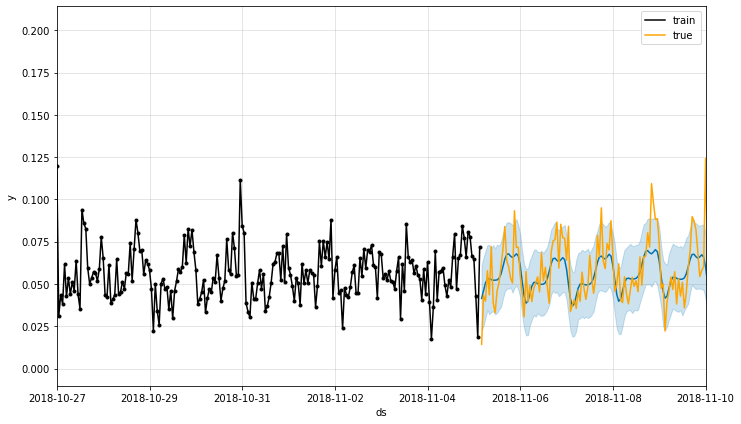

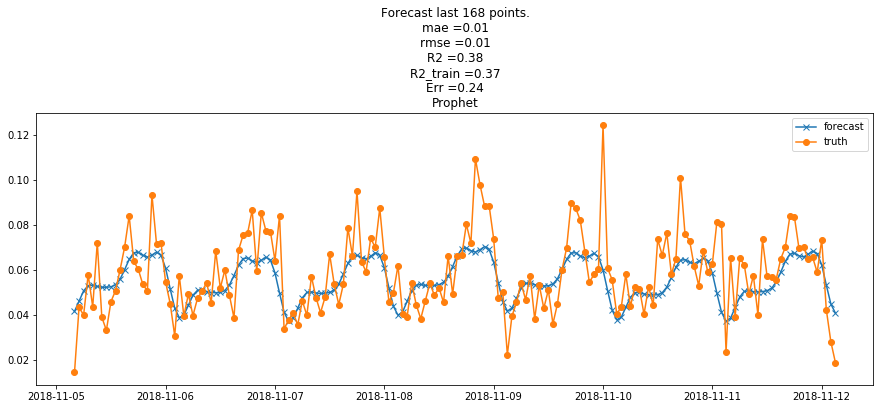

In [647]:
queens_tips_forecast_hol = run_model_for_borough_cv(queens_tips, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Holiday model for Queens tips - R2_train = 0.410, R2_test = 0.317, RMSE = 0.013

### Tip ratio forecast - adding exogenous variables

#### Manhattan

In [576]:
manhattan_tips_exog = pd.DataFrame(manhattan_tips.copy()).reset_index()
manhattan_tips_exog.columns = ['ds', 'y']
manhattan_tips_exog = manhattan_tips_exog.join(exog)

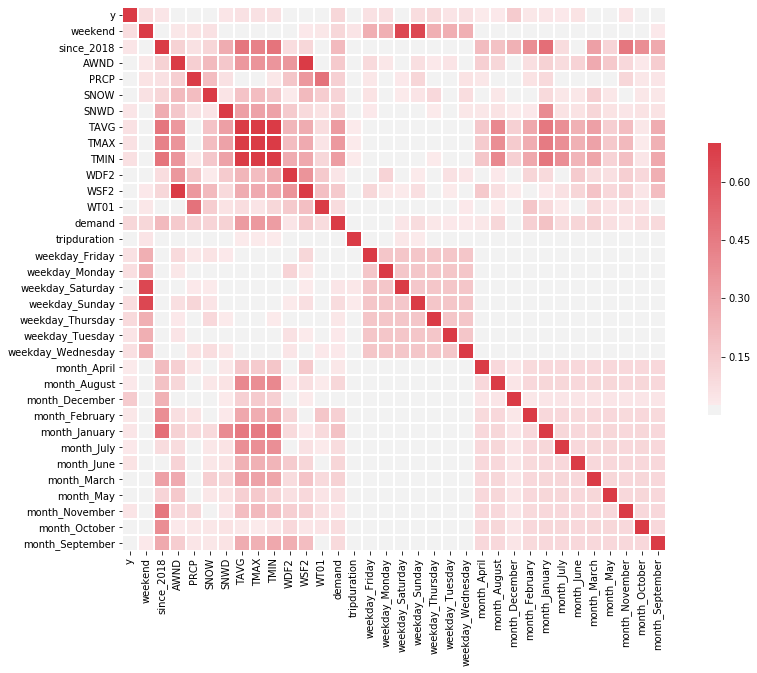

In [577]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(manhattan_tips_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

#### Bronx

In [624]:
bronx_tips_exog = pd.DataFrame(bronx_tips.copy()).reset_index()
bronx_tips_exog.columns = ['ds', 'y']
bronx_tips_exog = bronx_tips_exog.join(exog)

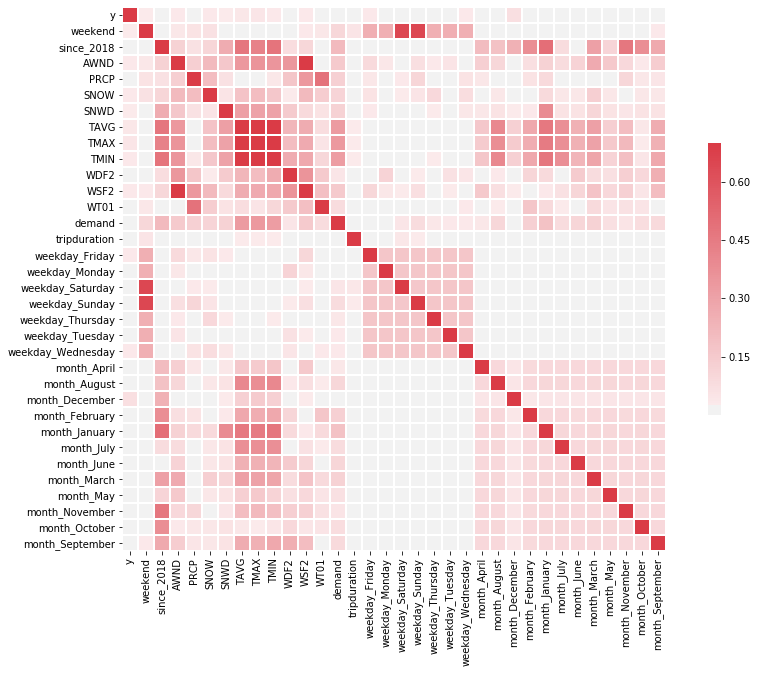

In [625]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(bronx_tips_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [626]:
bronx_tips_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-14 09:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-14 10:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-14 11:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-14 12:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-14 14:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


#### Brooklyn

In [627]:
brooklyn_tips_exog = pd.DataFrame(brooklyn_tips.copy()).reset_index()
brooklyn_tips_exog.columns = ['ds', 'y']
brooklyn_tips_exog = brooklyn_tips_exog.join(exog)

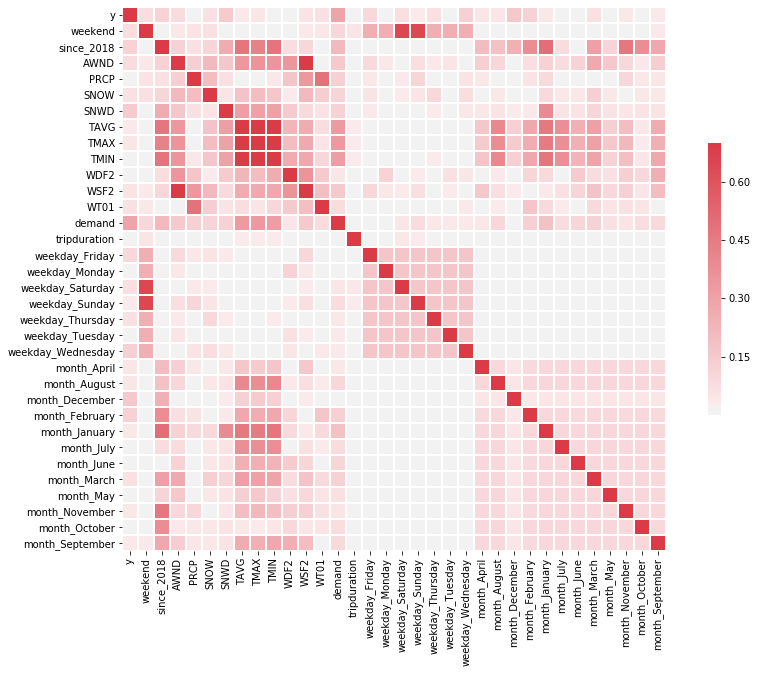

In [628]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(brooklyn_tips_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [629]:
brooklyn_tips_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-14 09:00:00,0.000000,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-14 10:00:00,0.000000,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-14 11:00:00,0.166667,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-14 12:00:00,0.000000,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-14 14:00:00,0.000000,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


#### Queens

In [630]:
queens_tips_exog = pd.DataFrame(queens_tips.copy()).reset_index()
queens_tips_exog.columns = ['ds', 'y']
queens_tips_exog = queens_tips_exog.join(exog)

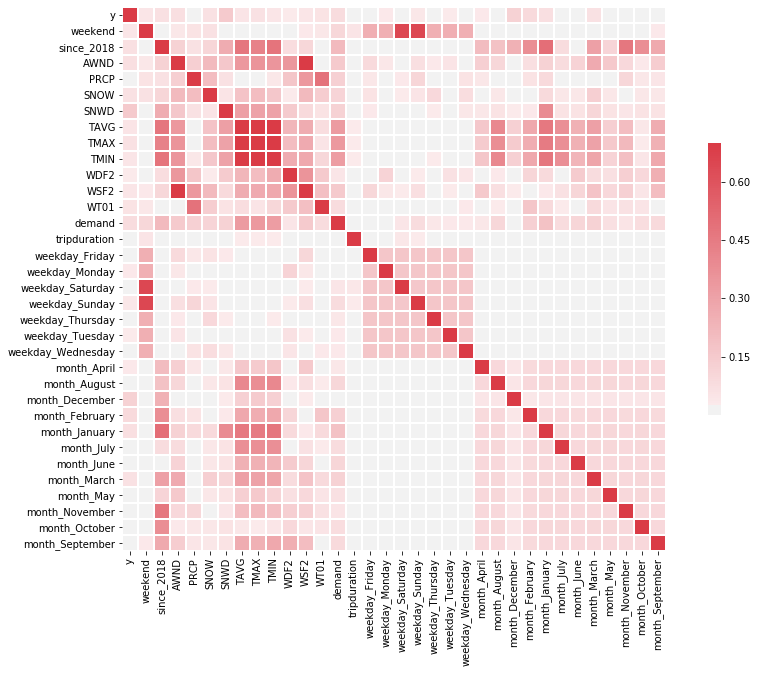

In [631]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(queens_tips_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [632]:
queens_tips_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-14 09:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-14 10:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-14 11:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-14 12:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-14 14:00:00,0.0,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


### Regressors: weekday, month, weekend, since_2018, weather

0.1921059606677556 -0.5098108410059362 0.009248879151032017


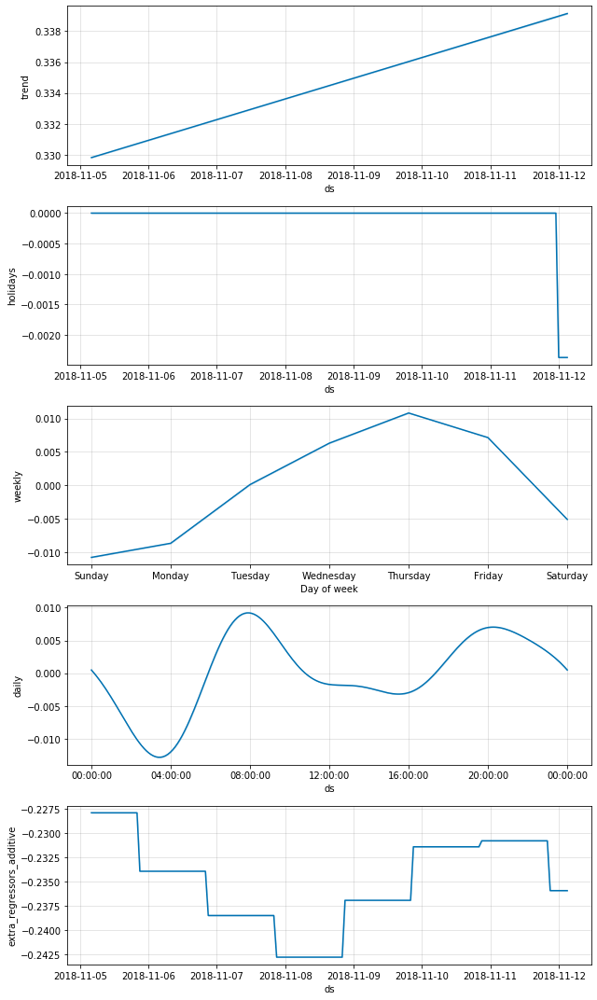

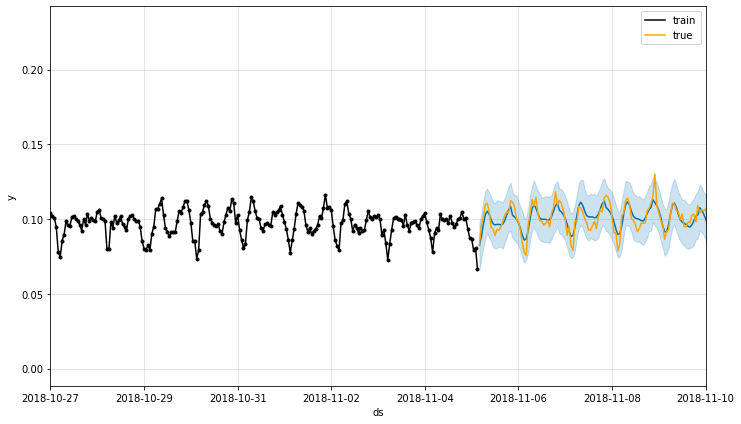

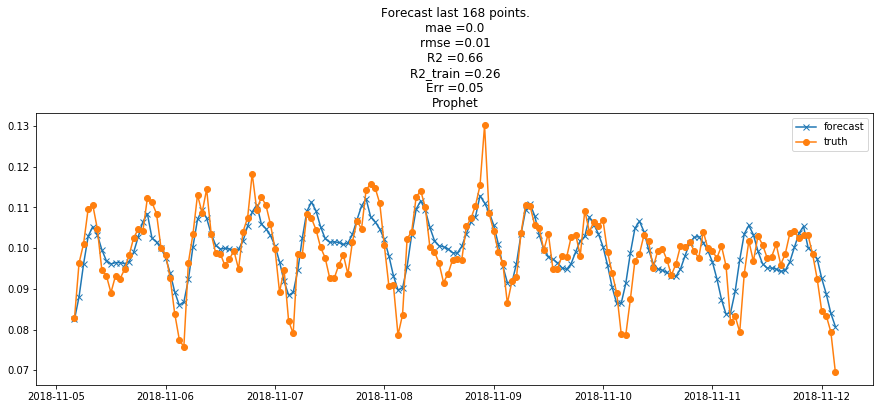

In [579]:
manhattan_tips_forecast = run_model_for_borough_cv(manhattan_tips, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekday_Friday',
                                                                     'weekday_Monday', 'weekday_Saturday',
                                                   'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday',
                                                   'weekday_Wednesday', 'month_April', 'month_August', 'month_December',
                                                   'month_February', 'month_January', 'month_July', 'month_June',
                                                   'month_March', 'month_May', 'month_November', 'month_October',
                                                   'month_September','weekend', 'since_2018', 'SNOW', 'WT01', 'TAVG'])

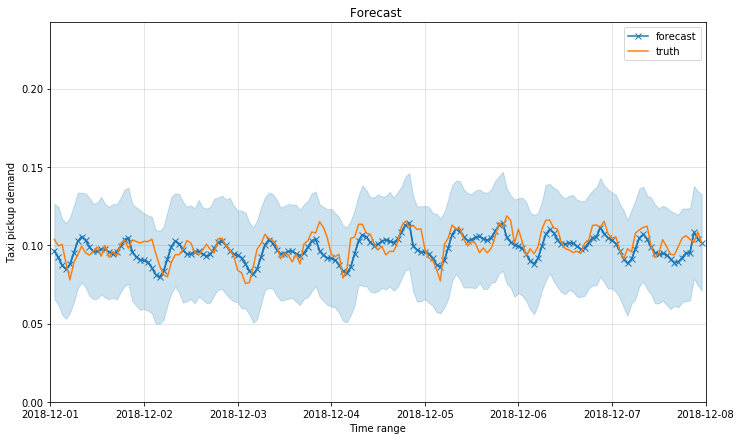

In [588]:
make_prediction_for_borough(manhattan_tips_exog,manhattan_tips_forecast[0][-4])

Verification of the values at the beginning of the year

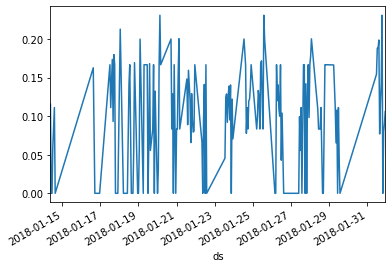

In [605]:
manhattan_tips['2018-01'].plot()

I will run the models since February as January seems to have lots of missing values

0.6256482814962879 0.3973661160508023 0.006921516239668307


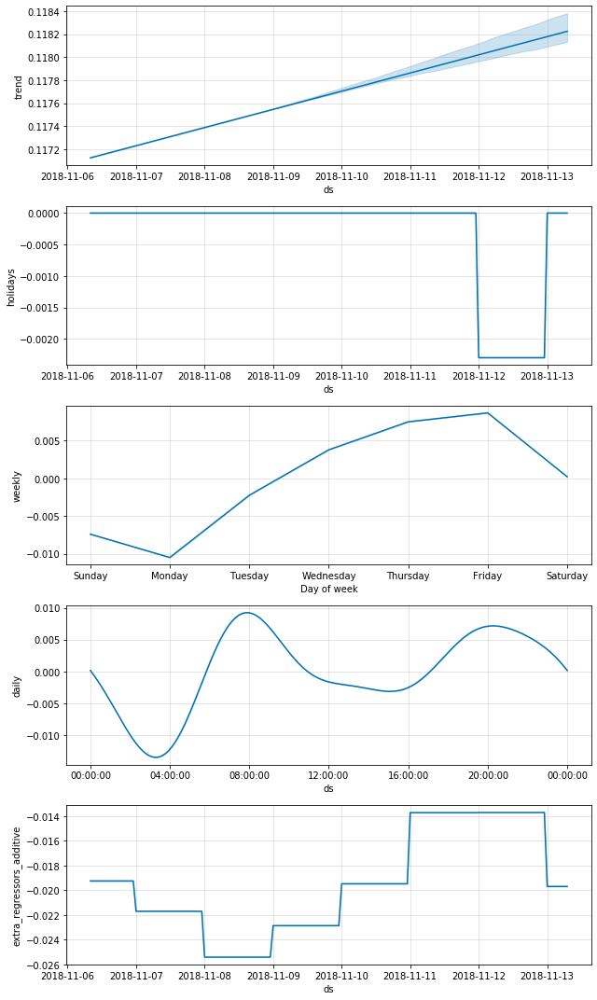

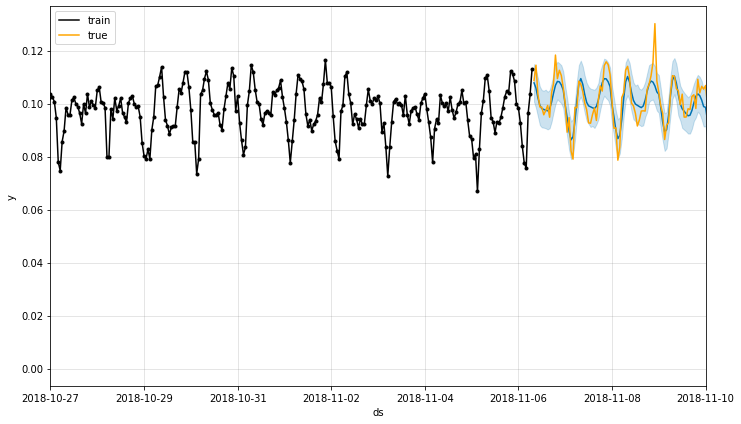

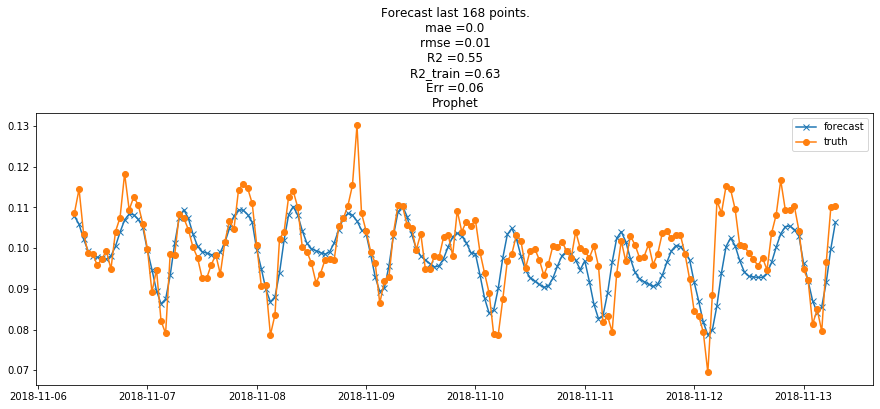

In [607]:
manhattan_tips_forecast = run_model_for_borough_cv(manhattan_tips['2018-02':], exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekday_Friday',
                                                                     'weekday_Monday', 'weekday_Saturday',
                                                   'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday',
                                                   'weekday_Wednesday', 'month_April', 'month_August', 'month_December',
                                                   'month_February', 'month_January', 'month_July', 'month_June',
                                                   'month_March', 'month_May', 'month_November', 'month_October',
                                                   'month_September','weekend', 'since_2018', 'SNOW', 'WT01', 'TAVG'])

#### Manhattan model - R2_train = 0.626, R2_test = 0.397, RMSE = 0.007

0.04757453726942047 -0.00047923598209556053 0.027585326102623868


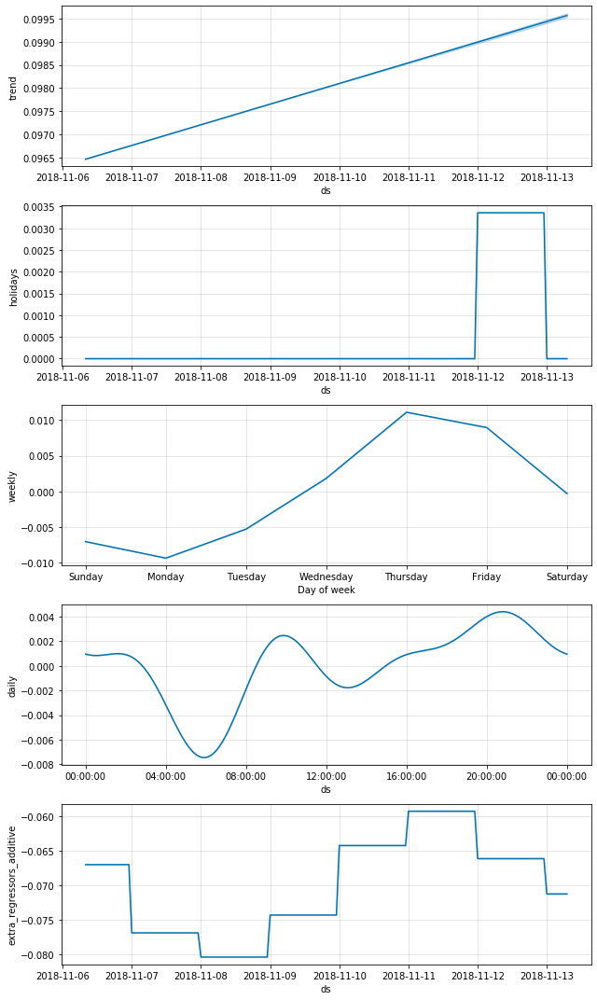

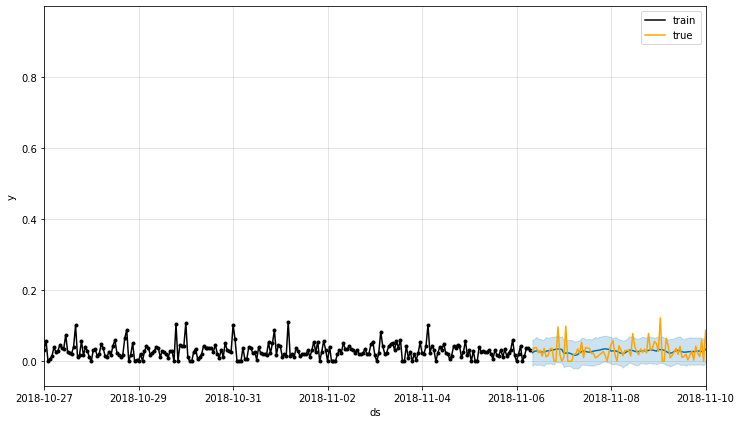

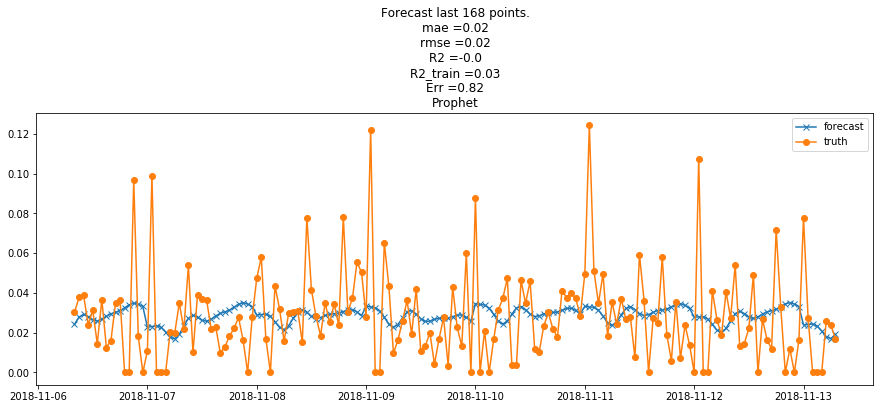

In [613]:
bronx_tips_forecast = run_model_for_borough_cv(bronx_tips['2018-02':], exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekday_Friday',
                                                                     'weekday_Monday', 'weekday_Saturday',
                                                   'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday',
                                                   'weekday_Wednesday', 'month_April', 'month_August', 'month_December',
                                                   'month_February', 'month_January', 'month_July', 'month_June',
                                                   'month_March', 'month_May', 'month_November', 'month_October',
                                                   'month_September','weekend', 'since_2018', 'SNOW', 'WT01', 'TAVG'])

#### Bronx model - R2_train = 0.048, R2_test = -.0005, RMSE = 0.028

0.37098651896710544 0.29025178495695947 0.014035939966641806


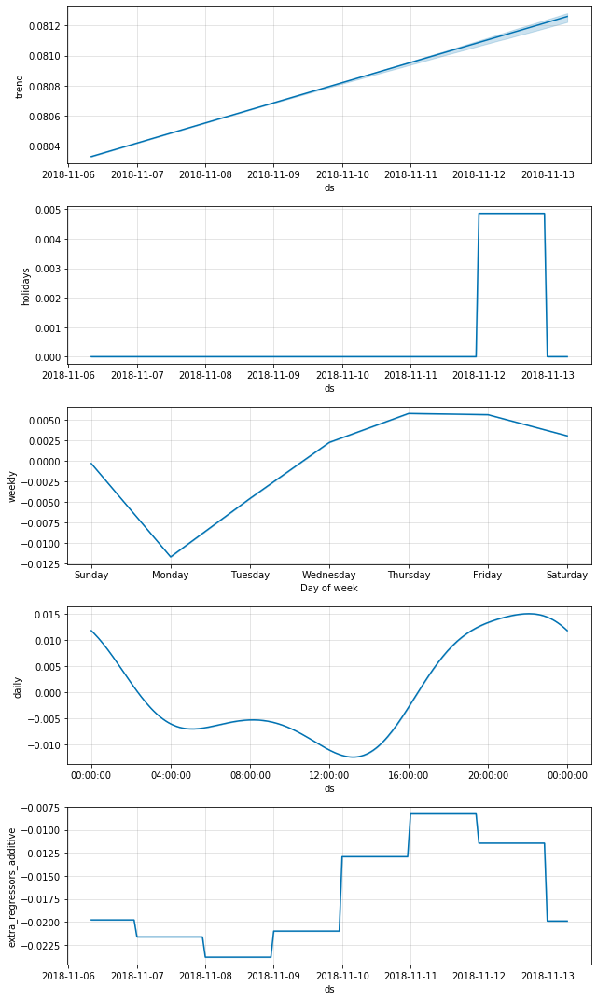

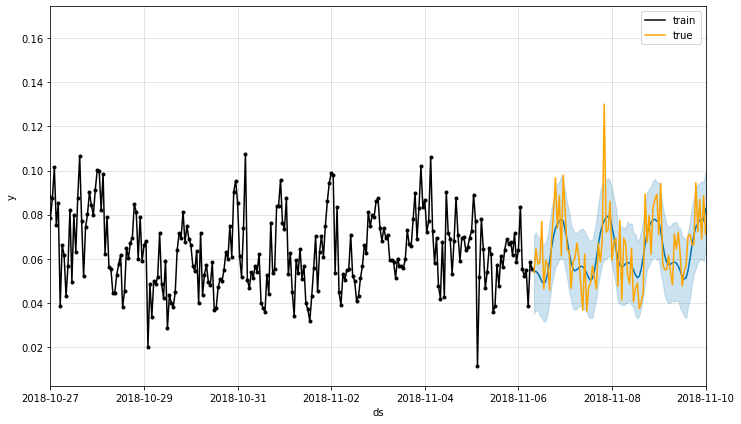

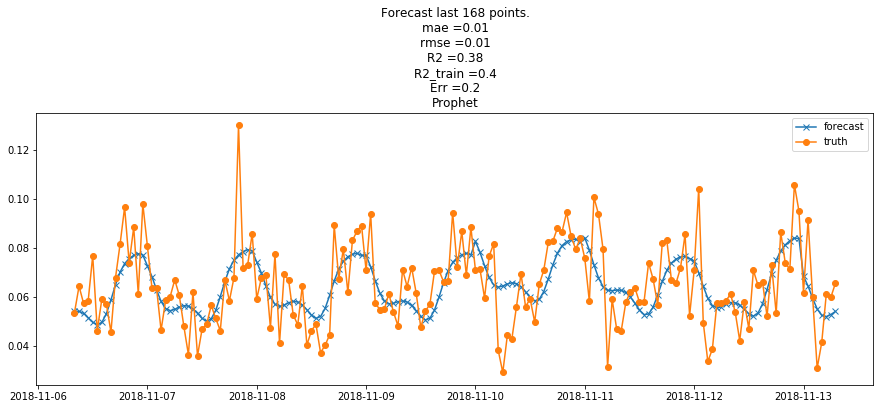

In [614]:
brooklyn_tips_forecast = run_model_for_borough_cv(brooklyn_tips['2018-02':], exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekday_Friday',
                                                                     'weekday_Monday', 'weekday_Saturday',
                                                   'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday',
                                                   'weekday_Wednesday', 'month_April', 'month_August', 'month_December',
                                                   'month_February', 'month_January', 'month_July', 'month_June',
                                                   'month_March', 'month_May', 'month_November', 'month_October',
                                                   'month_September','weekend', 'since_2018', 'SNOW', 'WT01', 'TAVG'])

#### Brooklyn model - R2_train = 0.371, R2_test = 0.290, RMSE = 0.014

0.359215591949397 0.2514895130318092 0.013398117175760596


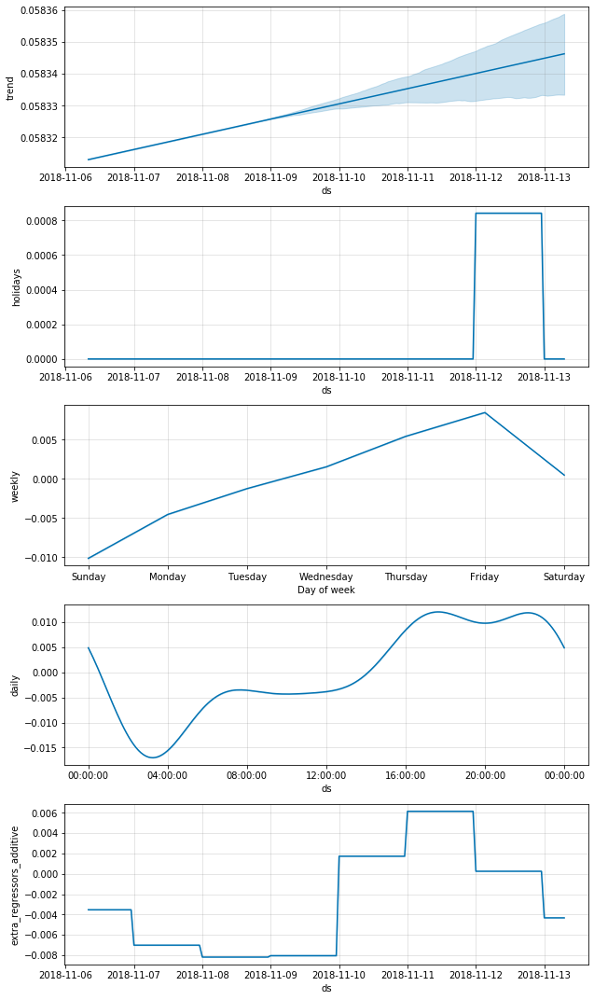

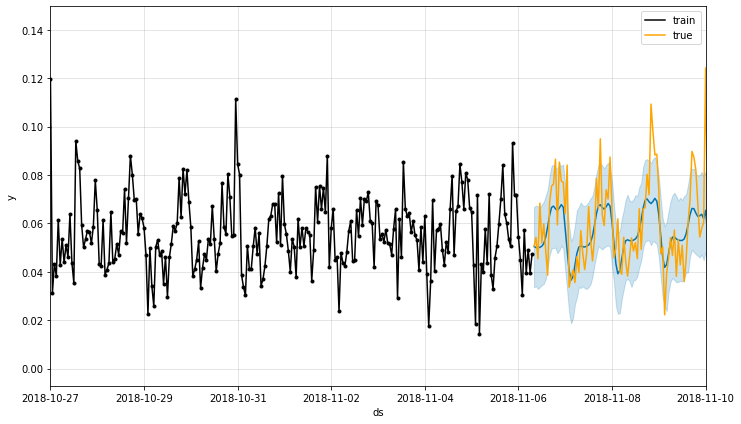

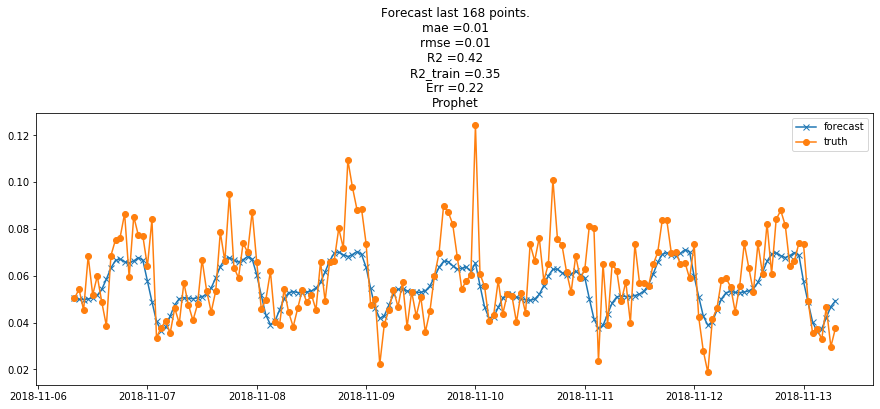

In [615]:
queens_tips_forecast = run_model_for_borough_cv(queens_tips['2018-02':], exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekday_Friday',
                                                                     'weekday_Monday', 'weekday_Saturday',
                                                   'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday',
                                                   'weekday_Wednesday', 'month_April', 'month_August', 'month_December',
                                                   'month_February', 'month_January', 'month_July', 'month_June',
                                                   'month_March', 'month_May', 'month_November', 'month_October',
                                                   'month_September','weekend', 'since_2018', 'SNOW', 'WT01', 'TAVG'])

#### Queens model - R2_train = 0.359, R2_test = 0.251, RMSE = 0.013

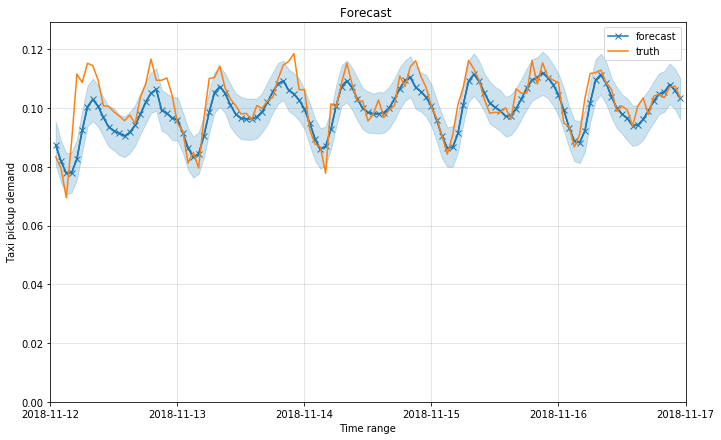

In [623]:
make_prediction_for_borough(manhattan_tips_exog,manhattan_tips_forecast_d[-1][-4], date1='2018-11-12', date2 = '2018-11-17')

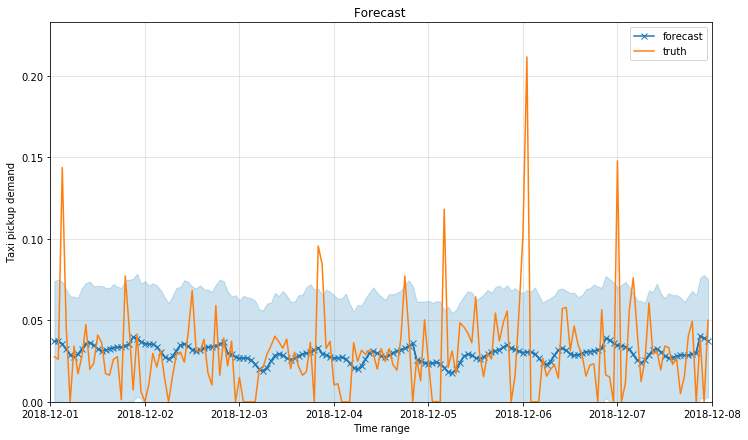

In [641]:
make_prediction_for_borough(bronx_tips_exog, bronx_tips_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

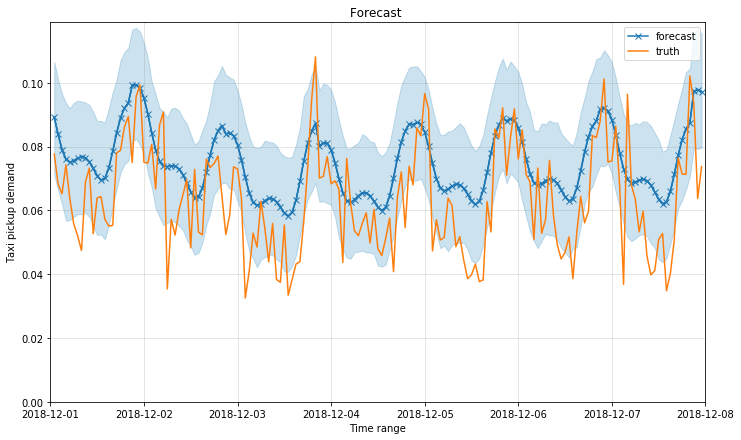

In [642]:
make_prediction_for_borough(brooklyn_tips_exog, brooklyn_tips_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

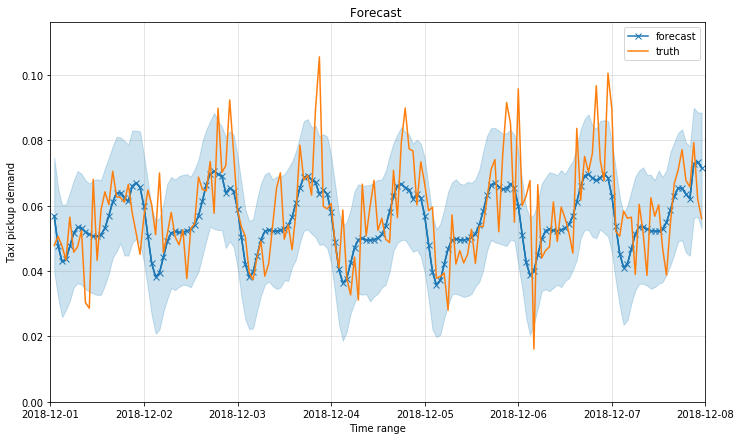

In [643]:
make_prediction_for_borough(queens_tips_exog, queens_tips_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

Save models to pickle file

In [648]:
pkl_path = "./models/manhattan_tips.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(manhattan_tips_forecast[-1][4], f)

In [649]:
pkl_path = "./models/bronx_tips.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(bronx_tips_forecast[-1][4], f)

In [650]:
pkl_path = "./models/brooklyn_tips.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(brooklyn_tips_forecast_hol[-1][4], f) # holiday modal had better results

In [651]:
pkl_path = "./models/queens_tips.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(queens_tips_forecast_hol[-1][4], f) # holiday modal had better results

Save dataframes to files

In [644]:
Save dataframes to filesmanhattan_tips_exog.to_csv("./models/manhattan_tips_exog.csv", index = False)
bronx_tips_exog.to_csv("./models/bronx_tips_exog.csv", index = False)
brooklyn_tips_exog.to_csv("./models/brooklyn_tips_exog.csv", index = False)
queens_tips_exog.to_csv("./models/queens_tips_exog.csv", index = False)

## Average fare forecast for boroughs

In [652]:
fare = pd.read_csv("nyc_neighborhoods_yellow_neigh_fare_hourly.csv", parse_dates = ['ds'])

In [653]:
fare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Columns: 265 entries, ds to 99
dtypes: datetime64[ns](1), float64(264)
memory usage: 17.7 MB


In [654]:
fare = fare.set_index('ds')

In [655]:
fare.head()

,1,2,3,4,5,6,7,8,9,10,...,261,262,263,264,265,59,172,110,104,99
ds,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,NaN,NaN,22.0,12.591954,NaN,NaN,11.731707,NaN,NaN,NaN,...,15.636364,9.870166,10.097403,12.652640,64.428571,NaN,NaN,NaN,NaN,NaN
2018-01-01 01:00:00,NaN,NaN,22.5,12.905844,NaN,NaN,13.250000,NaN,4.5,26.0,...,15.692857,11.625000,10.572987,12.772211,59.227273,NaN,NaN,NaN,NaN,NaN
2018-01-01 02:00:00,NaN,NaN,NaN,12.408497,100.0,NaN,10.932331,NaN,NaN,NaN,...,19.129630,10.835106,10.161312,13.690000,66.011000,NaN,NaN,NaN,NaN,NaN
2018-01-01 03:00:00,85.000000,NaN,NaN,13.925743,NaN,NaN,10.827103,NaN,NaN,99.0,...,15.092593,10.830189,9.693694,13.648727,69.660400,NaN,NaN,NaN,NaN,NaN
2018-01-01 04:00:00,56.666667,NaN,NaN,12.354545,NaN,NaN,14.636792,NaN,NaN,36.5,...,20.888889,13.895833,10.202222,15.867580,62.282609,NaN,NaN,NaN,NaN,NaN


In [656]:
manhattan_fare = fare[lst_manhattan].mean(axis = 1).fillna(0)
brooklyn_fare = fare[lst_brooklyn].mean(axis = 1).fillna(0)
bronx_fare = fare[lst_bronx].mean(axis = 1).fillna(0)
queens_fare = fare[lst_queens].mean(axis = 1).fillna(0)
staten_fare = fare[lst_staten].mean(axis = 1).fillna(0)

In [657]:
(manhattan_fare>0).sum(), (brooklyn_fare>0).sum(), (bronx_fare>0).sum(), (queens_fare>0).sum()

(8760, 8760, 8747, 8759)

In [658]:
(staten_fare>0).sum()

1920

In [694]:
manhattan_fare = manhattan_fare[manhattan_fare < 100]

In [697]:
queens_fare = queens_fare[queens_fare<100]

In [703]:
bronx_fare = bronx_fare[bronx_fare<100]

In [707]:
brooklyn_fare = brooklyn_fare[brooklyn_fare<100]

Go on without staten island

### Average fare prediction baseline models for boroughs

Running time series cross validation for baseline model

0.5000842625880864 0.403928320988153 1.0246607581512142


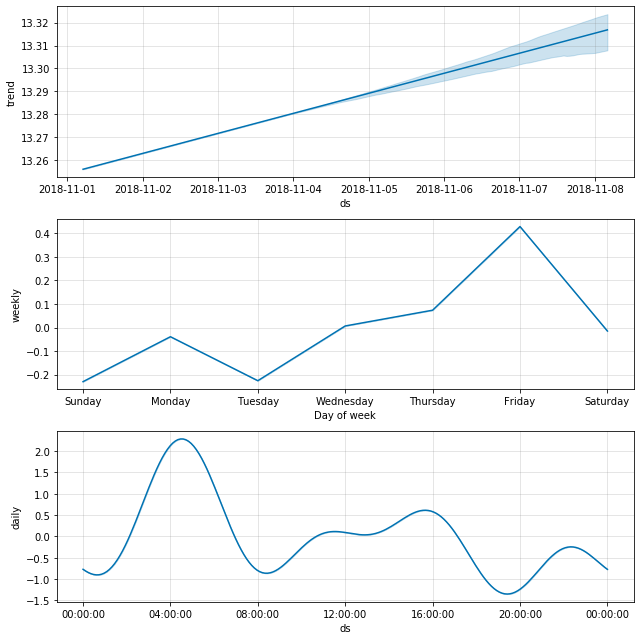

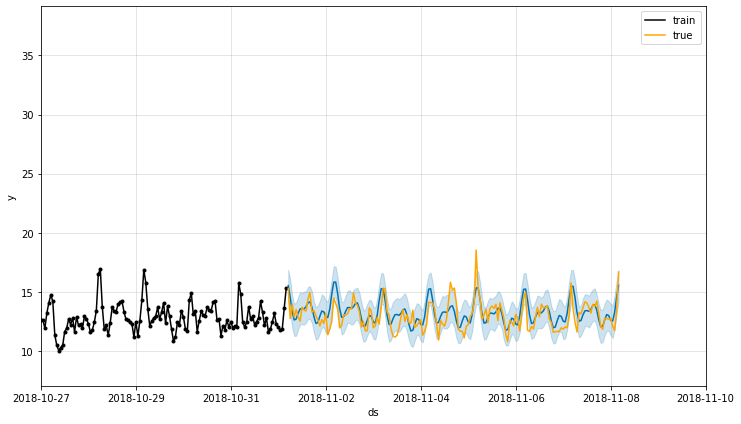

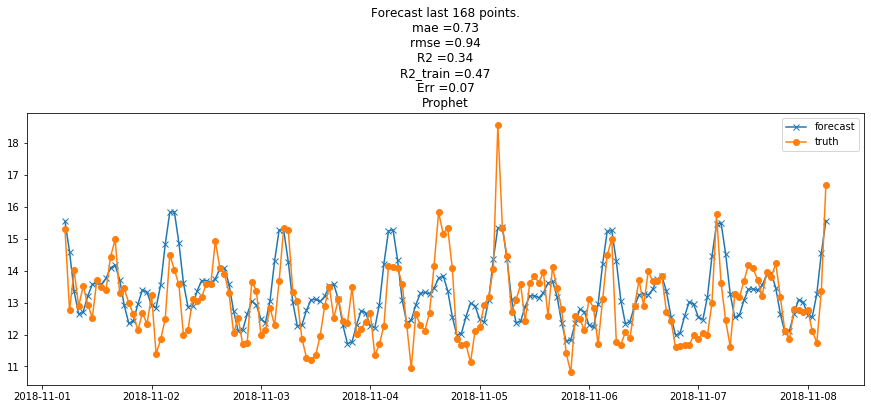

In [712]:
run_model_for_borough_cv(manhattan_fare, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Manhattan model - R2_train = 0.500, R2_test = 0.404, RMSE = 1.025

0.11216985694142148 0.07375063748054186 7.595398743620352


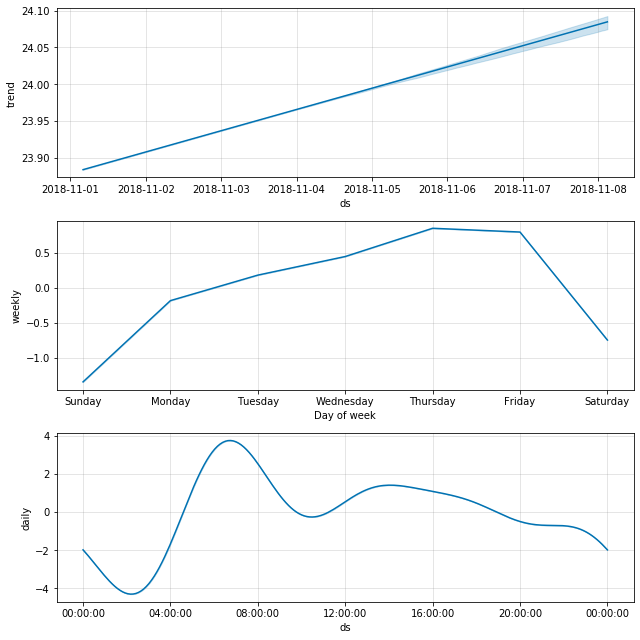

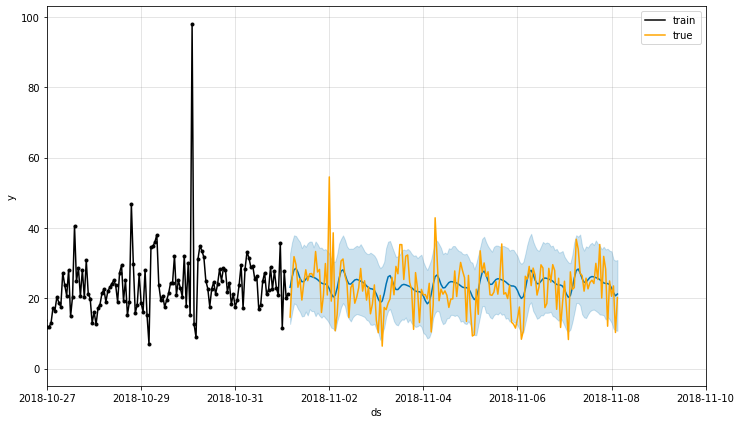

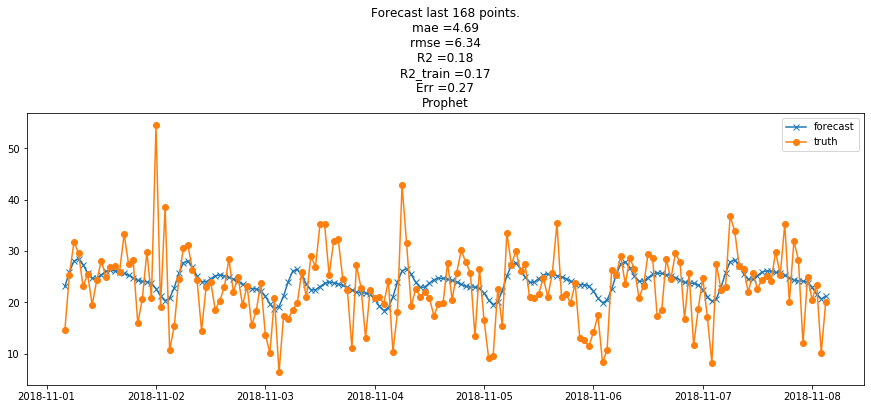

In [713]:
run_model_for_borough_cv(bronx_fare, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Bronx model - R2_train = 0.112, R2_test = 0.074, RMSE = 7.595

0.4062069582072828 0.3912096736879843 3.079094779929034


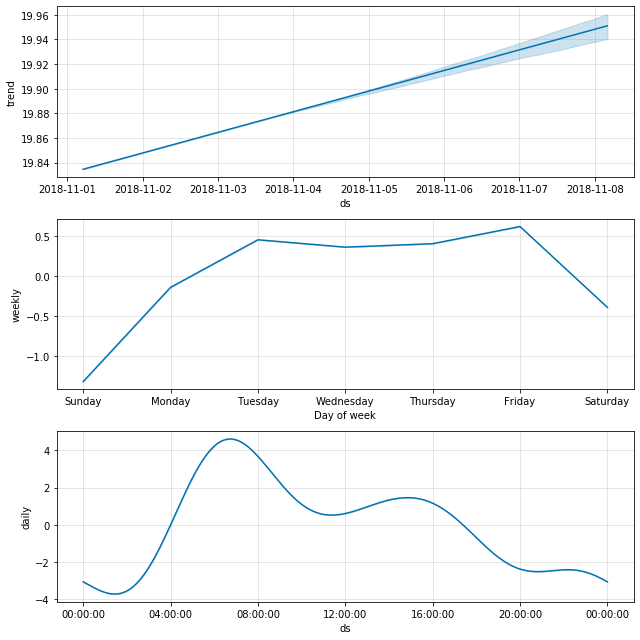

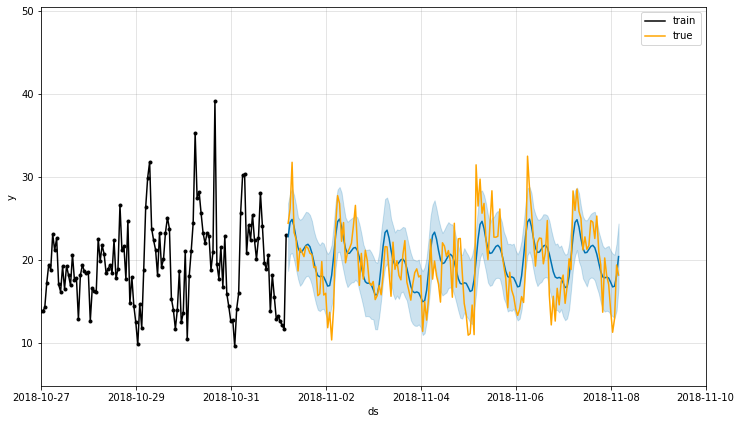

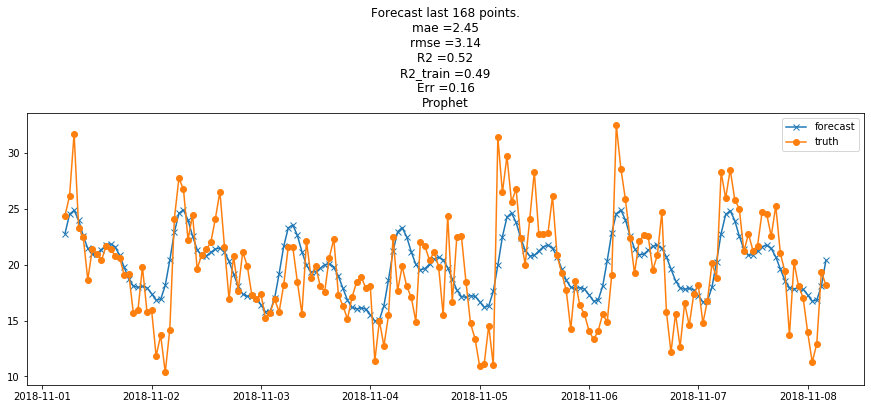

In [714]:
run_model_for_borough_cv(brooklyn_fare, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Brooklyn model - R2_train = 0.406, R2_test = 0.391, RMSE = 3.079

0.4341080037767354 0.41018284166140334 4.3517182557778815


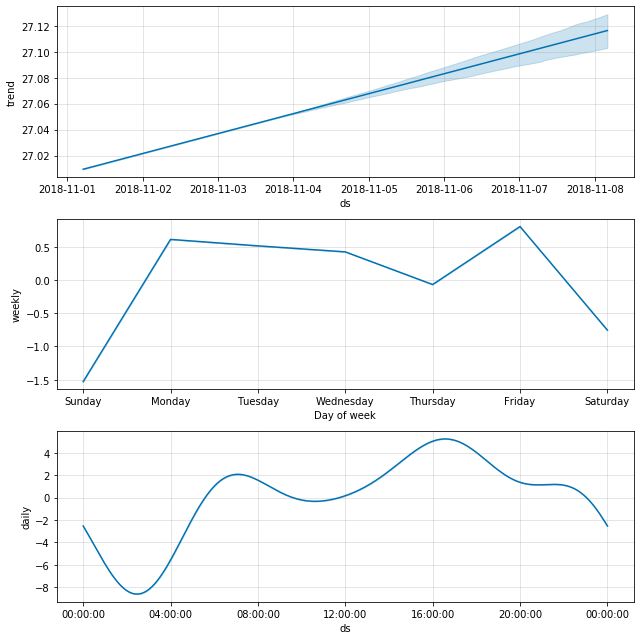

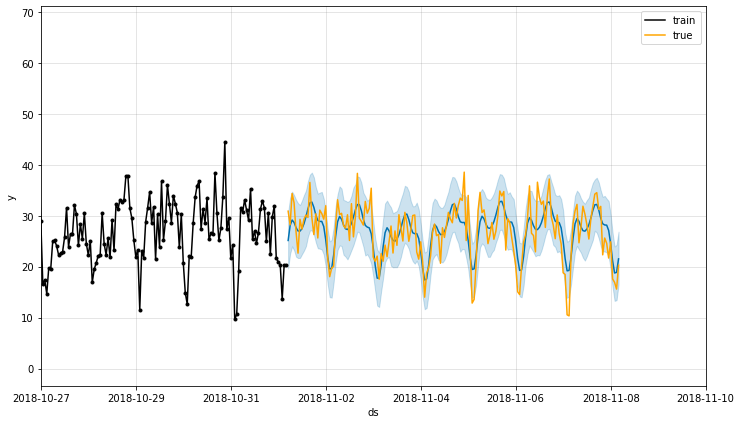

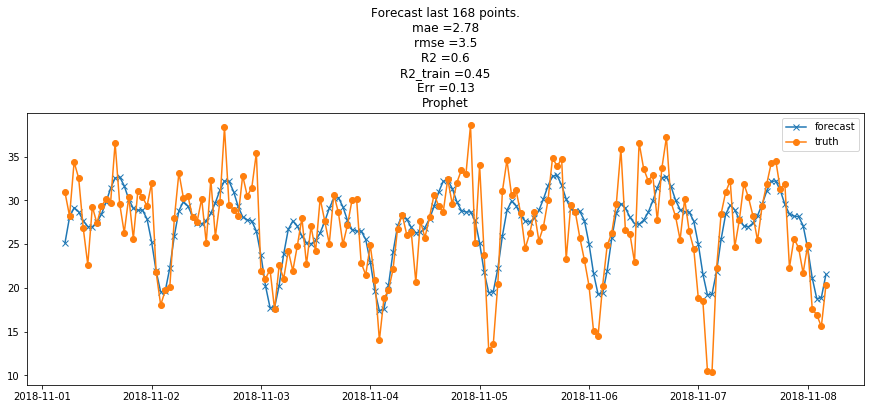

In [715]:
run_model_for_borough_cv(queens_fare, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Queens model - R2_train = 0.434, R2_test = 0.410, RMSE = 4.352

### Average fare forecast per borough - adding holidays

0.5002054610643095 0.39984630049601516 1.028003789766973


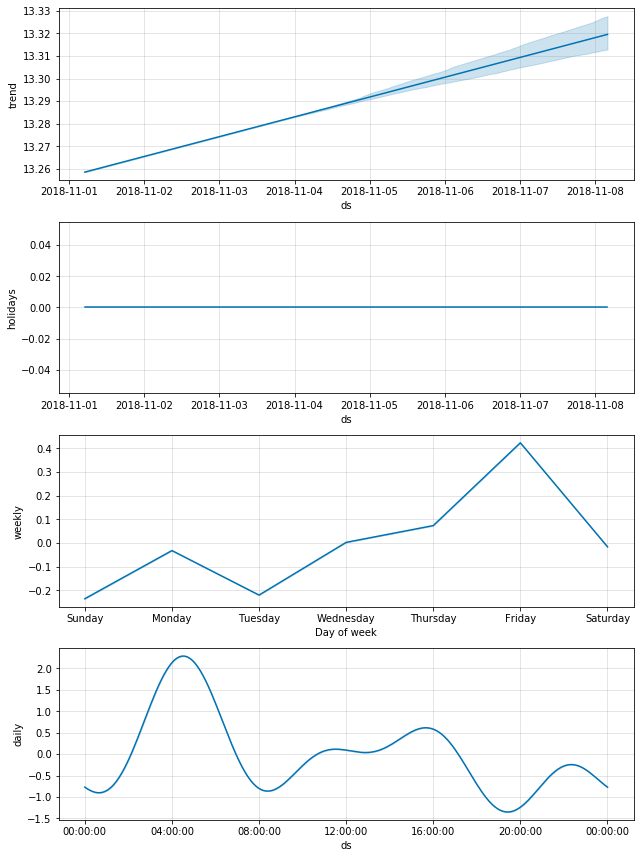

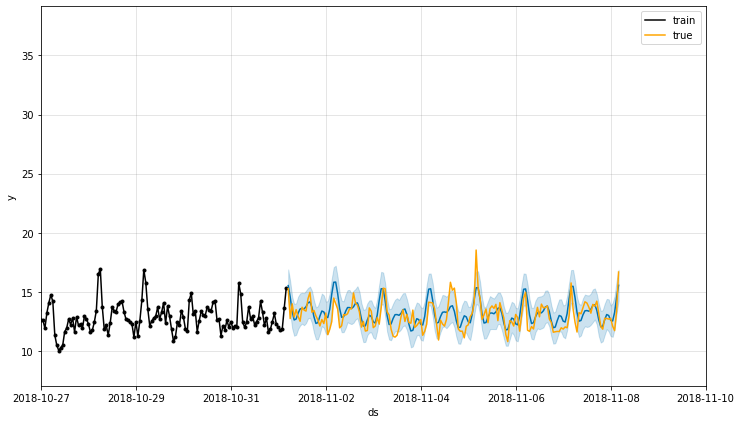

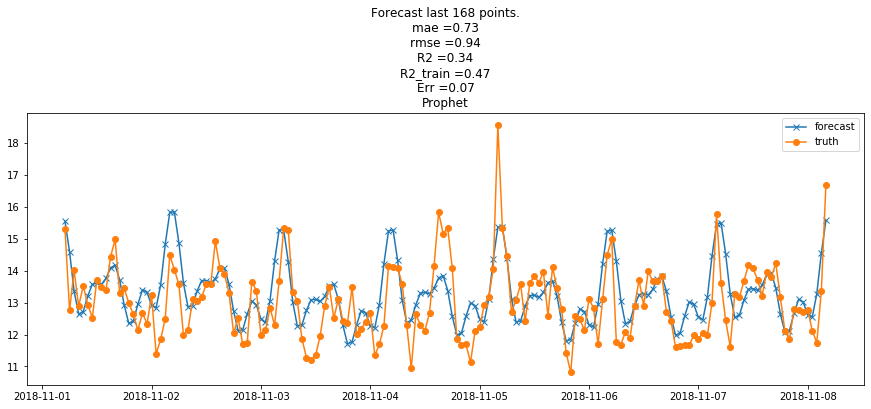

In [716]:
run_model_for_borough_cv(manhattan_fare, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Manhattan model - R2_train = 0.500, R2_test = 0.400, RMSE = 1.028

0.11272873587990298 0.06240112148873753 7.6377258143166085


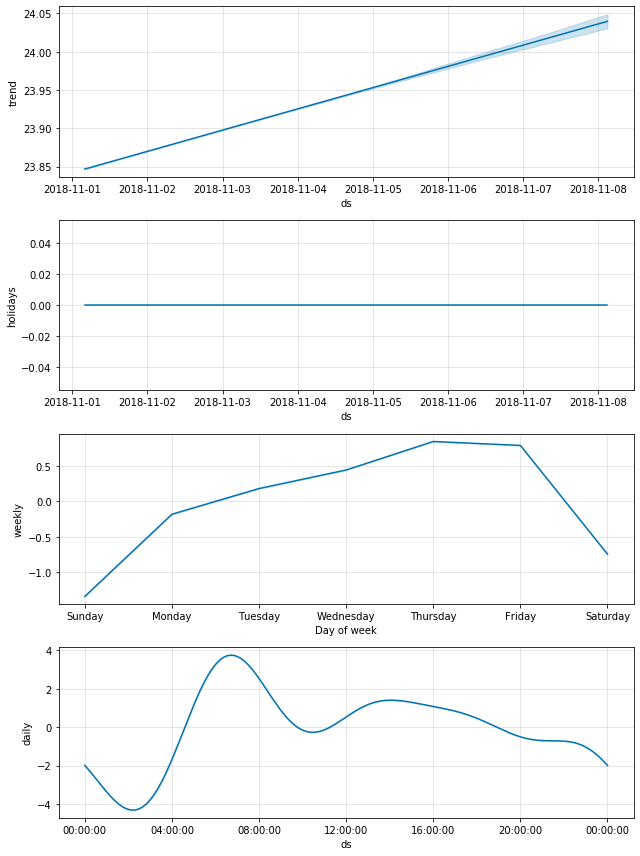

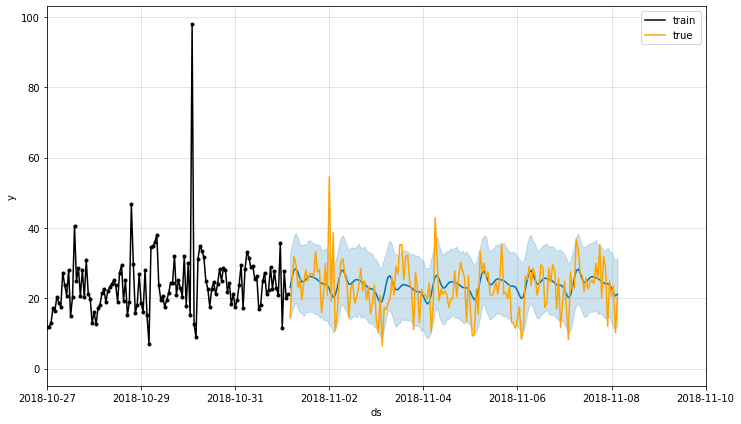

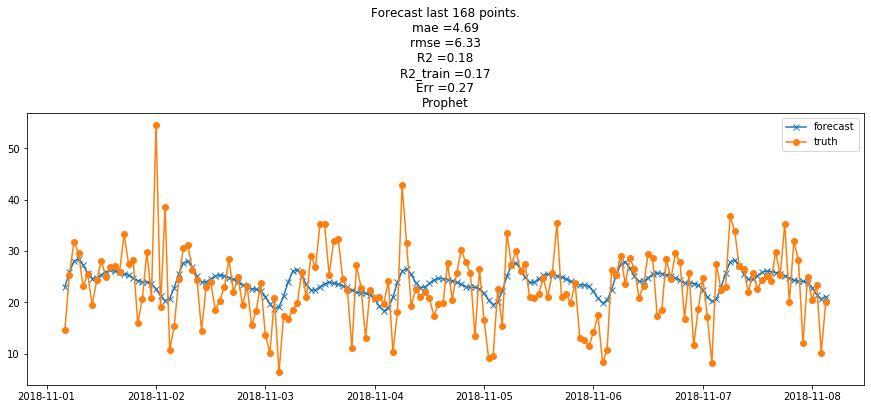

In [717]:
run_model_for_borough_cv(bronx_fare, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Bronx model - R2_train = 0.113, R2_test = 0.062, RMSE = 7.637

In [ ]:
run_model_for_borough_cv(brooklyn_fare, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1)

#### Brooklyn model - R2_train = 0.408, R2_test = 0.403, RMSE = 3.050

0.4362609021938232 0.4166456335512979 4.328635307104906


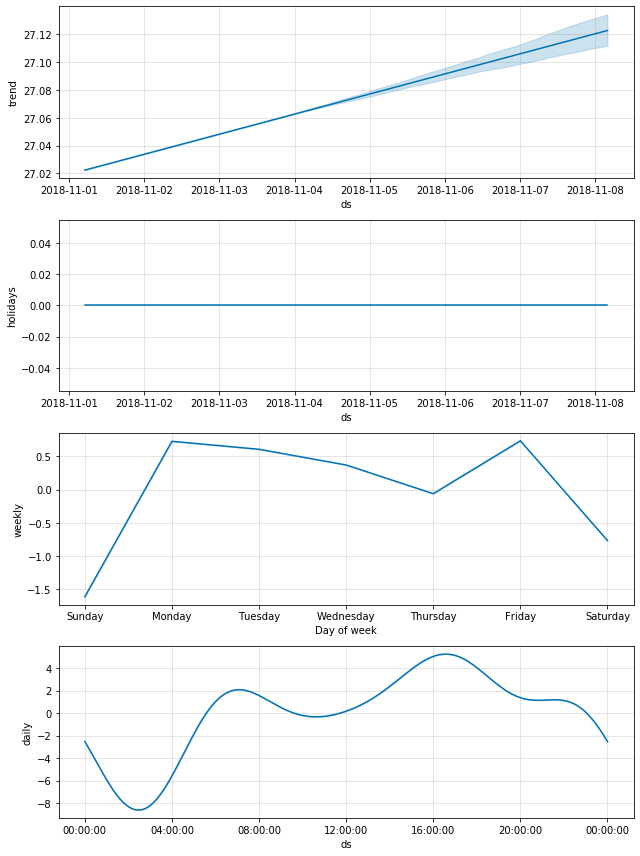

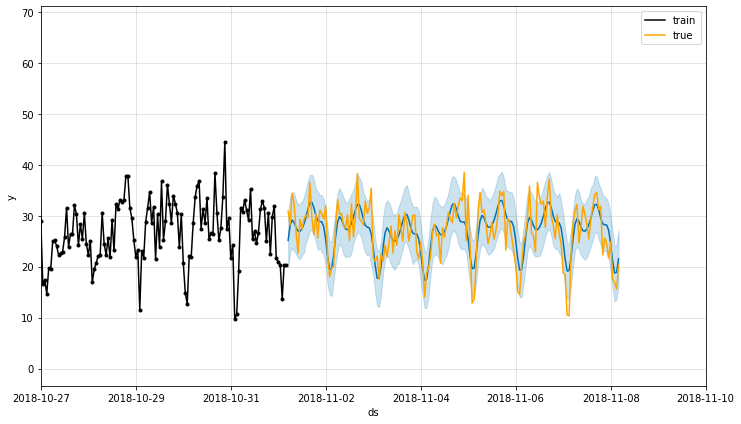

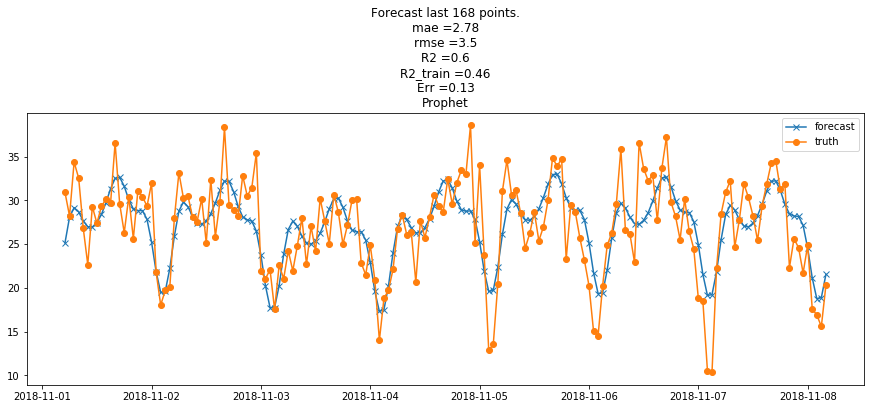

In [746]:
queens_fare_forecast_hol = run_model_for_borough_cv(queens_fare, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Queens model - R2_train = 0.436, R2_test = 0.417, RMSE = 4.329

### Average fare forecast - adding exogenous variables

In [721]:
manhattan_fare_exog = pd.DataFrame(manhattan_fare.copy()).reset_index()
manhattan_fare_exog.columns = ['ds', 'y']
manhattan_fare_exog = manhattan_fare_exog.join(exog)

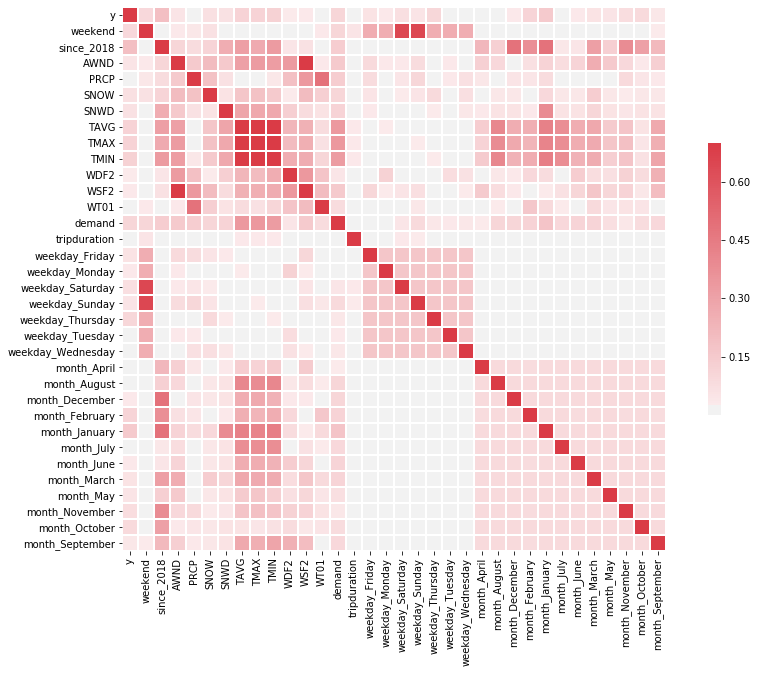

In [722]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(manhattan_fare_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [730]:
bronx_fare_exog = pd.DataFrame(bronx_fare.copy()).reset_index()
bronx_fare_exog.columns = ['ds', 'y']
bronx_fare_exog = bronx_fare_exog.join(exog)

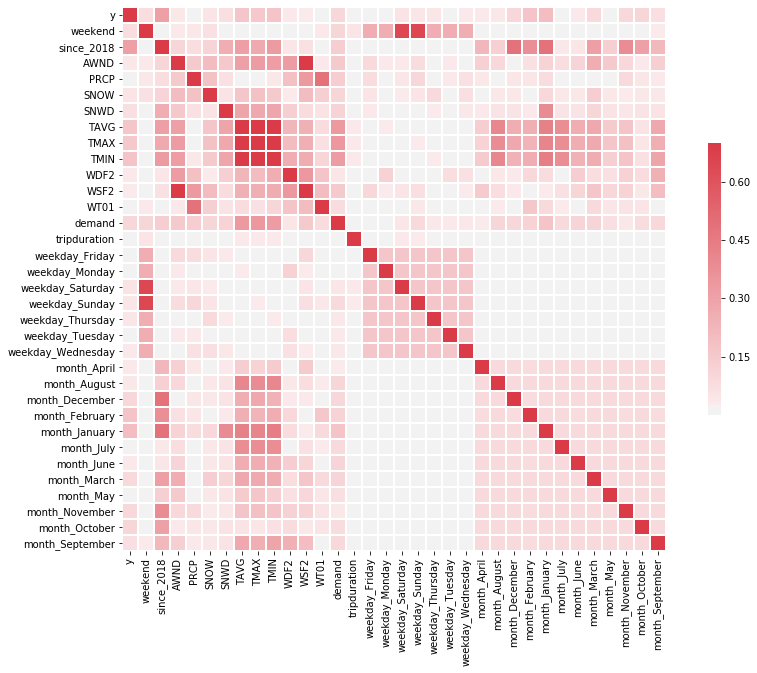

In [731]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(bronx_fare_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [732]:
bronx_fare_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,10.897222,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,14.574691,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,14.375689,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,20.254842,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,11.529183,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


In [733]:
brooklyn_fare_exog = pd.DataFrame(brooklyn_fare.copy()).reset_index()
brooklyn_fare_exog.columns = ['ds', 'y']
brooklyn_fare_exog = brooklyn_fare_exog.join(exog)

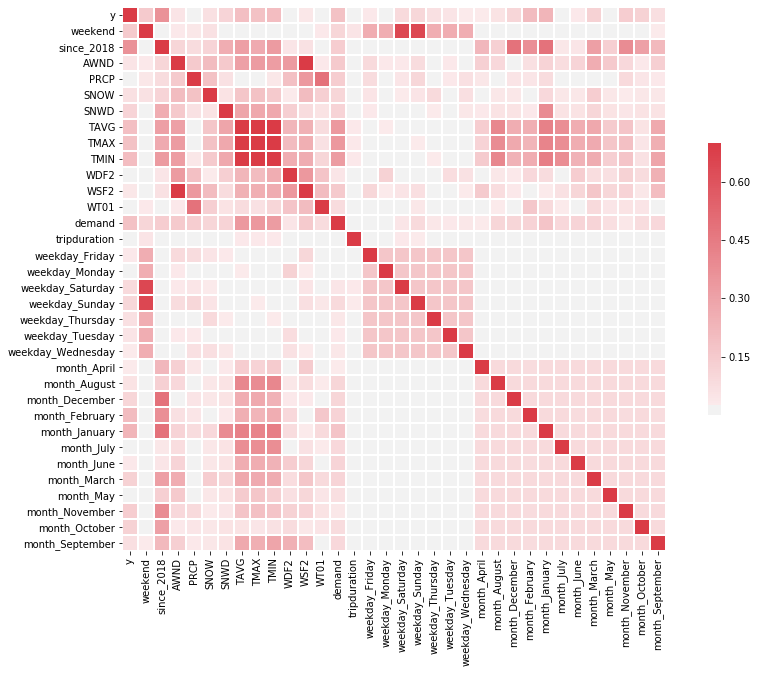

In [734]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(brooklyn_fare_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [735]:
brooklyn_fare_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,13.799025,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,15.724815,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,15.269607,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,16.524052,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,12.682600,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


In [736]:
queens_fare_exog = pd.DataFrame(queens_fare.copy()).reset_index()
queens_fare_exog.columns = ['ds', 'y']
queens_fare_exog = queens_fare_exog.join(exog)

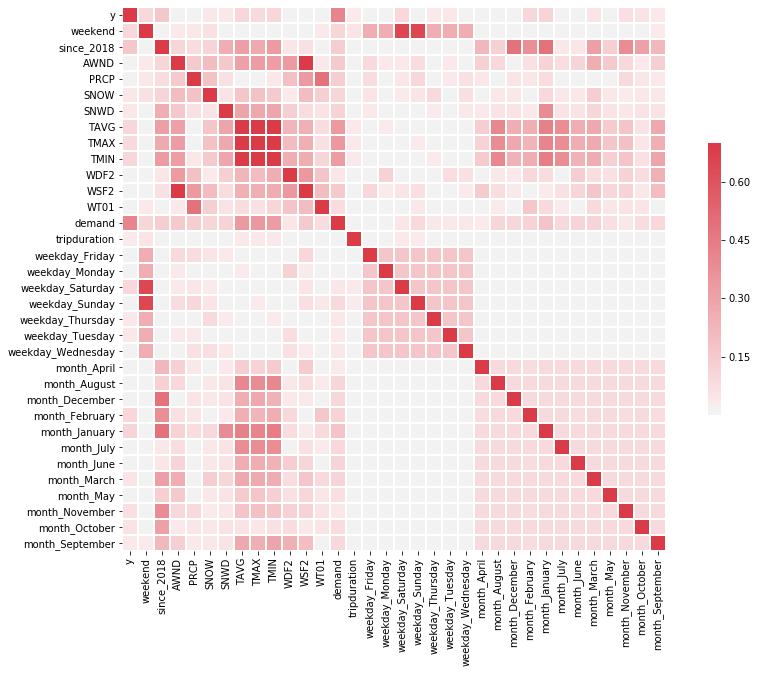

In [737]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(queens_fare_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [738]:
queens_fare_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,17.863222,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,19.215991,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,14.593357,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,17.264092,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,17.227797,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


### Regressors: weekend, since_2018, weather

0.5061863001562265 0.4148289110556477 1.01483447633051


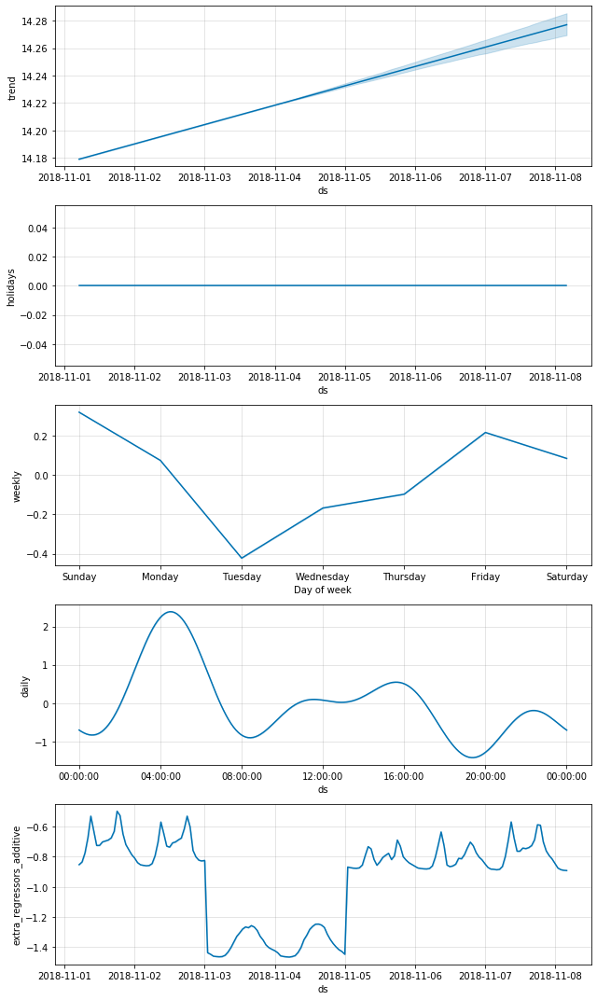

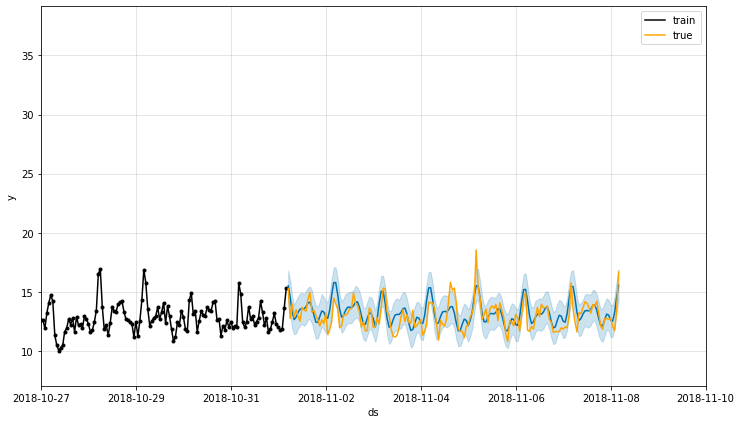

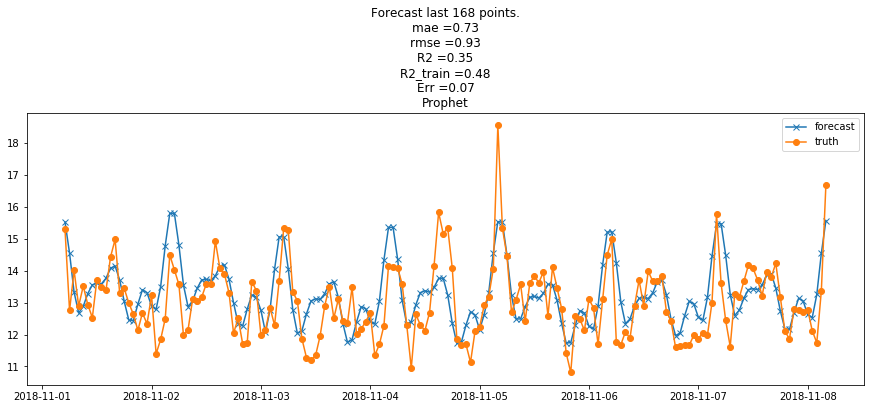

In [723]:
manhattan_fare_forecast = run_model_for_borough_cv(manhattan_fare, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekend', 'since_2018', 'demand'])

#### Manhattan model - R2_train = 0.506, R2_test = 0.415, RMSE = 1.015

0.1134774162771475 0.06389149229035987 7.631490681605615


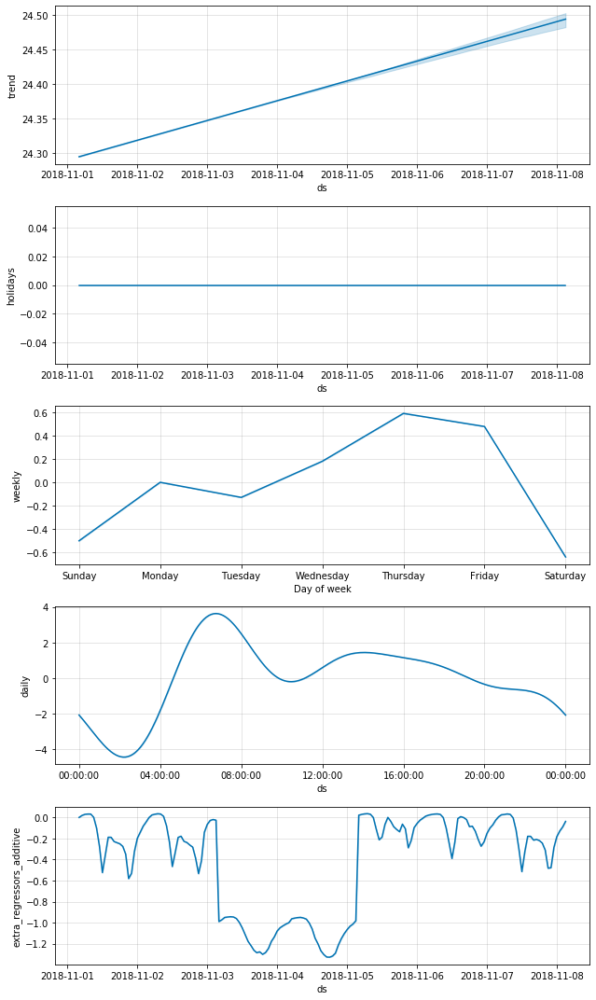

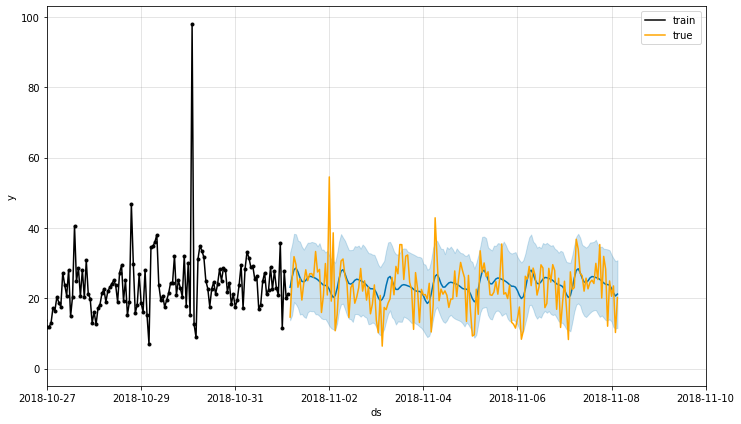

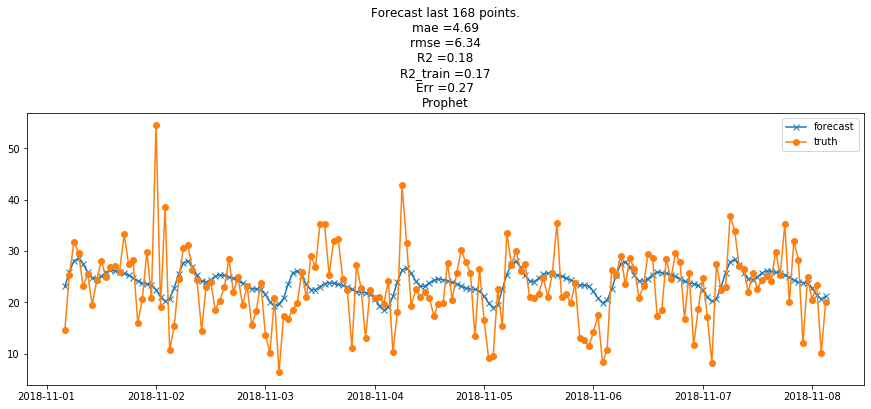

In [726]:
bronx_fare_forecast = run_model_for_borough_cv(bronx_fare, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekend', 'since_2018', 'demand'])

#### Bronx model - R2_train = 0.113, R2_test = 0.064, RMSE = 7.631

0.41212484307143027 0.4129827752640927 3.0267580054598113


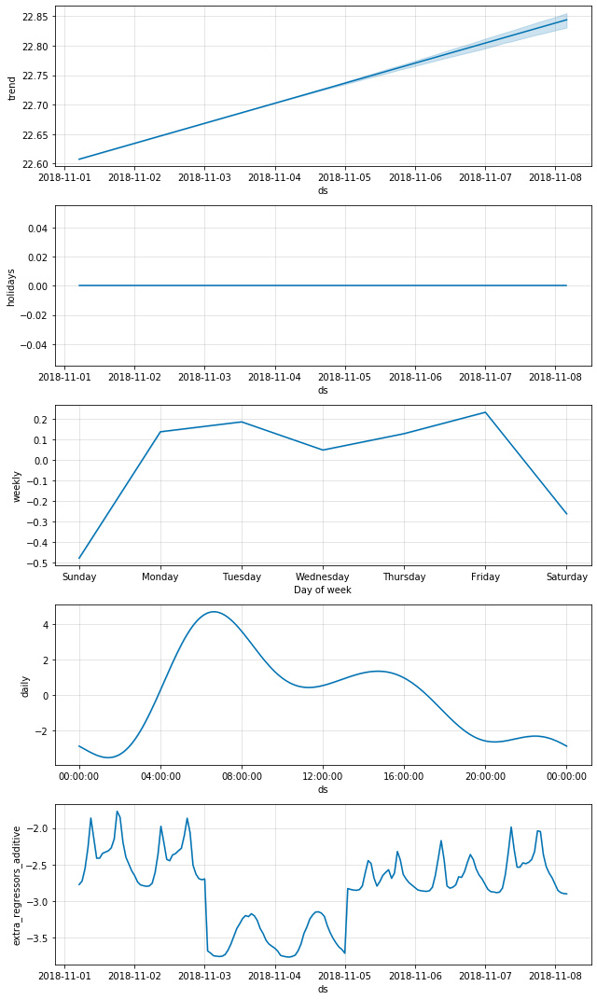

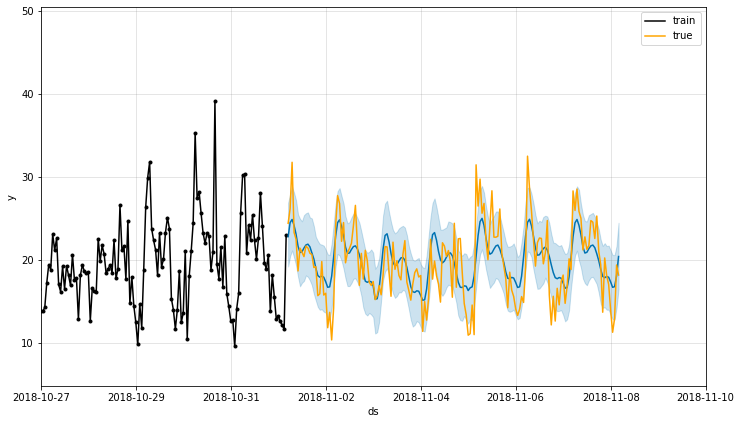

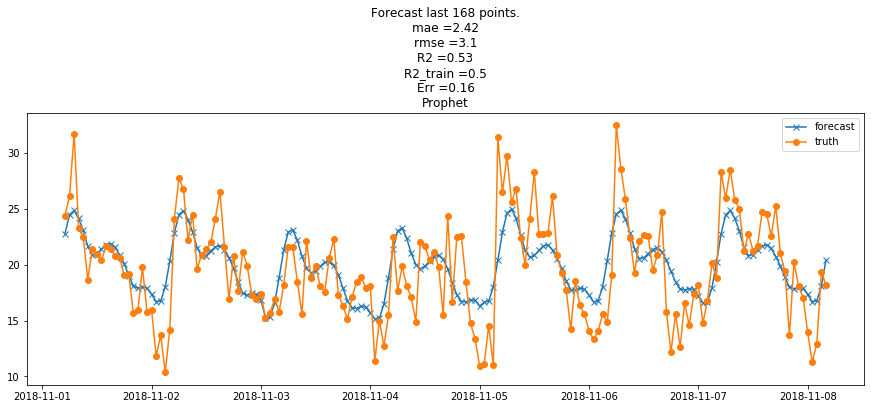

In [727]:
brooklyn_fare_forecast = run_model_for_borough_cv(brooklyn_fare, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekend', 'since_2018', 'demand'])

#### Brooklyn model - R2_train = 0.412, R2_test = 0.413, RMSE = 3.027

0.43918369859246875 0.41520309301616604 4.332435932823107


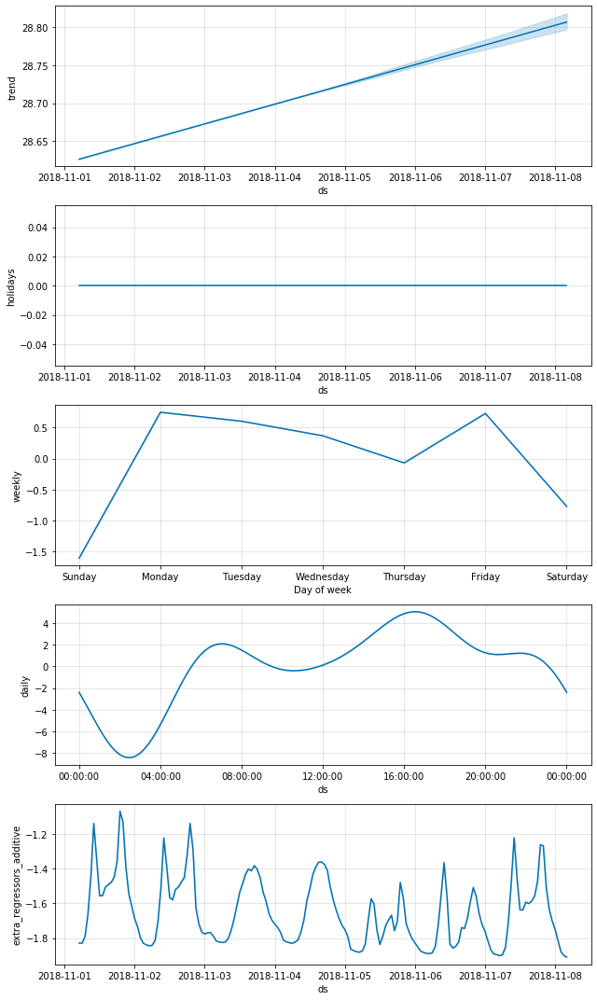

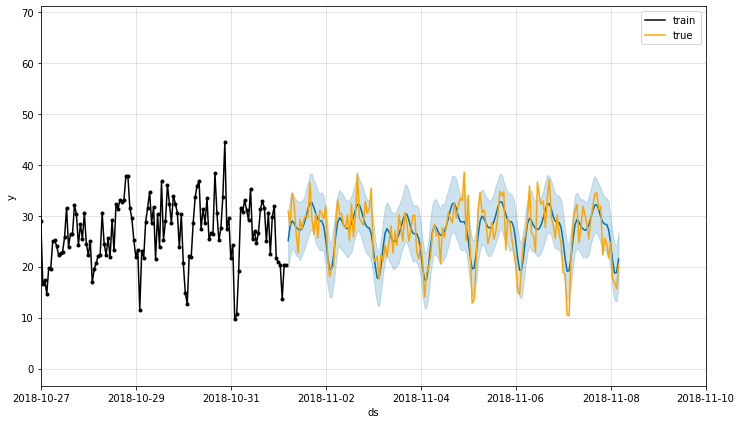

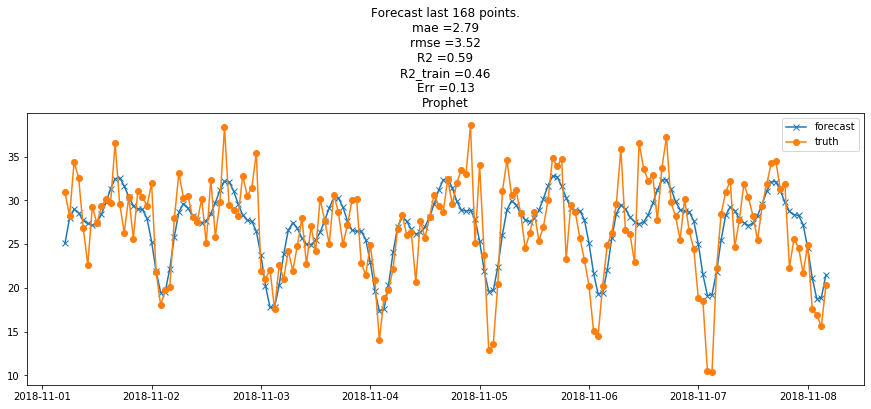

In [728]:
queens_fare_forecast = run_model_for_borough_cv(queens_fare, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekend', 'since_2018', 'demand'])

#### Queens model - R2_train = 0.439, R2_test = 0.415, RMSE = 4.332

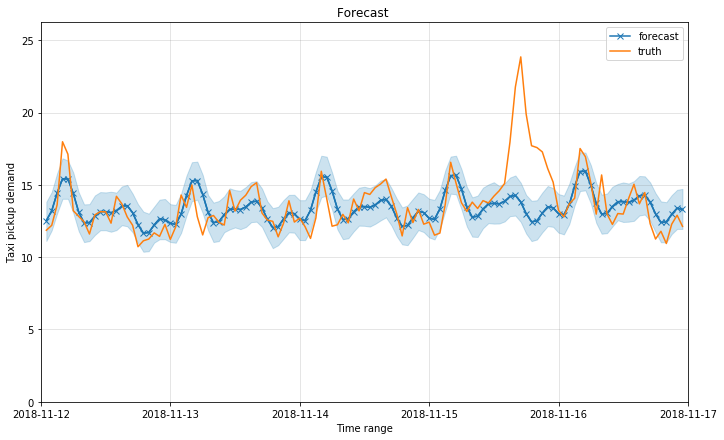

In [742]:
make_prediction_for_borough(manhattan_fare_exog,manhattan_fare_forecast_d[-1][-4], date1='2018-11-12', date2 = '2018-11-17')

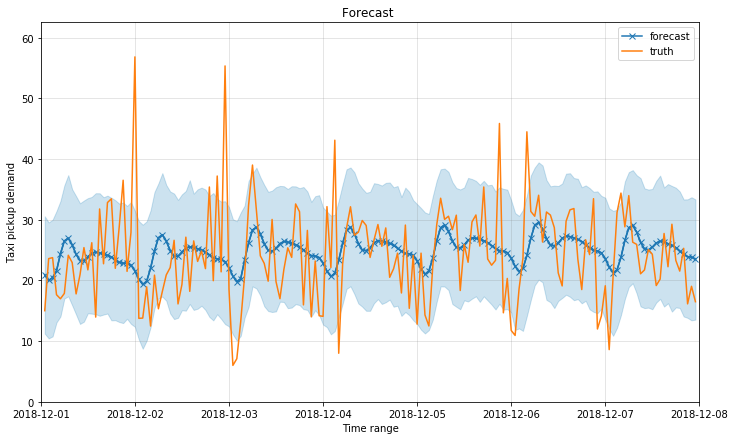

In [739]:
make_prediction_for_borough(bronx_fare_exog, bronx_fare_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

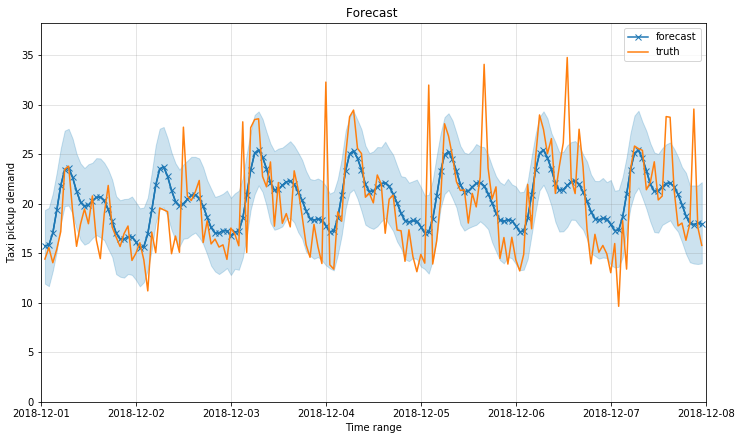

In [740]:
make_prediction_for_borough(brooklyn_fare_exog, brooklyn_fare_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

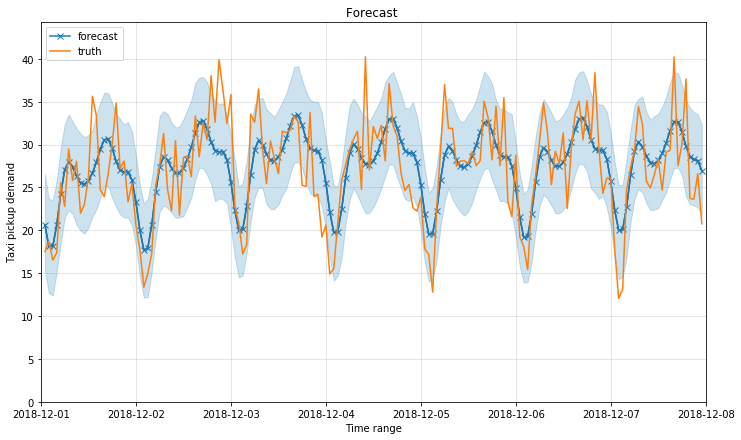

In [747]:
make_prediction_for_borough(queens_fare_exog, queens_fare_forecast_hol[-1][4],date1='2018-12-01', date2 = '2018-12-08')

Save models to pickle file

In [743]:
pkl_path = "./models/manhattan_fare.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' modelSave models to pickle file
    pickle.dump(manhattan_fare_forecast[-1][4], f)

In [744]:
pkl_path = "./models/bronx_fare.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(bronx_fare_forecast[-1][4], f)

In [745]:
pkl_path = "./models/brooklyn_fare.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(brooklyn_fare_forecast[-1][4], f)

In [ ]:
pkl_path = "./models/queens_fare.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(queens_fare_forecast_hol[-1][4], f) # holiday model performed the best for queens

Save dataframes to files

In [749]:
manhattan_fare_exog.to_csv("./models/manhattan_fare_exog.csv", index = False)
bronx_fare_exog.to_csv("./models/bronx_fare_exog.csv", index = False)
brooklyn_fare_exog.to_csv("./models/brooklyn_fare_exog.csv", index = False)
queens_fare_exog.to_csv("./models/queens_fare_exog.csv", index = False)

## Trip distance forecast for boroughs

In [750]:
trip = pd.read_csv("nyc_neighborhoods_yellow_neigh_trip_hourly.csv", parse_dates = ['ds'])

In [751]:
trip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Columns: 265 entries, ds to 99
dtypes: datetime64[ns](1), float64(264)
memory usage: 17.7 MB


In [752]:
trip = trip.set_index('ds')

In [753]:
trip.head()

,1,2,3,4,5,6,7,8,9,10,...,261,262,263,264,265,59,172,110,104,99
ds,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,NaN,NaN,6.2,2.652874,NaN,NaN,2.970488,NaN,NaN,NaN,...,4.034545,2.361492,2.453485,2.433731,0.345000,NaN,NaN,NaN,NaN,NaN
2018-01-01 01:00:00,NaN,NaN,6.9,3.013571,NaN,NaN,3.177400,NaN,0.8,8.47,...,4.146000,2.769487,2.529883,2.735600,0.425455,NaN,NaN,NaN,NaN,NaN
2018-01-01 02:00:00,NaN,NaN,NaN,3.018954,0.0,NaN,2.709398,NaN,NaN,NaN,...,5.358519,2.782340,2.428959,2.709448,2.988500,NaN,NaN,NaN,NaN,NaN
2018-01-01 03:00:00,0.01,NaN,NaN,3.301881,NaN,NaN,2.734860,NaN,NaN,30.96,...,4.015556,2.829434,2.456787,2.873709,1.160400,NaN,NaN,NaN,NaN,NaN
2018-01-01 04:00:00,0.00,NaN,NaN,3.257273,NaN,NaN,3.900377,NaN,NaN,13.60,...,5.260556,4.097083,2.741822,3.102968,4.867391,NaN,NaN,NaN,NaN,NaN


In [754]:
manhattan_trip = trip[lst_manhattan].mean(axis = 1).fillna(0)
brooklyn_trip = trip[lst_brooklyn].mean(axis = 1).fillna(0)
bronx_trip = trip[lst_bronx].mean(axis = 1).fillna(0)
queens_trip = trip[lst_queens].mean(axis = 1).fillna(0)
staten_trip = trip[lst_staten].mean(axis = 1).fillna(0)

In [755]:
(manhattan_trip>0).sum(), (brooklyn_trip>0).sum(), (bronx_trip>0).sum(), (queens_trip>0).sum()

(8760, 8760, 8744, 8759)

In [765]:
(staten_trip>0).sum()

1706

Go on without staten island

In [759]:
queens_trip = queens_trip[queens_trip<100]

In [762]:
bronx_trip = bronx_trip[bronx_trip < 30]

### Average trip distance prediction baseline models for boroughs

Running time series cross validation for baseline model

0.7994199059721148 0.7700036560182262 0.282895178089288


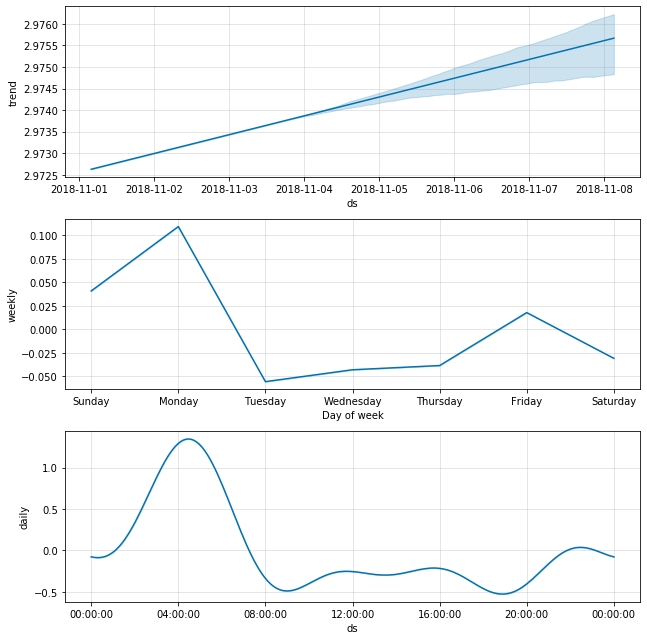

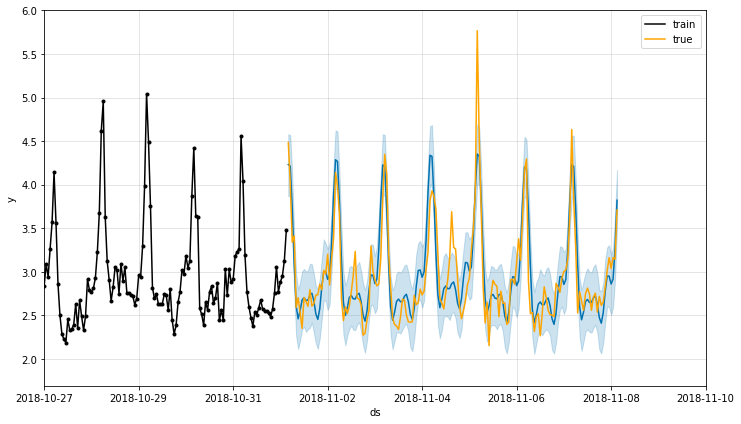

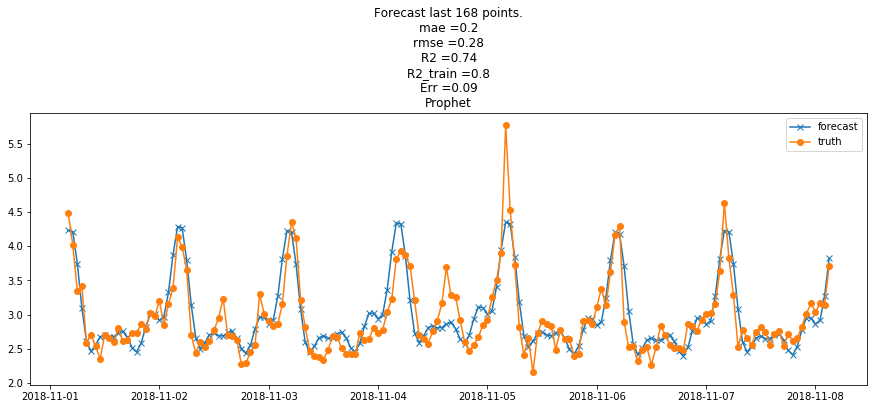

In [770]:
run_model_for_borough_cv(manhattan_trip, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Manhattan model - R2_train = 0.799, R2_test = 0.770, RMSE = 0.283

0.2038405106433266 0.09091362111242314 2.2106212186547283


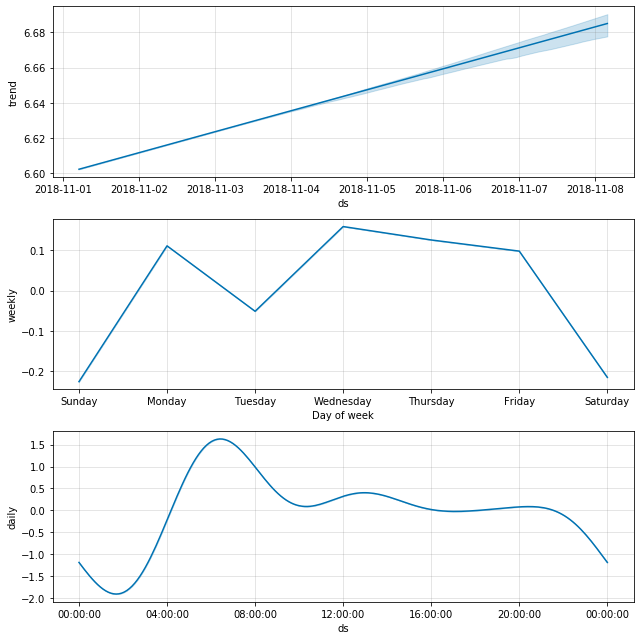

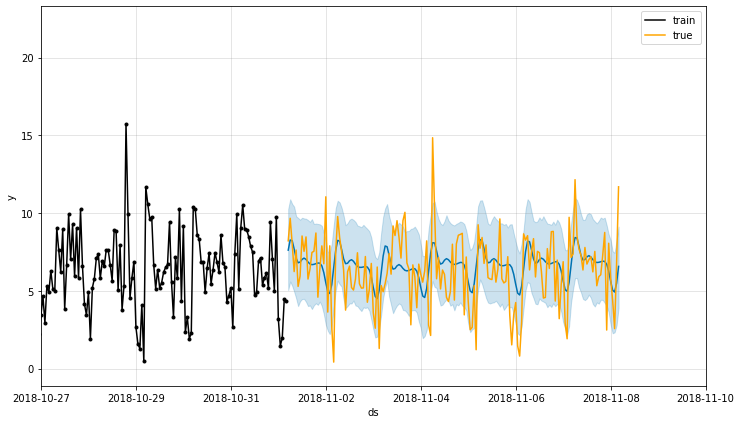

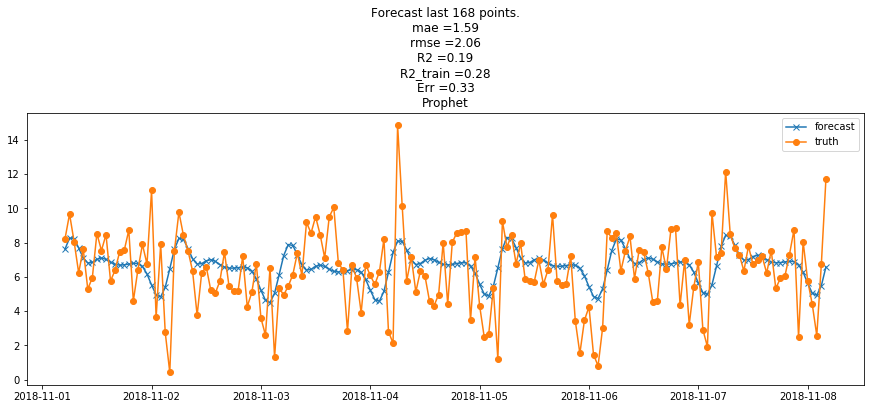

In [801]:
bronx_trip_forecast_base = run_model_for_borough_cv(bronx_trip, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1)

#### Bronx model - R2_train = 0.203, R2_test = 0.091, RMSE = 2.211

0.479667230295563 0.4125075787413893 0.890368834547241


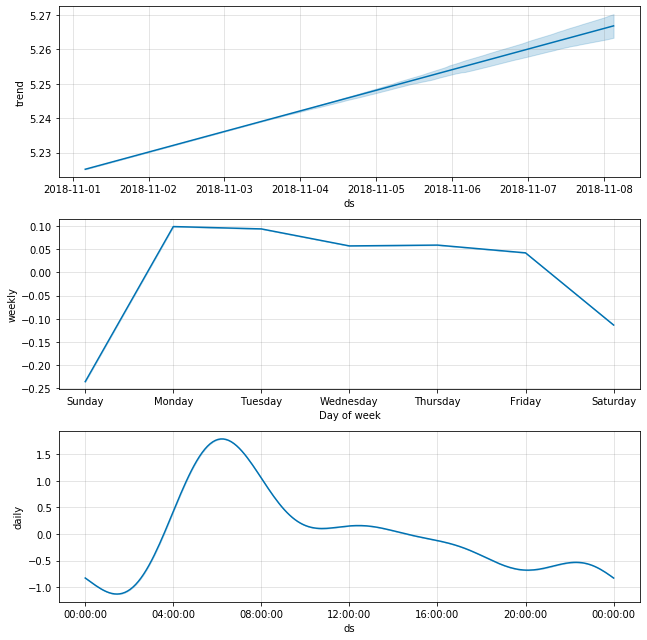

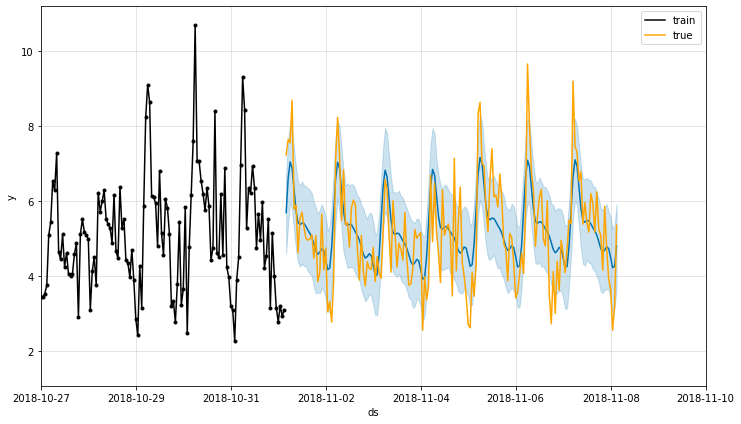

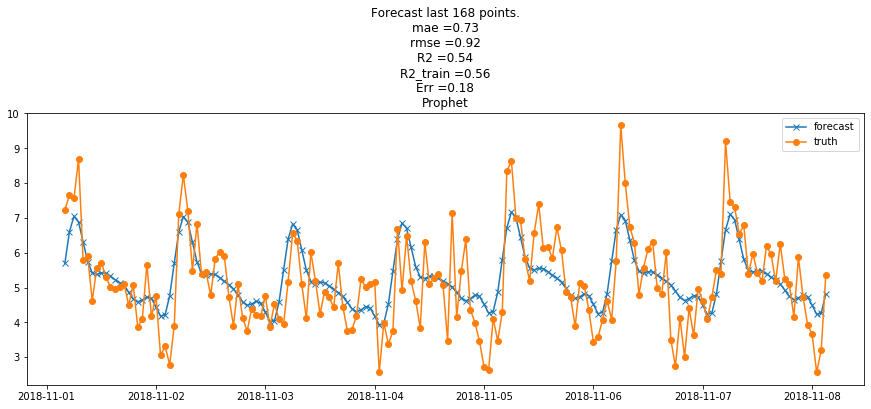

In [772]:
run_model_for_borough_cv(brooklyn_trip, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Brooklyn model - R2_train = 0.480, R2_test = 0.413, RMSE = 0.890

0.42910712255048533 0.4479375358036165 1.012863996649489


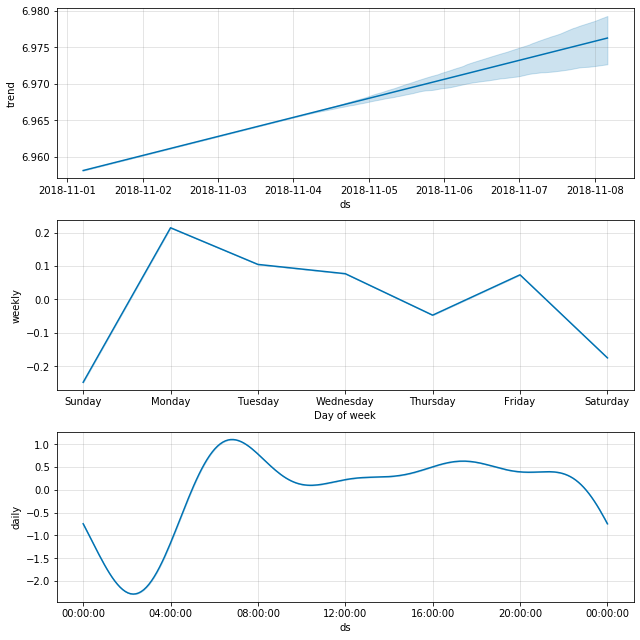

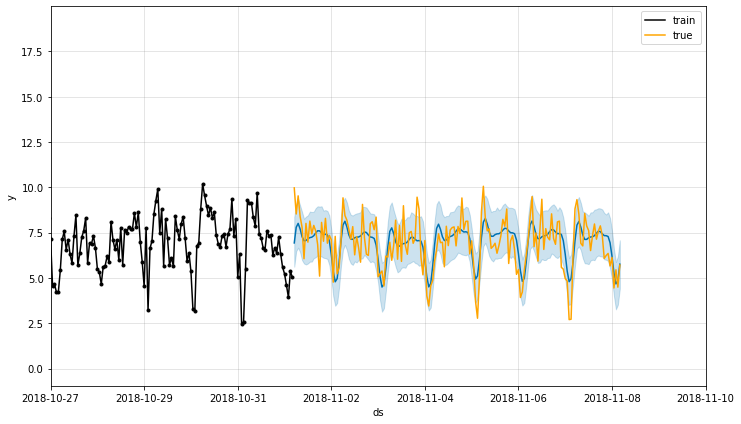

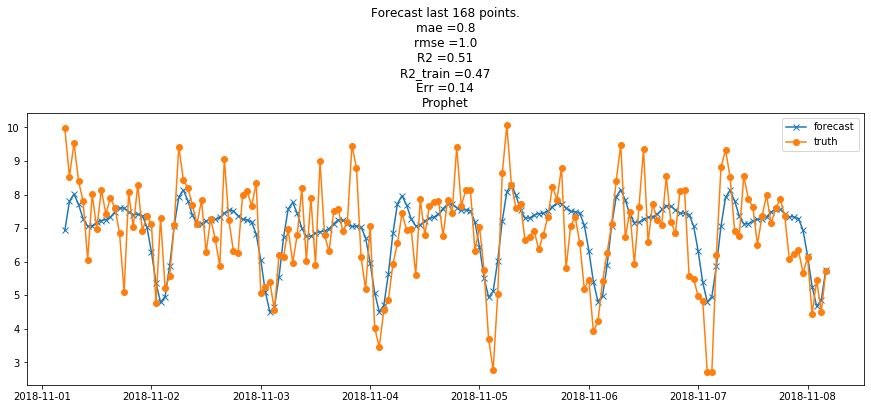

In [773]:
run_model_for_borough_cv(queens_trip, exog, nfolds = 5, periods = 168, freq='h', include_holidays = False, add_regressors = False, show = -1);

#### Queens model - R2_train = 0.429, R2_test = 0.448, RMSE = 1.013

### Average trip dostance forecast per borough - adding holidays

0.8007440119636836 0.7713215804438979 0.28214067538297377


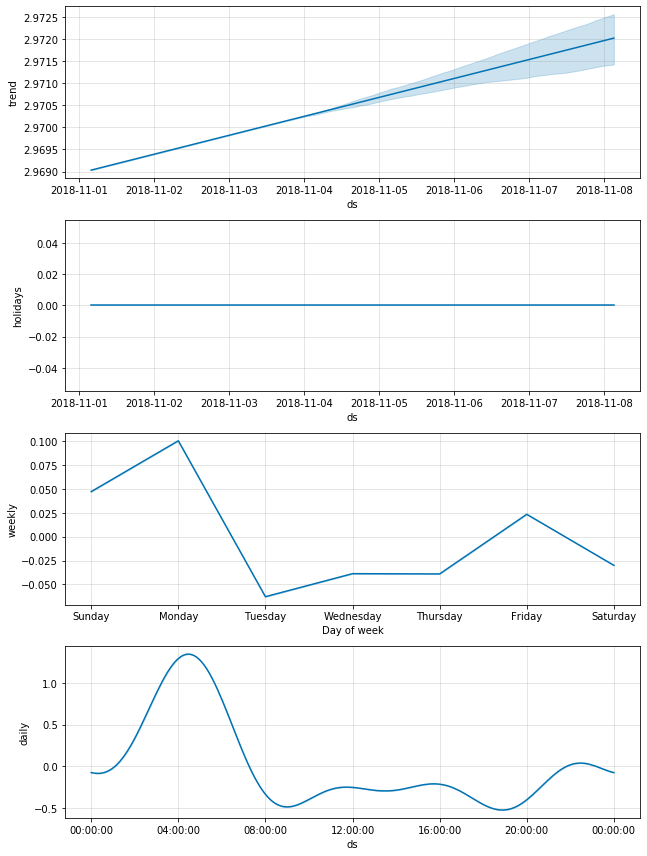

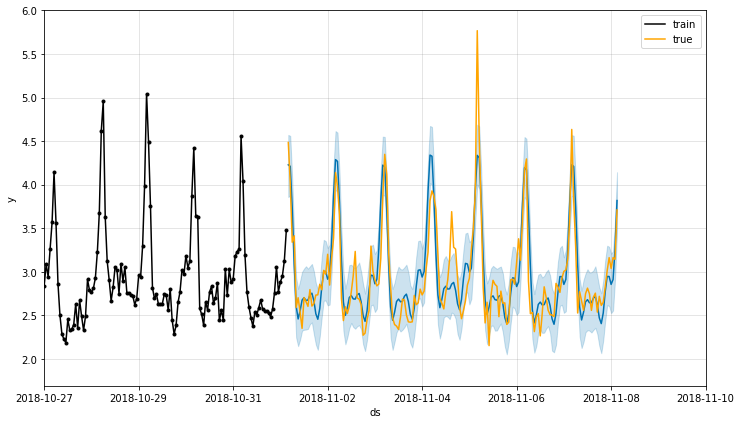

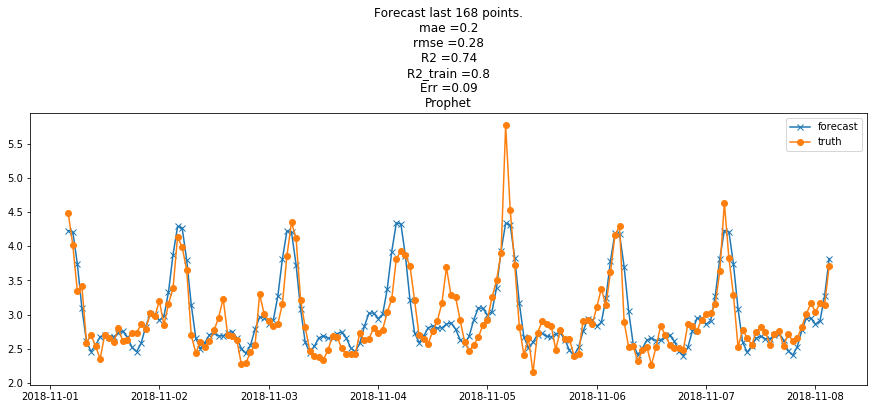

In [775]:
run_model_for_borough_cv(manhattan_trip, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Manhattan model - R2_train = 0.801, R2_test = 0.771, RMSE = 0.282

0.20476622290282984 0.0824007419895045 2.220279946510541


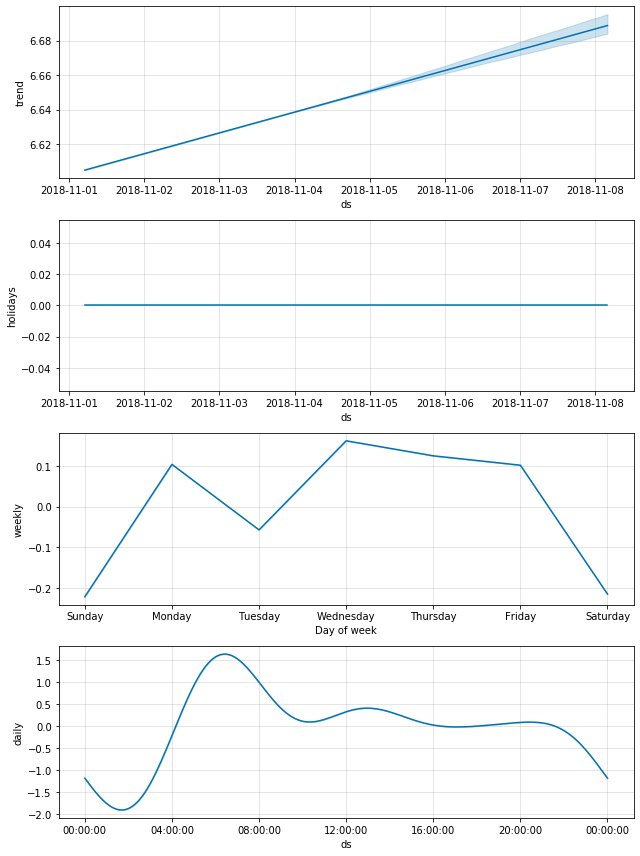

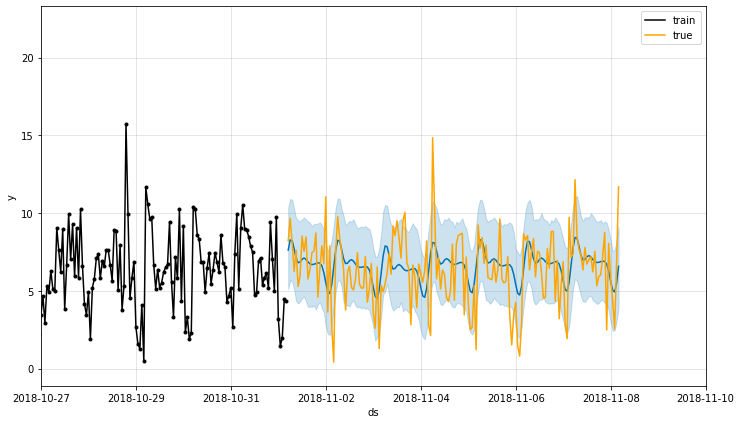

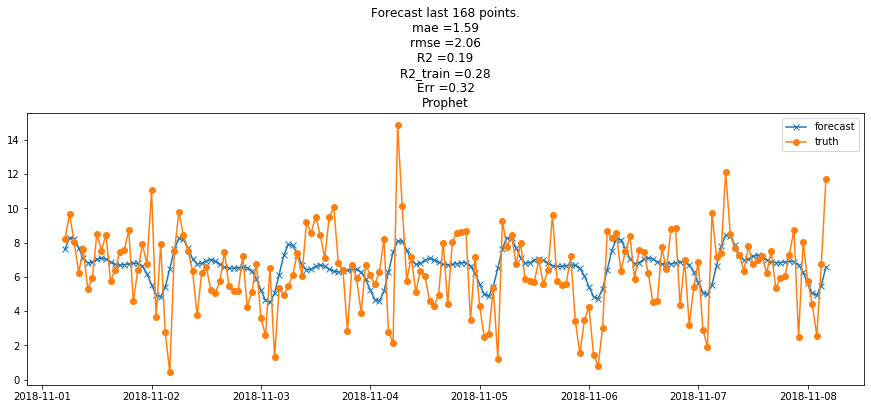

In [776]:
run_model_for_borough_cv(bronx_trip, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Bronx model - R2_train = 0.205, R2_test = 0.082, RMSE = 2.220

In [ ]:
run_model_for_borough_cv(brooklyn_trip, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1)

#### Brooklyn model - R2_train = 0.480, R2_test = 0.418, RMSE = 0.886

0.430633825505158 0.4538655444060116 1.0075514444608036


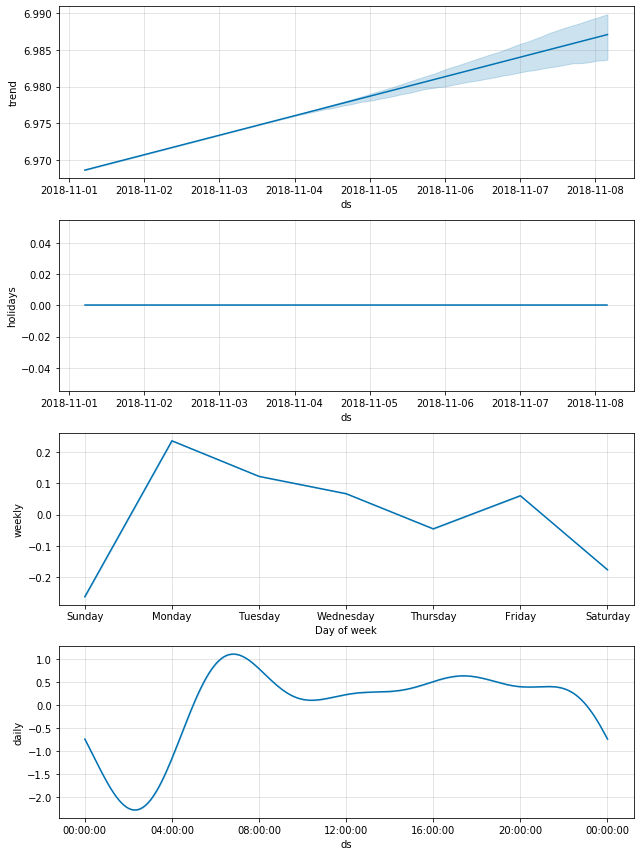

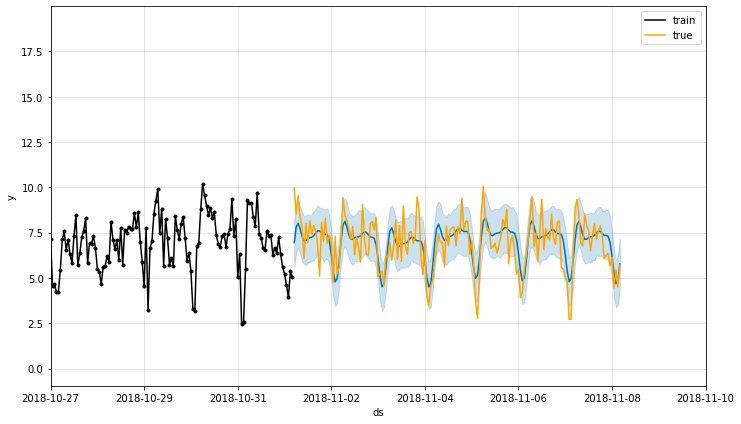

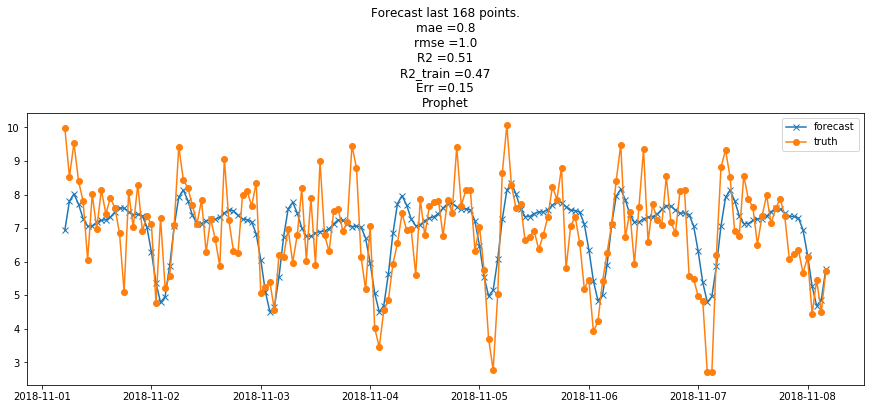

In [803]:
queens_trip_forecas_hol = run_model_for_borough_cv(queens_trip, exog, nfolds = 5, periods = 168, freq='h', include_holidays = True, add_regressors = False, show = -1);

#### Queens model - R2_train = 0.431, R2_test = 0.454, RMSE = 1.007

### Average trip distance forecast - adding exogenous variables

#### Manhattan

In [778]:
manhattan_trip_exog = pd.DataFrame(manhattan_trip.copy()).reset_index()
manhattan_trip_exog.columns = ['ds', 'y']
manhattan_trip_exog = manhattan_trip_exog.join(exog)

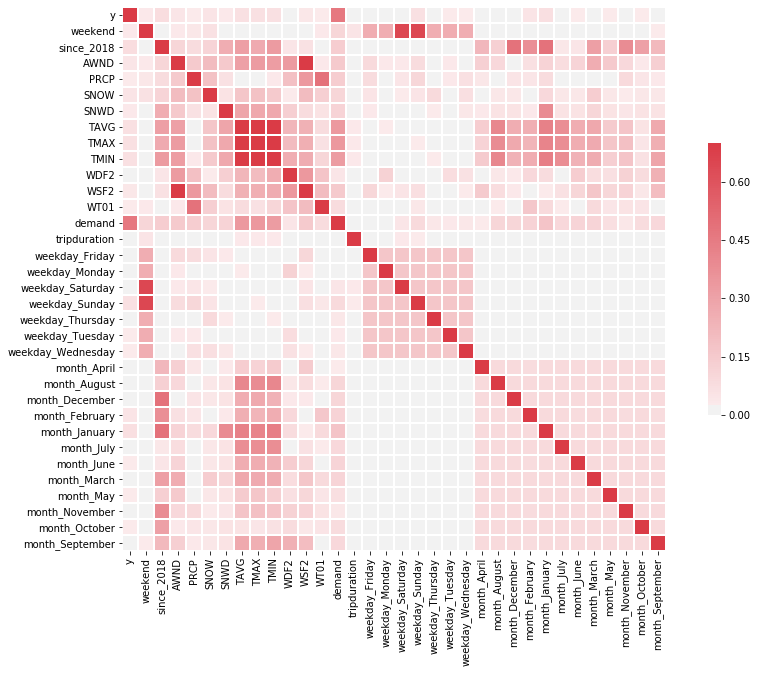

In [779]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(manhattan_trip_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

#### Bronx

In [787]:
bronx_trip_exog = pd.DataFrame(bronx_trip.copy()).reset_index()
bronx_trip_exog.columns = ['ds', 'y']
bronx_trip_exog = bronx_trip_exog.join(exog)

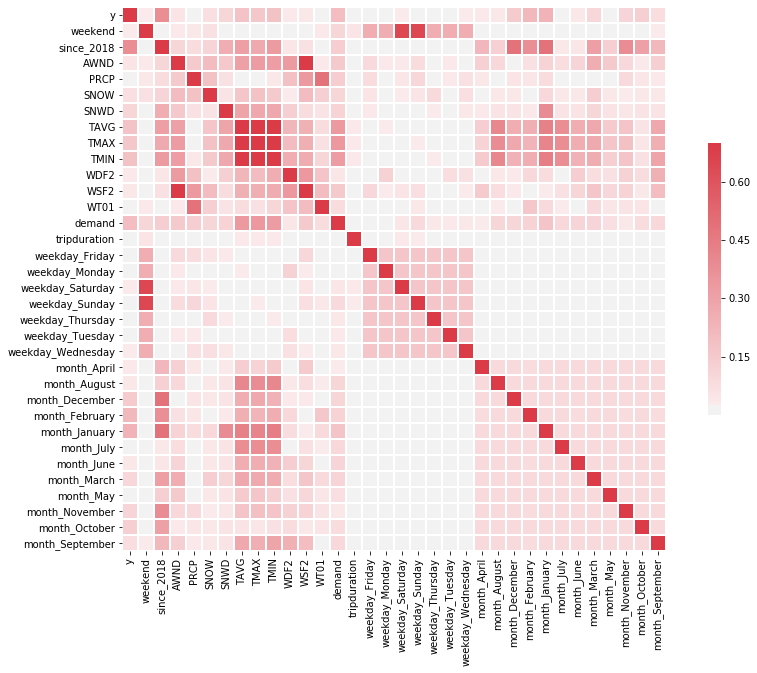

In [788]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(bronx_trip_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [789]:
bronx_trip_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,2.511148,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,4.117115,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,3.471763,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,2.992060,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,2.569426,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


#### Brooklyn

In [790]:
brooklyn_trip_exog = pd.DataFrame(brooklyn_trip.copy()).reset_index()
brooklyn_trip_exog.columns = ['ds', 'y']
brooklyn_trip_exog = brooklyn_trip_exog.join(exog)

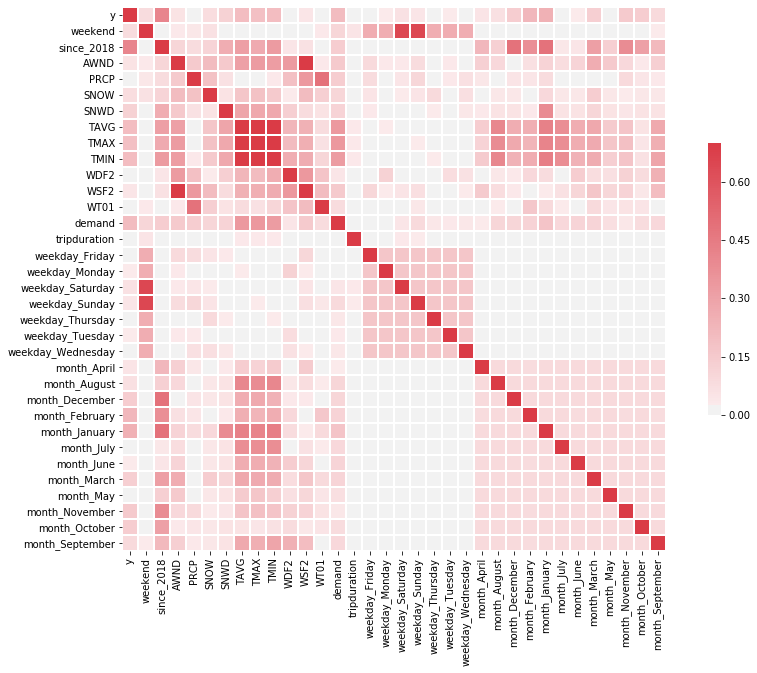

In [791]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(brooklyn_trip_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [792]:
brooklyn_trip_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,3.585136,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,4.279391,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,4.091455,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,4.215932,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,3.030142,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


#### Queens

In [793]:
queens_trip_exog = pd.DataFrame(queens_trip.copy()).reset_index()
queens_trip_exog.columns = ['ds', 'y']
queens_trip_exog = queens_trip_exog.join(exog)

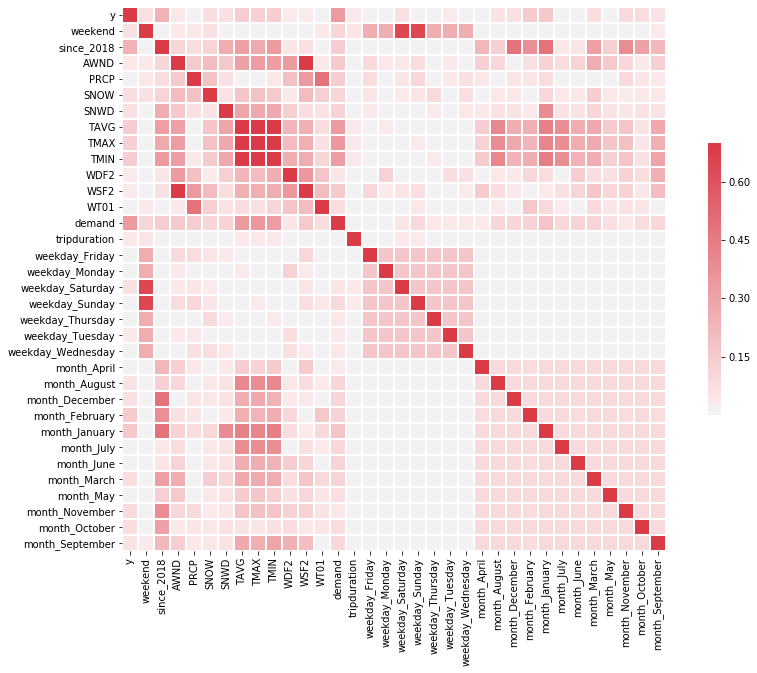

In [794]:
plt.figure(figsize = (15,10))
sns.heatmap(abs(queens_trip_exog.corr()),  cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [795]:
queens_trip_exog.head()

,ds,y,weekend,since_2018,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,2018-01-01 00:00:00,4.997645,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,4.643903,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,4.091832,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,4.179483,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,4.702720,0,0,17.67,0.0,0.0,0.0,12.0,18.0,...,0,0,1,0,0,0,0,0,0,0


### Regressors: weekday, since_2018, weather

0.8064920068891233 0.7746200502539626 0.279974739464136


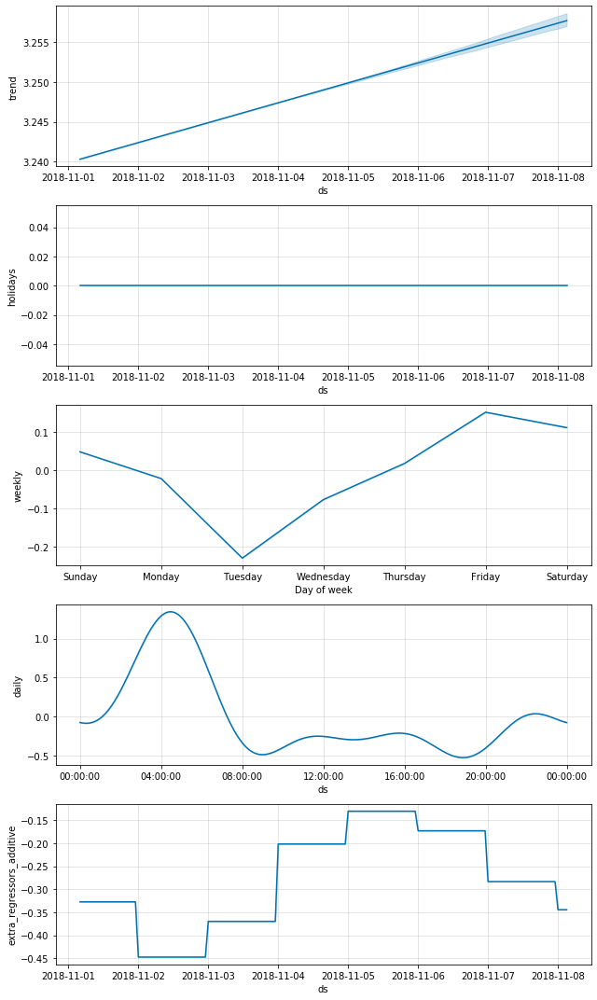

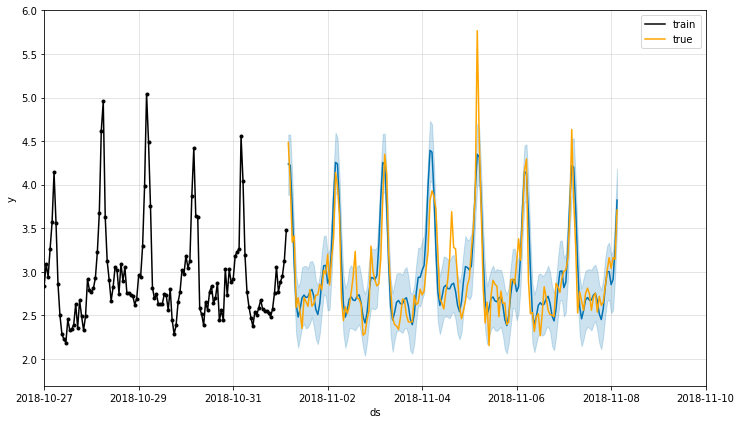

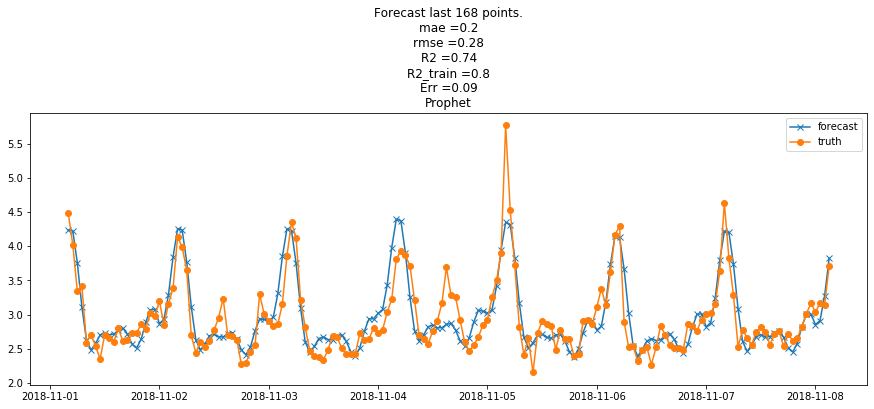

In [780]:
manhattan_trip_forecast = run_model_for_borough_cv(manhattan_trip, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekday_Friday', 'weekday_Monday', 
                                                                     'weekday_Saturday','weekday_Sunday', 
                                                                     'weekday_Thursday', 'weekday_Tuesday',
                                                                     'weekday_Wednesday', 'weekend', 'since_2018', 
                                                                     'SNOW','WT01', 'TAVG'])

#### Manhattan model - R2_train = 0.806, R2_test = 0.775, RMSE = 0.280

### Regressors: weekend, since_2018, CityBike demand

0.2060285345645129 0.0841122441990427 2.2184610333686385


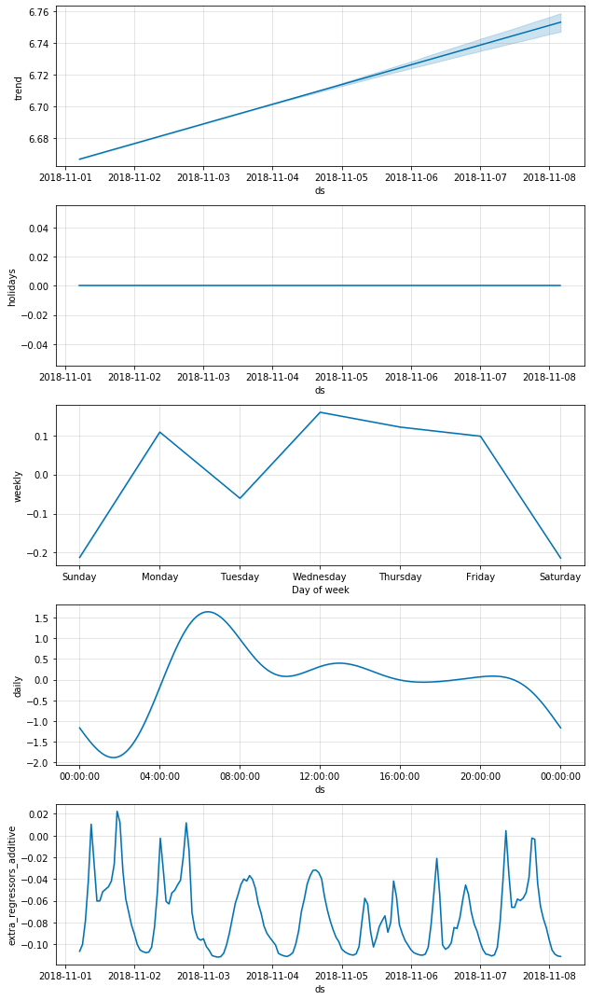

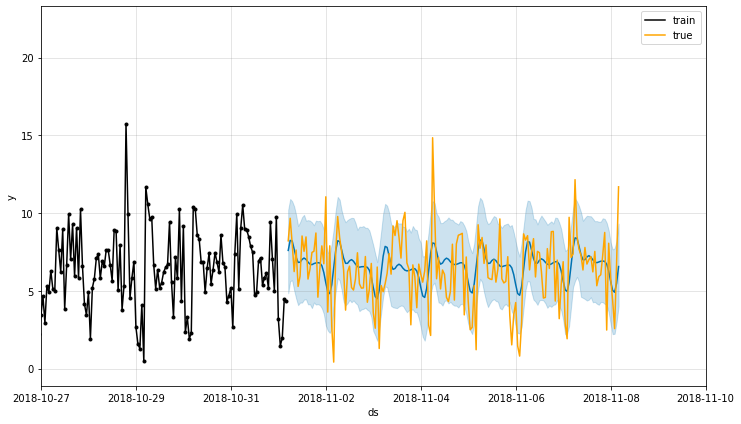

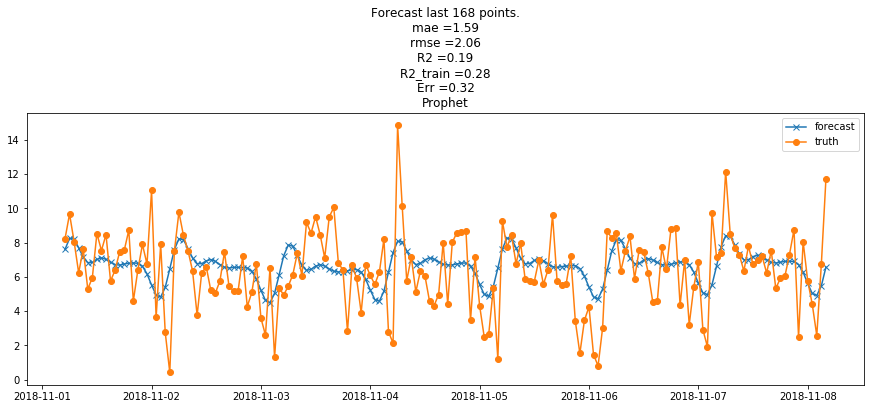

In [782]:
bronx_trip_forecast = run_model_for_borough_cv(bronx_trip, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekend', 'since_2018', 'demand'])

#### Bronx model - R2_train = 0.206, R2_test = 0.084, RMSE = 2.218

0.48322805587178336 0.4263591190951626 0.8795893082465639


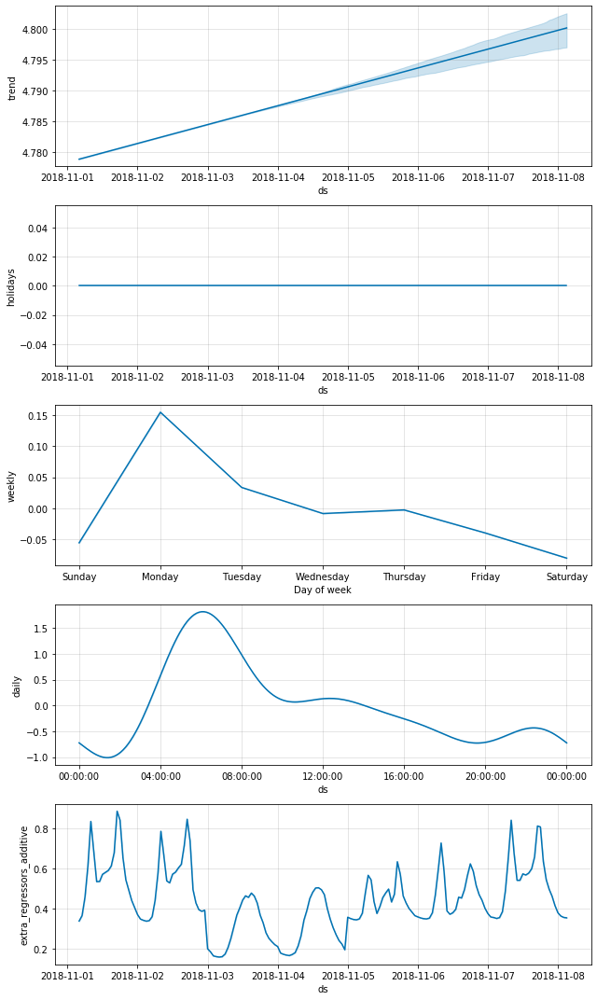

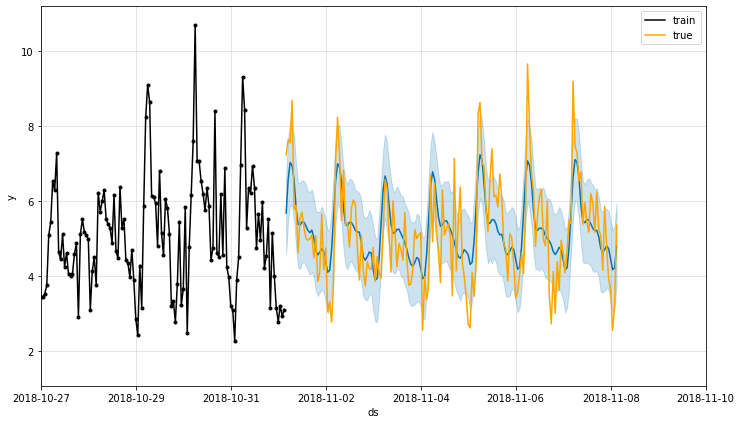

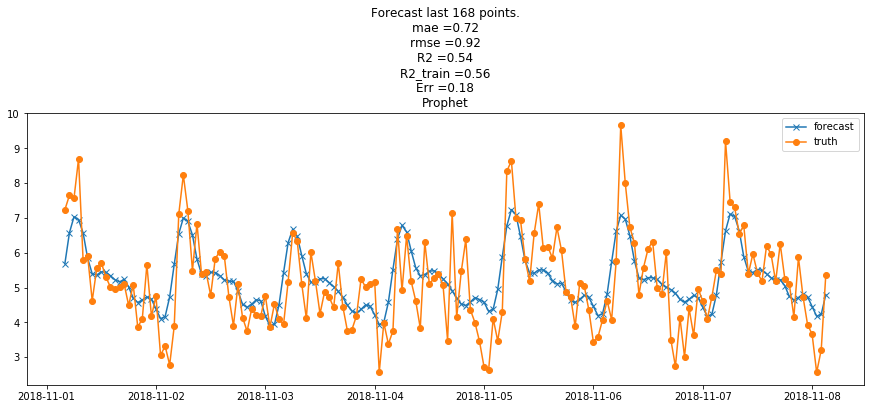

In [783]:
brooklyn_trip_forecast = run_model_for_borough_cv(brooklyn_trip, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekend', 'since_2018', 'demand'])

#### Brooklyn model - R2_train = 0.483, R2_test = 0.426, RMSE = 0.880

0.4312578431344324 0.4516487577750029 1.009778529044789


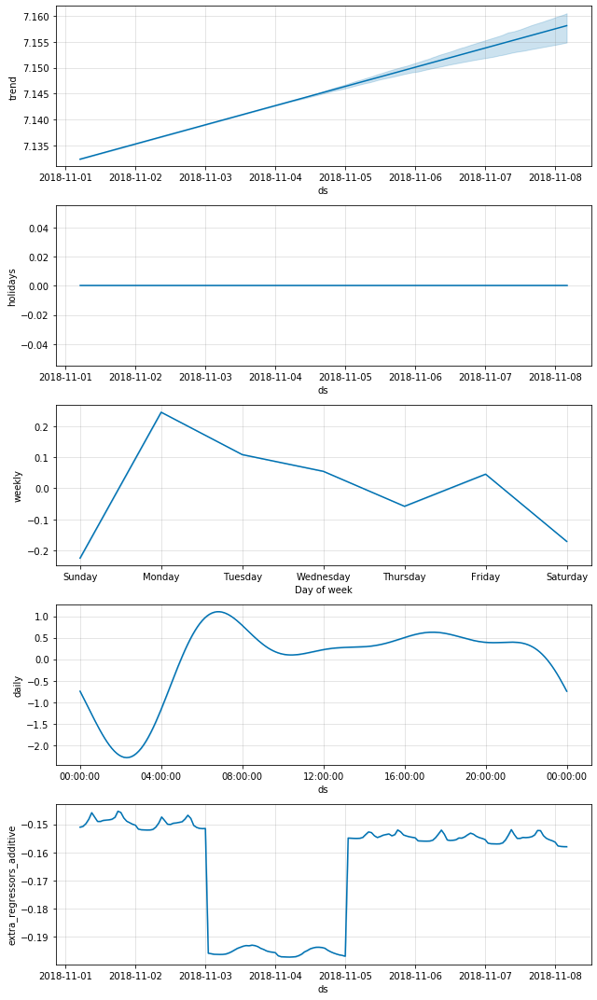

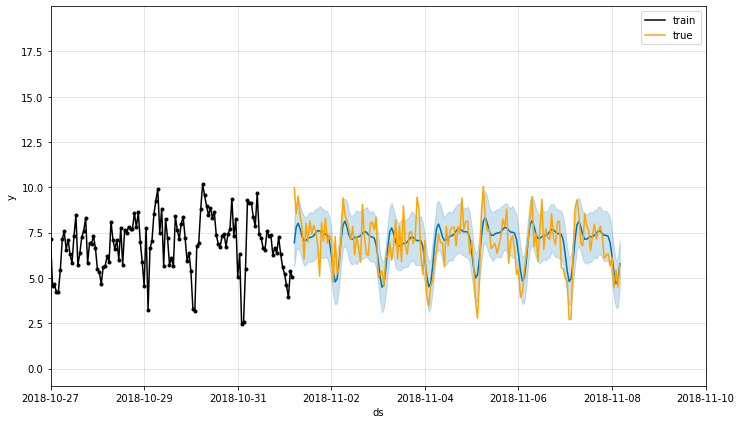

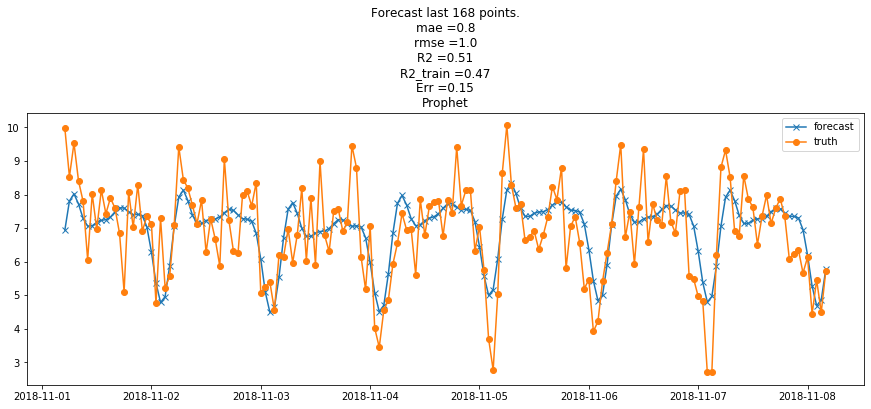

In [784]:
queens_trip_forecast = run_model_for_borough_cv(queens_trip, exog, nfolds = 5, periods = 168, 
                                                   freq='h', include_holidays = True, 
                                                   add_regressors = ['weekend', 'since_2018', 'demand'])

#### Queens model - R2_train = 0.431, R2_test = 0.452, RMSE = 1.010

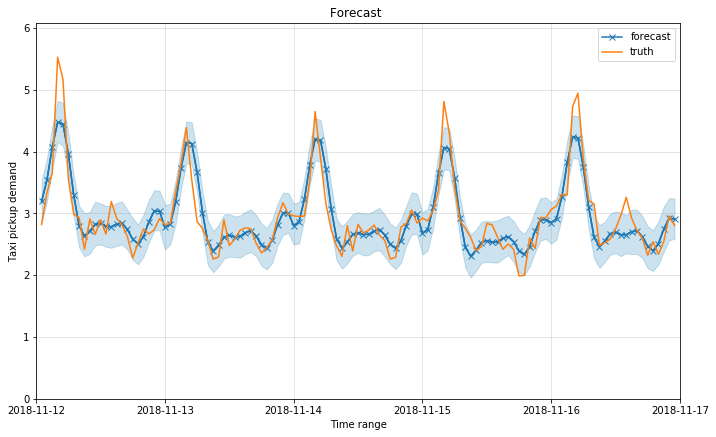

In [786]:
make_prediction_for_borough(manhattan_trip_exog,manhattan_trip_forecast[-1][-4], date1='2018-11-12', date2 = '2018-11-17')

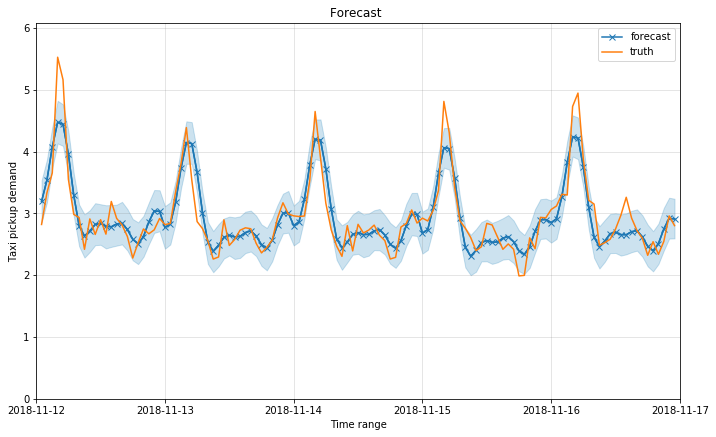

In [812]:
make_prediction_for_borough(manhattan_trip_exog,manhattan_trip_forecast[-1][-4], date1='2018-11-12', date2 = '2018-11-17')

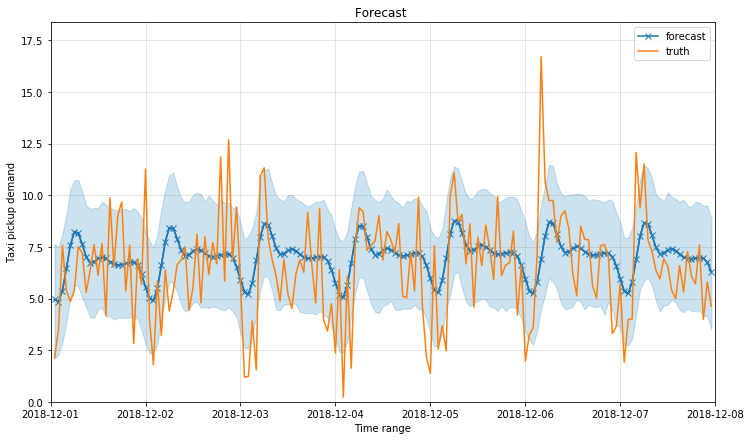

In [805]:
make_prediction_for_borough(bronx_trip_exog, bronx_trip_forecast_base[-1][4],date1='2018-12-01', date2 = '2018-12-08')

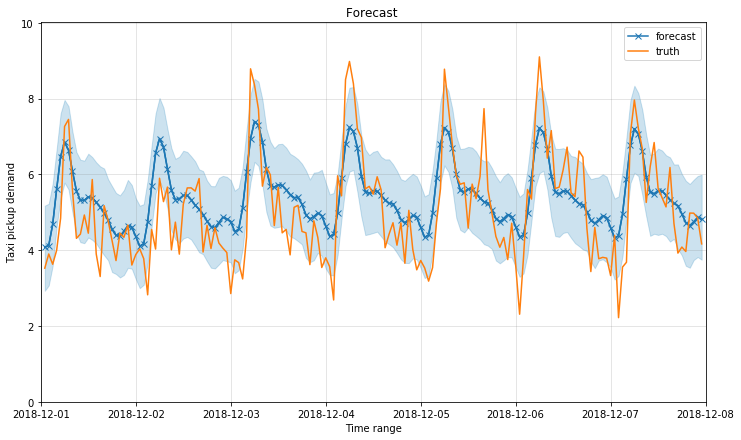

In [797]:
make_prediction_for_borough(brooklyn_trip_exog, brooklyn_trip_forecast[-1][4],date1='2018-12-01', date2 = '2018-12-08')

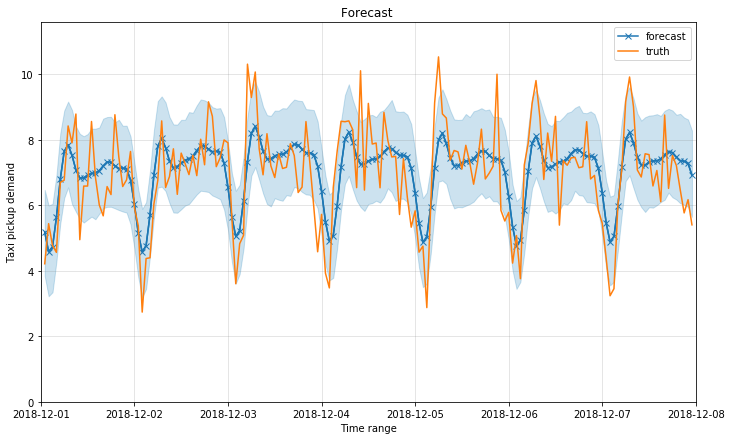

In [809]:
make_prediction_for_borough(queens_trip_exog, queens_trip_forecas_hol[-1][4],date1='2018-12-01', date2 = '2018-12-08')

Save models to pickle file

In [800]:
pkl_path = "./models/manhattan_trip.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(manhattan_trip_forecast[-1][4], f)

In [806]:
pkl_path = "./models/bronx_trip.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(bronx_trip_forecast_base[-1][4], f)

In [802]:
pkl_path = "./models/brooklyn_trip.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(brooklyn_trip_forecast[-1][4], f)

In [810]:
pkl_path = "./models/queens_trip.pkl"
with open(pkl_path, "wb") as f:
    # Pickle the 'Prophet' model
    pickle.dump(queens_trip_forecas_hol[-1][4], f)

Save dataframes to files

In [808]:
manhattan_trip_exog.to_csv("./models/manhattan_trip_exog.csv", index = False)
bronx_trip_exog.to_csv("./models/bronx_trip_exog.csv", index = False)
brooklyn_trip_exog.to_csv("./models/brooklyn_trip_exog.csv", index = False)
queens_trip_exog.to_csv("./models/queens_trip_exog.csv", index = False)